Notebook for composite Bayesian Optimization on Tilt and Thickness<br>
Written by Dasol Yoon and Poompol Buathong<br>
Last edited on Jan 6, 2025

Different number of patches

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

C:\Users\dasol\anaconda3\envs\orieEnv3\python.exe
3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]
sys.version_info(major=3, minor=11, micro=5, releaselevel='final', serial=0)


In [2]:
%matplotlib inline

In [3]:
import torch
import random
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.fit import fit_gpytorch_model
from botorch.acquisition.objective import GenericMCObjective
from botorch.models.gp_regression import FixedNoiseGP, SingleTaskGP
from botorch.acquisition.monte_carlo import qExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.optim import optimize_acqf

import math
import numpy as np
import matplotlib.pyplot as plt

# use a GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dtype = torch.double
print(device)

cuda


In [8]:
from ase.io import read
from abtem import *

In [4]:
tkwargs = {"dtype":torch.double}#,
           #"device": torch.device(device)}

In [5]:
tkwargs

{'dtype': torch.float64}

In [14]:
import scipy.ndimage
import glob
from datetime import datetime
import warnings
from PIL import Image

In [7]:
#change the file path to where the dataset is/will be stored

fpath = 'D:/Lab/Experiments/20231100-TiltML/data/3var/'
#fpath = '/Users/dash/Documents/Cornell/BOtt/simulation/'

In [10]:
#load the crystal unitcell
atoms = read('./temp/SrTiO3.cif')
print("x,y,z extent of the unit cell ($\AA$): ",atoms.cell)
dx = atoms.cell[2,2] #step in thickness in angstrom
print('Thickness step: ',dx,' ($\AA$)')

x,y,z extent of the unit cell ($\AA$):  Cell([3.91270131, 3.91270131, 3.91270131])
Thickness step:  3.91270131  ($\AA$)


In [11]:
def simulate(x,tX,tY):
    #----variables----
    #x: thickness in angstrom
    #start = datetime.now()
    
    numUC = int(x/dx)#number of unit cells in z direction (variable x)
    #tag = '/vac_conv19p1_volt200kV_tilt0each_{:04d}.tiff'.format(int(numUC*dx))
    sc = atoms * (16,16,numUC) #todo: may need to do the rounding instead
    #sc.center(axis=(0,1),vacuum=10)
    
    #fp = FrozenPhonons(sc,20,{'Sr':.1,'Ti':.1,'O':.1},seed=1)
    fp = FrozenPhonons(sc,20,{'Sr':.088,'Ti':.0746,'O':.0963},seed=1)
    potential = Potential(fp,gpts=512, projection='infinite',#
                          #sampling=0.15, projection='infinite', #,sampling=0.06
                          slice_thickness= 2,storage  = 'gpu', precalculate=True,
                          device='gpu', parametrization='kirkland')
    probe = Probe(energy=200e3, semiangle_cutoff=19.1,tilt=(tX,tY),
                  device='gpu')
    probe.grid.match(potential)
    # print(probe.cutoff_scattering_angles)
    
    pixelated_detector = PixelatedDetector(max_angle=45) #temporary limit for thickness
 #29.345 33.258 
    gridscan = GridScan(start=[29.345,29.345], end=[33.258 ,33.258],sampling=.3)
    #scan = GridScan(start=[19.7,19.7], end=[27.6,27.6],sampling=.2)

    pixelated_measurement = probe.scan(gridscan, pixelated_detector, potential,pbar=False)
    pacbed = np.mean(pixelated_measurement.array,axis=(0,1)).astype(np.float32)
    
    #end = datetime.now() 
    # print('Time elapsed (hh:mm:ss.ms):  {}  || thickness: {} $\AA$  || shape: {}'.format(end-start,
    #                                                                                     numUC*dx,
                                                                                        # pacbed.shape))
    
    return pacbed

In [49]:
def load(x):
    #----variables----
    #x: [[thickness [angstrom], tilt]]
    #returns pre-simulated PACBED image.
    thickness=x[0,0].item()
    tilt1 = x[0,1].item()   #20250312: make it into int here?
    tilt2 = x[0,2].item()   

    numUC = int(thickness/dx)#number of unit cells in z direction (variable x)
    tag = '{:04d}.tiff'.format(int(numUC*dx))
    imgPath = 'TiltX_{}_TiltY_{}_Thickness_'.format(int(tilt1),int(tilt2)) +tag
    
    try: #load PACBED from the directory
        pacbed = plt.imread(imgPath)
        pacbed = pacbed.astype(np.float32) #added 20241112. bad simulation. crop zeroes.
    except: #simulate
        #print('no such file: ' +imgPath)
        pacbed = simulate(thickness,tilt1,tilt2)
        pacbedImg = Image.fromarray(pacbed)
        pacbedImg.save(fpath+imgPath)

    #pacbed_sqrt = np.sqrt(pacbed) #added 20241017
    #pacbed_norm = pacbed_sqrt/np.mean(pacbed_sqrt) #added 20241017; "standardize" the data...? Isn't it redundant with the normalization?
    pacbed_norm = (pacbed-np.min(pacbed))/(np.max(pacbed)-np.min(pacbed)) #normalize 0-1
    #pacbed_smol = scipy.ndimage.zoom(pacbed_norm.astype(np.float64),20/pacbed_norm.shape[0],order=1) #Nov12: comment out
    #pacbed_norm = (pacbed_smol-np.min(pacbed_smol))/(np.max(pacbed_smol)-np.min(pacbed_smol)) #normalize 0-1 #Nov12: comment out
    

    #unicode for angstrom
    #print('thickness: {} \u212B  || shape: {} || filename: '.format(x, pacbed_norm.shape)+imgPath[90:])
    
    return torch.Tensor(pacbed_norm)#.reshape(-1) #PB: change to tensor

In [15]:
start = datetime.now()
load(np.array([[250,5,-10]]))
end = datetime.now()
print(end-start)

0:01:11.124288


In [16]:
# This is the correct value of the parameter
x_real = np.array([[310,5,-10]])

# Get the PACBED at the thickness of x_real
y_raw = load(x_real) #[simulate(x_val) for x_val in x_obs]

# Upper and lower bounds for our search
lower = 10
upper = 500

In [31]:
temp = (
            draw_sobol_samples(
                bounds=torch.tensor([[lower,-10,-10], [upper,10,10]]).to(torch.double),
                n=n_initial_points,
                q=1,
            )
        ).to(**tkwargs)

In [34]:
temp2 = temp[0,...]
temp2

tensor([[337.4983,   6.1416,  -9.6269]], dtype=torch.float64)

In [48]:
x_real[0,0].item()

310

In [44]:
temp2[0,0].item()

337.4983251094818

In [57]:
temp_y = load( np.array( [[410,1]]) )

#### testing

In [16]:
y_raw[20:-20,20:-20].shape

torch.Size([110, 110])

In [19]:
110**2

12100

In [20]:
150**2-110**2

10400

In [18]:
110**2/(150**2-110**2)

1.1634615384615385

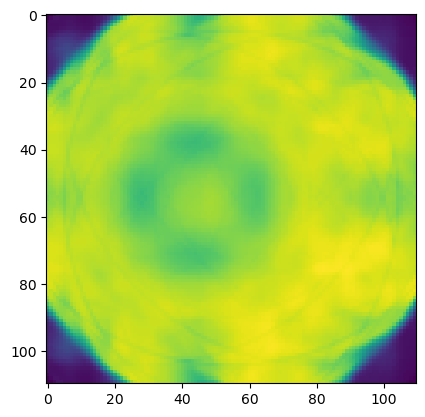

In [15]:
plt.figure()
plt.imshow(y_raw[20:-20,20:-20])

In [23]:
mask = np.zeros((150,150)).astype(bool)
mask[20:-20,20:-20] = True

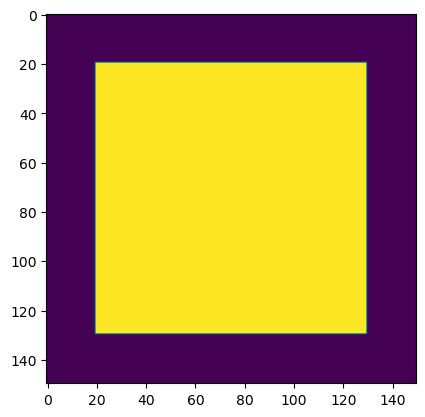

In [27]:
plt.imshow(mask)

In [30]:
len(y_raw[~mask])

10400

#### back to the code

In [20]:
def twoVertTiles(y_raw):
    arr = torch.Tensor([]);
    ind = y_raw.shape[0]//2
    arr = torch.cat((arr, torch.mean(y_raw[:,:ind]).unsqueeze(-1) *1e1), dim=-1)
    arr = torch.cat((arr, torch.mean(y_raw[:,ind:]).unsqueeze(-1) *1e1), dim=-1)
    return arr

In [21]:
def domainKnowledgeTile(y_raw):
    #create a mask to divide the image into central and peripheral regions
    ind = y_raw.shape[0]
    mask = np.zeros((ind,ind)).astype(bool)
    mask[70:-70,70:-70] = True #central region of the image #todo systematic way: CHT?
    
    arr = torch.Tensor([]);
    arr = torch.cat((arr, torch.mean(y_raw[mask]).unsqueeze(-1) *1e1), dim=-1)
    arr = torch.cat((arr, torch.mean(y_raw[~mask]).unsqueeze(-1) *1e1), dim=-1)
    return arr

In [51]:
#TODO: use thinner one for test case
#PB changed to tensor
#TODO: Currently hard coded for the patch size. Need to modify later
def squareTiles(y_raw, **kwargs):
    numTiles= kwargs.get('numTiles',1) #default numTiles value
    arr = torch.Tensor([]);
    pixPerTile = y_raw.shape[0]//numTiles
    for i in range(numTiles):
        for j in range(numTiles):
            tile = torch.mean(y_raw[...,pixPerTile*i:pixPerTile*(i+1),...,pixPerTile*j:pixPerTile*(j+1)]).unsqueeze(-1)
            arr = torch.cat((arr,tile*1e1),dim=-1)
    return arr

In [76]:
# #TODO: use thinner one for test case
# #PB changed to tensor
# #TODO: Currently hard coded for the patch size. Need to modify later
# def intoPatches(y_pred_raw, numPat,numPx):
#     arr = torch.Tensor([]);
#     for i in range(numPat):
#         for j in range(numPat):
#             patch = torch.mean(y_pred_raw[...,numPx*i:numPx*(i+1),...,numPx*j:numPx*(j+1)]).unsqueeze(-1)
#             arr = torch.cat((arr,patch*1e1),dim=-1)
#     return arr #unpack part ss

In [22]:
def pixelSSE(y_cand_raw,y_ref_raw):
    err = y_cand_raw-y_ref_raw # #one image y_obs: image I want to measure
    return err.pow(2).sum().unsqueeze(-1) #np.power(err,2).sum().unsqueeze(-1) 

In [23]:
def tileSSE(y_cand_tiles,y_ref_tiles): #patches of y and RSS in 10 variables
    return (y_cand_tiles-y_ref_tiles).pow(2).sum().unsqueeze(-1)

In [52]:
def computeY(y_cand_raw,y_ref_raw, method, **kwargs):
    y_cand_tiles = method(y_cand_raw,**kwargs)
    y_ref_tiles = method(y_ref_raw,**kwargs)
    tileTerm = tileSSE(y_cand_tiles,y_ref_tiles)
    pixelTerm = pixelSSE(y_cand_raw, y_ref_raw)
    return torch.cat((y_cand_tiles,pixelTerm-tileTerm),dim=-1).unsqueeze(0).to(**tkwargs) #y_pred

##### testing

In [41]:
tempTiles = domainKnowledgeTile(y_raw)  # compute reference values for patches

In [42]:
tempTiles

tensor([8.1160, 1.4350])

In [45]:
tempTerm = computeY(y_raw, y_raw,twoVertTiles)  # compute reference values

In [46]:
tempTerm

tensor([[4.9785, 5.0773, 0.0000]], dtype=torch.float64)

In [62]:
computeY(y_raw,y_raw,twoVertTiles)

tensor([[4.9785, 5.0773, 0.0000]], dtype=torch.float64)

In [61]:
computeY(temp_y,y_raw,twoVertTiles)

tensor([[  4.4854,   4.6115, 150.5838]], dtype=torch.float64)

In [51]:
def tempFunc(y_pred,y_ref): #TODO: using pixelSSE(y_pred_raw) may enhance the speed a bit?
    return -((y_pred[...,:-1]-y_ref[...,:-1]).pow(2).sum()+y_pred[...,-1]).unsqueeze(-1)
    # return - (np.power( y_pred[:9]-y_obsC[:9], 2).sum() + y_pred[9] ) #pixelTerm - patchTerm #question: isn't it just the pixelTerm?

In [63]:
tempFunc(computeY(temp_y,y_raw,twoVertTiles),computeY(y_raw,y_raw,twoVertTiles))

tensor([[-151.0439]], dtype=torch.float64)

In [64]:
tempFunc(computeY(y_raw,y_raw,twoVertTiles),computeY(temp_y,y_raw,twoVertTiles))

tensor([[-0.4601]], dtype=torch.float64)

In [65]:
pixelSSE(temp_y,y_raw)

tensor([151.0439])

In [20]:
def computeObjectiveC(y_pred): #TODO: using pixelSSE(y_pred_raw) may enhance the speed a bit?
    return -((y_pred[...,:-1]-y_obsC[...,:-1]).pow(2).sum()+y_pred[...,-1]).unsqueeze(-1)
    # patchTerm +pixelTerm-patchTerm

In [80]:
def classicalObj(x):
    return - pixelSSE(load(x))

### todo: plot
NOTE: It doesn't make sense to plot the `computeObjectiveC` because it's just getting the pixel SSE.

In [21]:
#patch size 3
arr_obj3 = np.array([])
for i in range(10,1000,10): #start stop step
    arr_obj3 = np.append(arr_obj3, patchesSSE(intoPatches(load( np.array([[i,4]]) ))) )
obj_real = patchesSSE(y_patC)

Text(0.5, 1.0, 'numPatches: 3')

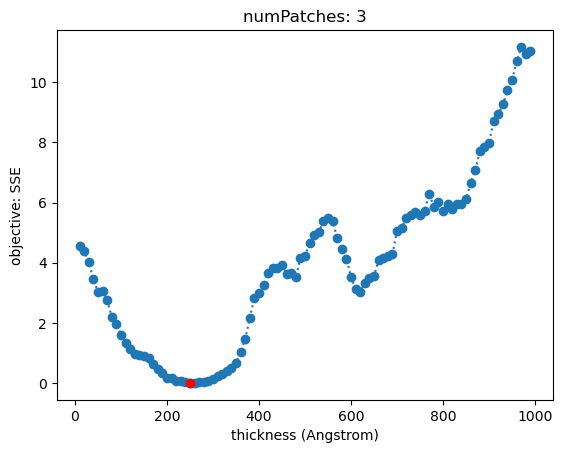

In [24]:
#patch size 3
#fig,ax = plt.subplots(figsize=(6,4))
plt.plot(range(10,1000,10), arr_obj3, 'o:')
plt.xlabel('thickness (Angstrom)')
plt.ylabel('objective: SSE')
plt.plot(x_real[0,0],obj_real,'ro')
plt.title('numPatches: {}'.format(numPatches))

In [23]:
arr_obj3

array([4.56975460e+00, 4.39461088e+00, 4.02302265e+00, 3.46507144e+00,
       3.01033831e+00, 3.06901622e+00, 2.76367068e+00, 2.18919826e+00,
       1.96364069e+00, 1.59551823e+00, 1.31435692e+00, 1.14158762e+00,
       9.72493947e-01, 9.40157354e-01, 8.79405618e-01, 8.25013816e-01,
       6.18262708e-01, 4.77560520e-01, 3.44841063e-01, 1.70270920e-01,
       1.57318681e-01, 5.11716679e-02, 6.77638575e-02, 3.05527654e-02,
       0.00000000e+00, 4.01784619e-03, 2.19923332e-02, 2.46031061e-02,
       5.74375466e-02, 1.14868626e-01, 2.32572347e-01, 2.98054188e-01,
       4.08283144e-01, 5.05745173e-01, 6.52940512e-01, 1.04349792e+00,
       1.45837045e+00, 2.17596507e+00, 2.82487082e+00, 3.00676036e+00,
       3.24860811e+00, 3.67188931e+00, 3.83383226e+00, 3.81915283e+00,
       3.91244912e+00, 3.61765528e+00, 3.64465308e+00, 3.52925038e+00,
       4.15206003e+00, 4.23710680e+00, 4.64366245e+00, 4.91890955e+00,
       5.03047037e+00, 5.37817860e+00, 5.48576641e+00, 5.37834358e+00,
      

### back to the code

In [67]:
def add_data(new_x,y_ref_raw, x=None, y=None, obj=None):

    if x is None:
        x = torch.tensor([],**tkwargs)
    if y is None:
        y = torch.tensor([],**tkwargs)
    if obj is None:
        obj = torch.tensor([],**tkwargs)
    new_y = load(new_x) # y is a tensor
    new_obj = - pixelSSE(new_y,y_ref_raw) # this is our objective

    # x and obj are both 2D tensors that are nx1
    # y is a 3D tensor that is nx (numPatches**2 + 1) 
    x = torch.cat((x, new_x),dim=0)
    y = torch.cat((y, new_y),dim=0)
    obj = torch.cat((obj, torch.tensor(new_obj.clone().detach().unsqueeze(0))),dim=0)
    return x.to(**tkwargs), y.to(**tkwargs), obj.to(**tkwargs)

In [62]:
def add_dataC(new_x,y_ref_raw,method, x=None, y=None, obj=None,**kwargs):

    if x is None:
        x = torch.tensor([],**tkwargs)
    if y is None:
        y = torch.tensor([],**tkwargs)
    if obj is None:
        obj = torch.tensor([],**tkwargs)
    y_cand_raw = load(new_x)
    new_y = computeY(y_cand_raw,y_ref_raw,method,**kwargs) # y is a tensor
    new_obj = -pixelSSE(y_cand_raw,y_ref_raw).unsqueeze(-1) #computeObjectiveC(new_y) # this is our objective

    # x and obj are both 2D tensors that are nx1
    # y is a 3D tensor that is nx (numPatches**2 + 1) 
    x = torch.cat((x, new_x),dim=0)
    y = torch.cat((y, new_y),dim=0)
    obj = torch.cat((obj, torch.tensor(new_obj.clone().detach())),dim=0)
    return x.to(**tkwargs), y.to(**tkwargs), obj.to(**tkwargs)

In [26]:
from botorch.sampling.normal import IIDNormalSampler #import package
from botorch.sampling.normal import SobolQMCNormalSampler
from botorch.utils.sampling import draw_sobol_samples

In [36]:
# Plot the posterior for a single simulation output y
def plot_posterior_classic(ax, model, gridX1, gridX2, train_x, train_y, legend=True):
    with torch.no_grad(): # no need for gradients
        test_x = torch.stack([gridX1.flatten(),gridX2.flatten()],dim=1)
        # compute posterior
        posterior_x_domain = model.posterior(test_x.to(**tkwargs))

        inner_sample = IIDNormalSampler(sample_shape=torch.Size([2048])) #define based sample
        samples = inner_sample(posterior_x_domain) # do the sample
        
        samples_obj = -pixelSSE(samples) #DY: make it objective only
        
        samplesmedian,_ = samples_obj.median(dim=0) # compute median (you can use mean)
        samples025 = samples_obj.quantile(q=0.25,dim=0) #compute quantile
        samples0975=samples_obj.quantile(q=0.975,dim=0) #compute quantile
         
        # Plot training points as black stars
        ax.plot(train_x[:, 0].cpu().numpy(), 
                train_x[:, 1].cpu().numpy(), 
                -pixelSSE(train_y).cpu().numpy().squeeze(),'k*')

        # Plot posterior means as a surface 
        post = ax.plot_surface(gridX1, gridX2, 
                               samplesmedian.cpu().reshape(gridX1.shape), #.detach() is not changing the device
                               cmap='autumn_r', alpha=0.5)
        
        # Upper and lower bounds
        ax.plot_wireframe(gridX1,gridX2,
                          samples025.cpu().reshape(gridX1.shape),
                          alpha=0.5) #lw=0.5, rstride=2, cstride=2,
        ax.plot_wireframe(gridX1,gridX2,
                          samples0975.cpu().reshape(gridX1.shape),alpha=0.5)
        ax.set_xlabel('thickness');ax.set_ylabel('tilt')
        
    if legend:
        plt.legend(['Observed Data', 'Mean', 'Credible Interval'])

In [68]:
# Plot the posterior for a single simulation output y
def plot_posterior_composite(ax, model, gridX1, gridX2, train_x, train_y, legend=True):
    with torch.no_grad(): # no need for gradients
        test_x = torch.stack([gridX1.flatten(),gridX2.flatten()],dim=1)
        # compute posterior
        posterior_x_domain = model.posterior(test_x.to(**tkwargs))

        inner_sample = IIDNormalSampler(sample_shape=torch.Size([2048])) #define based sample
        samples = inner_sample(posterior_x_domain) # do the sample
        
        samples_obj = g(samples) #DY: make it objective only
        
        samplesmedian,_ = samples_obj.median(dim=0) # compute median (you can use mean)
        samples025 = samples_obj.quantile(q=0.25,dim=0) #compute quantile
        samples0975=samples_obj.quantile(q=0.975,dim=0) #compute quantile
         
        # Plot training points as black stars
        ax.plot(train_x[:, 0].cpu().numpy(), 
                train_x[:, 1].cpu().numpy(), 
                g(train_y).cpu().numpy().squeeze(),'k*')

        # Plot posterior means as a surface 
        post = ax.plot_surface(gridX1, gridX2, 
                               samplesmedian.cpu().reshape(gridX1.shape), #.detach() is not changing the device
                               cmap='autumn_r', alpha=0.5)
        
        # Upper and lower bounds
        ax.plot_wireframe(gridX1,gridX2,
                          samples025.cpu().reshape(gridX1.shape),
                          alpha=0.5) #lw=0.5, rstride=2, cstride=2,
        ax.plot_wireframe(gridX1,gridX2,
                          samples0975.cpu().reshape(gridX1.shape),alpha=0.5)
        ax.set_xlabel('thickness');ax.set_ylabel('tilt')
        
    if legend:
        plt.legend(['Observed Data', 'Mean', 'Credible Interval'])

In [63]:
def generate_initial_data(n_initial_points,y_ref_raw,method,**kwargs):    
    new_x = (
            draw_sobol_samples(
                bounds=torch.tensor([[lower,-10,-10], [upper,10,10]]).to(torch.double),
                n=n_initial_points,
                q=1,
            )
        ).to(**tkwargs)
    for i in range(n_initial_points):
        if i == 0:
            x,y,obj = add_dataC(new_x[i,...],y_ref_raw,method,**kwargs)
        else:
            x,y,obj = add_dataC(new_x[i,...],y_ref_raw,method,x,y,obj,**kwargs)
    return x,y,obj

In [66]:
def generate_initial_dataClassic(n_initial_points,y_ref_raw):    
    new_x = (
            draw_sobol_samples(
                bounds=torch.tensor([[lower,-10,-10], [upper,10,10]]).to(torch.double),
                n=n_initial_points,
                q=1,
            )
        ).to(**tkwargs)
    for i in range(n_initial_points):
        if i == 0:
            x,y,obj = add_data(new_x[i,...],y_ref_raw)
        else:
            x,y,obj = add_data(new_x[i,...],y_ref_raw,x,y,obj)
    return x,y,obj

Test Fit model and optimizing EI

In [28]:
from botorch.models.transforms import Standardize
from botorch.models.transforms.input import Normalize

In [71]:
#x_domain = torch.linspace(lower, upper, 1000).unsqueeze(-1).to(torch.double)
def plot_model_EI(ax, gridX1, gridX2, model,acqf,iter_no):
    test_x = torch.stack([gridX1.flatten(),gridX2.flatten()],dim=1)

    post_at_x_domain = model.posterior(test_x)
    mean_at_x_domain = post_at_x_domain.mean
    std_at_x_domain = torch.sqrt(post_at_x_domain.variance)
    lo_at_x_domain = mean_at_x_domain-1.96*std_at_x_domain
    up_at_x_domain = mean_at_x_domain+1.96*std_at_x_domain
    
    acqf_val = acqf(x_domain.unsqueeze(-1))
    axis[5,1].set_title(plot_name[count_idx])
    axis[5,1].plot(x_domain,acqf_val.detach().numpy(),color='green',label='EI')
    axis[5,1].plot(new_point.detach().numpy(),new_point_EI.detach().numpy(),marker='*',linestyle='none', markersize=10, color='yellow',label='Candidate')
    axis[5,1].legend()
    plt.suptitle(f"Iteration {iter_no}", fontsize=14, y=0.91)  # Reduce `y` to bring closer
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust subplot grid to fit universal title
    plt.show()

In [72]:
def plotEI(ax,gridX1,gridX2, ei, new_pt):
    test_x = torch.stack([gridX1.flatten(),gridX2.flatten()],dim=1)
    acq = ei.forward(test_x.unsqueeze(1).to(**tkwargs))
    acqValues = acq.detach().cpu().numpy().reshape(gridX1.shape)
    
    # Contour plot of EI over the 2D input space
    ct = ax.contourf(gridX1.numpy(), gridX2.numpy(), 
                     acqValues, cmap='viridis')
    plt.colorbar(ct)
    
    # Mark the new point found by the optimizer
    ax.plot(new_pt[0,0].cpu().numpy(), new_pt[0,1].cpu().numpy(), 'ro')
    
    ax.set_title('Expected Improvement (EI)')
    ax.set_xlabel('Thickness'); ax.set_ylabel('Tilt');

In [ ]:
### 20250312 todo: need to revisit objArr and bestArr

In [70]:
#gridx1,gridx2 = torch.meshgrid(torch.linspace(lower,upper,101),torch.linspace(0,10,11))
#for ind,met in zip([3,10],[twoVertTiles, squareTiles]):
textLog = open('20250311-textLog_3var_method-3sqTiles.txt','w')

bestArr = []
objArr = []
xArr = []
timeArr = []
totimeArr = [] #total time array

met = squareTiles #twoVertTiles
        #domainKnowledgeTile
y_obsC = computeY(y_raw,y_raw,met,numTiles=3)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for seed in range(5):
        start = datetime.now()
        textLog.write(start.strftime('%Y-%m-%d %H:%M:%S'))
    
        np.random.seed(seed)
        torch.manual_seed(seed)
        random.seed(seed)

        n_initial_points = 4
        n_BO_points = 30

        # Generate initial data: several datapoints at random
        # Each one of them will be uniform between 0 and 3
        x,y,obj = generate_initial_data(n_initial_points,
                                        y_raw,met,numTiles=3) 
        g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
        best = [obj.max().detach().item()] # This will store the best value
        best_x_idx = obj.argmax()
        textLog.write('Best value (thickness,tilt1, tilt2,obj) found: {} , {}, {},{}\n'.format(x[best_x_idx,0].item(),
                                                              x[best_x_idx,1].item(),x[best_x_idx,2].item(),obj[best_x_idx]))
        textLog.write('Best value found: {}\n'.format(best[-1]))

        timeIt = []

        for i in range(n_BO_points): 
            torch.cuda.synchronize()
            midPoint1 = datetime.now()

            # Fit the model
            noise = torch.ones_like(y) * 0.0001
            model = FixedNoiseGP(x, y, noise,outcome_transform=Standardize(m=10),input_transform=Normalize(d=3)) # GP is on y, not the objective
            # model = SingleTaskGP(x, y) # GP is on y, not the objective
            fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))
            #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
            #... for the batch. Whatever dimension in front then the dimension that i specify.
            #From 100 initial points, chooses 50 initial best points for the gradient descent
            best_obj = g(y).max() # same as -obj.min()
            sampler = SobolQMCNormalSampler(1024)
            EI = qExpectedImprovement(model=model, best_f=best_obj, objective=g,sampler=sampler)
            new_point, new_point_EI = optimize_acqf(
                acq_function=EI,
                bounds=torch.tensor([[lower,-10,-10], [upper,10,10]]).to(**tkwargs),
                q=1,
                num_restarts=50,
                raw_samples=100,
            )
            textLog.write(f"new_point_EI val: {new_point_EI:.5}\n")
            
            torch.cuda.synchronize()
            midPoint2 = datetime.now()
            timeIt.append(midPoint2-midPoint1)
            
            best.append(obj.max().item())
            best_x_idx = obj.argmax()
            
            x,y,obj = add_dataC(new_point,y_raw,met,x,y,obj,numTiles=3)

            
            
        textLog.write('Seed {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(seed,
                                                                           obj.max(),
                                                                           best_x_idx,
                                                                           x[best_x_idx][0].item(),
                                                                                 x[best_x_idx][1].item()))
        print('Seed {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(seed,
                                                                           obj.max(),
                                                                           best_x_idx,
                                                                           x[best_x_idx][0].item(),
                                                                                 x[best_x_idx][1].item()))

        
        torch.cuda.synchronize()
        end = datetime.now()
        textLog.write(end.strftime('%Y-%m-%d %H:%M:%S'))
        textLog.write('\nTime elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
        print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
    
        totimeArr.append(end-start)

        bestArr.append(best)
        xArr.append(x.cpu().squeeze().numpy())
        timeArr.append(timeIt)
        objArr.append(obj.cpu().squeeze().numpy())

bestArrS = np.array(bestArr)
objArrS = np.array(objArr)
xArrS = np.array(xArr)
timeArrS = np.array(timeArr)
totimeArrS = np.array(totimeArr)

np.savez('20250311-composite_initial4_3var_results_10seeds_time_method3sqTiles.npz',
         xArr=xArrS,objArr=objArrS,bestArr = bestArrS, timeArr = timeArrS, totimeArr = totimeArrS)
torch.save(model.state_dict(),'20250311-model_3var_method3sqTiles.pth')

textLog.close()

Seed 0: Best obj -1.9375646114349365 from iteration # 11 at x of 307.6794654082244 and 4.884055928922195

Time elapsed (hh:mm:ss.ms):  0:58:49.450031 

Seed 1: Best obj -5.805069923400879 from iteration # 23 at x of 325.52200760783023 and 4.997282430788935

Time elapsed (hh:mm:ss.ms):  1:02:48.787440 

Seed 2: Best obj -0.8390229940414429 from iteration # 11 at x of 309.2079090936197 and 5.126245322668489

Time elapsed (hh:mm:ss.ms):  0:54:22.202821 

Seed 3: Best obj -3.0999646186828613 from iteration # 12 at x of 319.54714662168607 and 4.870214103679741

Time elapsed (hh:mm:ss.ms):  1:02:48.749003 

Seed 4: Best obj -6.237516403198242 from iteration # 22 at x of 296.9188886081641 and 5.021185278061202

Time elapsed (hh:mm:ss.ms):  1:11:00.567793 



In [53]:
#gridx1,gridx2 = torch.meshgrid(torch.linspace(lower,upper,101),torch.linspace(0,10,11))
for ind,met in zip([3,10],[twoVertTiles, squareTiles]):
    textLog = open('20250311-textLog_3var_method-{}.txt'.format(ind),'w')
    
    bestArr = []
    objArr = []
    xArr = []
    timeArr = []
    totimeArr = [] #total time array
    
    met = twoVertTiles #twoVertTiles
            #domainKnowledgeTile
    y_obsC = computeY(y_raw,y_raw,met)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        for seed in range(5):
            start = datetime.now()
            textLog.write(start.strftime('%Y-%m-%d %H:%M:%S'))
        
            np.random.seed(seed)
            torch.manual_seed(seed)
            random.seed(seed)
    
            n_initial_points = 4
            n_BO_points = 30
    
            # Generate initial data: several datapoints at random
            # Each one of them will be uniform between 0 and 3
            x,y,obj = generate_initial_data(n_initial_points,
                                            y_raw,met) 
            g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
            best = [obj.max().detach().item()] # This will store the best value
            best_x_idx = obj.argmax()
            textLog.write('Best value (thickness,tilt1, tilt2,obj) found: {} , {}, {},{}\n'.format(x[best_x_idx,0].item(),
                                                                  x[best_x_idx,1].item(),x[best_x_idx,2].item(),obj[best_x_idx]))
            textLog.write('Best value found: {}\n'.format(best[-1]))
    
            timeIt = []

            for i in range(n_BO_points): 
                torch.cuda.synchronize()
                midPoint1 = datetime.now()
    
                # Fit the model
                noise = torch.ones_like(y) * 0.0001
                model = FixedNoiseGP(x, y, noise,outcome_transform=Standardize(m=ind),input_transform=Normalize(d=3)) # GP is on y, not the objective
                # model = SingleTaskGP(x, y) # GP is on y, not the objective
                fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))
                #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
                #... for the batch. Whatever dimension in front then the dimension that i specify.
                #From 100 initial points, chooses 50 initial best points for the gradient descent
                best_obj = g(y).max() # same as -obj.min()
                sampler = SobolQMCNormalSampler(1024)
                EI = qExpectedImprovement(model=model, best_f=best_obj, objective=g,sampler=sampler)
                new_point, new_point_EI = optimize_acqf(
                    acq_function=EI,
                    bounds=torch.tensor([[lower,-10,-10], [upper,10,10]]).to(**tkwargs),
                    q=1,
                    num_restarts=50,
                    raw_samples=100,
                )
                textLog.write(f"new_point_EI val: {new_point_EI:.5}\n")
                
                torch.cuda.synchronize()
                midPoint2 = datetime.now()
                timeIt.append(midPoint2-midPoint1)
                
                best.append(obj.max().item())
                best_x_idx = obj.argmax()
                
                x,y,obj = add_dataC(new_point,y_raw,met,x,y,obj)
    
                
                
            textLog.write('Seed {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(seed,
                                                                               obj.max(),
                                                                               best_x_idx,
                                                                               x[best_x_idx][0].item(),
                                                                                     x[best_x_idx][1].item()))
            print('Seed {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(seed,
                                                                               obj.max(),
                                                                               best_x_idx,
                                                                               x[best_x_idx][0].item(),
                                                                                     x[best_x_idx][1].item()))
    
            
            torch.cuda.synchronize()
            end = datetime.now()
            textLog.write(end.strftime('%Y-%m-%d %H:%M:%S'))
            textLog.write('\nTime elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
            print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
        
            totimeArr.append(end-start)
    
            bestArr.append(best)
            xArr.append(x.cpu().squeeze().numpy())
            timeArr.append(timeIt)
            objArr.append(obj.cpu().squeeze().numpy())
    
    bestArrS = np.array(bestArr)
    objArrS = np.array(objArr)
    xArrS = np.array(xArr)
    timeArrS = np.array(timeArr)
    totimeArrS = np.array(totimeArr)
    
    np.savez('20250311-composite_initial4_3var_results_10seeds_time_method{}.npz'.format(ind),
             xArr=xArrS,objArr=objArrS,bestArr = bestArrS, timeArr = timeArrS, totimeArr = totimeArrS)
    torch.save(model.state_dict(),'20250311-model_3var_method{}.pth'.format(ind))
    
    textLog.close()

KeyboardInterrupt: 

### test run

In [50]:
#gridx1,gridx2 = torch.meshgrid(torch.linspace(lower,upper,101),torch.linspace(0,10,11))

bestArr = []
objArr = []
xArr = []
timeArr = []
totimeArr = [] #total time array

met = twoVertTiles #twoVertTiles
        #domainKnowledgeTile
y_obsC = computeY(y_raw,y_raw,met)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for seed in range(1):
        start = datetime.now()
        print(start.strftime('%Y-%m-%d %H:%M:%S'))
    
        np.random.seed(seed)
        torch.manual_seed(seed)
        random.seed(seed)

        n_initial_points = 4
        n_BO_points = 10

        # Generate initial data: several datapoints at random
        # Each one of them will be uniform between 0 and 3
        x,y,obj = generate_initial_data(n_initial_points,
                                        y_raw,met) 
        g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
        best = [obj.max().detach().item()] # This will store the best value
        best_x_idx = obj.argmax()
        print('Best value (thickness,tilt,obj) found: {} , {}, {}\n'.format(x[best_x_idx,0].item(),
                                                              x[best_x_idx,1].item(),obj[best_x_idx]))
        print('Best value found: {}\n'.format(best[-1]))

        timeIt = []
#new_x,y_ref_raw,method
        for i in range(n_BO_points): 
            torch.cuda.synchronize()
            midPoint1 = datetime.now()

            # Fit the model
            noise = torch.ones_like(y) * 0.0001
            model = FixedNoiseGP(x, y, noise,outcome_transform=Standardize(m=3),input_transform=Normalize(d=3)) # GP is on y, not the objective
            # model = SingleTaskGP(x, y) # GP is on y, not the objective
            fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))
            #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
            #... for the batch. Whatever dimension in front then the dimension that i specify.
            #From 100 initial points, chooses 50 initial best points for the gradient descent
            best_obj = g(y).max() # same as -obj.min()
            sampler = SobolQMCNormalSampler(1024)
            EI = qExpectedImprovement(model=model, best_f=best_obj, objective=g,sampler=sampler)
            new_point, new_point_EI = optimize_acqf(
                acq_function=EI,
                bounds=torch.tensor([[lower,-10,-10], [upper,10,10]]).to(**tkwargs),
                q=1,
                num_restarts=50,
                raw_samples=100,
            )
            #textLog.write(f"new_point_EI val: {new_point_EI:.5}\n")
            print(f"new_point_EI val: {new_point_EI:.5}\n")
                
            x,y,obj = add_dataC(new_point,y_raw,met,x,y,obj)

            torch.cuda.synchronize()
            midPoint2 = datetime.now()
            timeIt.append(midPoint2-midPoint1)
            
            best.append(obj.max().item())
            best_x_idx = obj.argmax()
            
        # textLog.write('Seed {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(seed,
        #                                                                    obj.max(),
        #                                                                    best_x_idx,
        #                                                                    x[best_x_idx][0].item(),
        #                                                                          x[best_x_idx][1].item()))
        print('Seed {}: Best obj {} from iteration # {} at x of {}, {}, and {}\n'.format(seed,
                                                                           obj.max(),
                                                                           best_x_idx,
                                                                           x[best_x_idx][0].item(),
                                                                                 x[best_x_idx][1].item(),
                                                                                         x[best_x_idx][2].item()))

        # # Plot the posterior and the EI
        # f, (ax1,ax2) = plt.subplots(1, 2, figsize=(8, 4))
        
        # # Plot the posterior
        # ax1.axis('off')
        # ax1 = plt.subplot(121, projection='3d') #row, col, index
        # plot_posterior_composite(ax1,model,gridx1,gridx2,x,y)

        # # Plot EI
        # plotEI(ax2,gridx1,gridx2,EI,new_point)
        # plt.show()
        
        torch.cuda.synchronize()
        end = datetime.now()
        # textLog.write(end.strftime('%Y-%m-%d %H:%M:%S'))
        # textLog.write('\nTime elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
        print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
    
        totimeArr.append(end-start)

        bestArr.append(best)
        xArr.append(x.cpu().squeeze().numpy())
        timeArr.append(timeIt)
        objArr.append(obj.cpu().squeeze().numpy())

bestArrS = np.array(bestArr)
objArrS = np.array(objArr)
xArrS = np.array(xArr)
timeArrS = np.array(timeArr)
totimeArrS = np.array(totimeArr)

# np.savez('20250204-composite_initial4_tilt_results_20seeds_time_numPatch{}.npz'.format(numPatches),
#          xArr=xArrS,objArr=objArrS,bestArr = bestArrS, timeArr = timeArrS, totimeArr = totimeArrS)
# torch.save(model.state_dict(),'20250204-model_numPatch{}.pth'.format(numPatches))

# textLog.close()

2025-03-12 00:43:33
Best value (thickness,tilt,obj) found: 462.43335775099695 , 5.114063955843449, tensor([-357.4745], dtype=torch.float64)

Best value found: -357.47454833984375

new_point_EI val: 77.572

new_point_EI val: 69.36

new_point_EI val: 62.201

new_point_EI val: 43.795

new_point_EI val: 36.39

new_point_EI val: 56.292

new_point_EI val: 26.11



KeyboardInterrupt: 

### archive

In [36]:
def plot_model_EIsimple(model,acqf,iter_no):
    fig,axis = plt.subplots(2, 1, figsize=(6,4), gridspec_kw={'hspace': 0.5, 'wspace': 0.3})
    x_domain = torch.linspace(lower, upper, 100).unsqueeze(-1).to(torch.double)

    post_at_x_domain = model.posterior(x_domain)
    mean_at_x_domain = post_at_x_domain.mean
    std_at_x_domain = torch.sqrt(post_at_x_domain.variance)
    lo_at_x_domain = mean_at_x_domain-1.96*std_at_x_domain
    up_at_x_domain = mean_at_x_domain+1.96*std_at_x_domain
    # count_idx = 0
    # for i in range(5):
    #     for j in range(2):
    #         axis[i,j].set_title(plot_name[count_idx])
    #         axis[i,j].plot(x,y[...,count_idx].detach().numpy(),marker='*', linestyle='none', markersize=10, color='black')
    #         axis[i,j].plot(x_domain,mean_at_x_domain[...,count_idx].detach().numpy(),color='blue',linewidth=2,label='Prediction')
    #         axis[i,j].fill_between(x_domain.squeeze(-1),lo_at_x_domain[...,count_idx].detach().numpy(),up_at_x_domain[...,count_idx].detach().numpy(),alpha=0.2,color='blue',label='Uncertainty')
    #         axis[i,j].legend()
    #         count_idx+=1
    inner_sample = IIDNormalSampler(sample_shape=torch.Size([2048])) #define based sample
    samples = inner_sample(post_at_x_domain) # do the sample
    samples_obj = g(samples)
    samplesmedian,_ = samples_obj.median(dim=0)
    samples025 = samples_obj.quantile(q=0.25,dim=0)
    samples0975 = samples_obj.quantile(q=0.975,dim=0)
    axis[0].set_title('Objective')
    axis[0].plot(x,g(y).squeeze(0).detach().numpy(),marker='*', linestyle='none', markersize=10, color='black')
    axis[0].plot(x_domain,samplesmedian.detach().numpy(),color='red',linewidth=2,label='Prediction')
    axis[0].fill_between(x_domain.squeeze(-1),samples025.detach().numpy(),samples0975.detach().numpy(),alpha=0.2,color='red',label='Uncertainty')
    axis[0].legend()
    #count_idx+=1
    acqf_val = acqf(x_domain.unsqueeze(-1))
    axis[1].set_title('EI')
    axis[1].plot(x_domain,acqf_val.detach().numpy(),color='green',label='EI')
    axis[1].plot(new_point.detach().numpy(),new_point_EI.detach().numpy(),marker='*',linestyle='none', markersize=10, color='yellow',label='Candidate')
    axis[1].legend()
    plt.suptitle(f"Iteration {iter_no}", fontsize=12, y=0.91)  # Reduce `y` to bring closer
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust subplot grid to fit universal title
    plt.show()

In [29]:
x

tensor([[242.8025,   6.3327],
        [293.5940,   1.3341],
        [475.8282,   8.7611],
        [ 69.0244,   3.3530]], dtype=torch.float64)

In [30]:
obj

tensor([ -44.8705,  -79.1725, -356.8517, -221.1728], dtype=torch.float64)

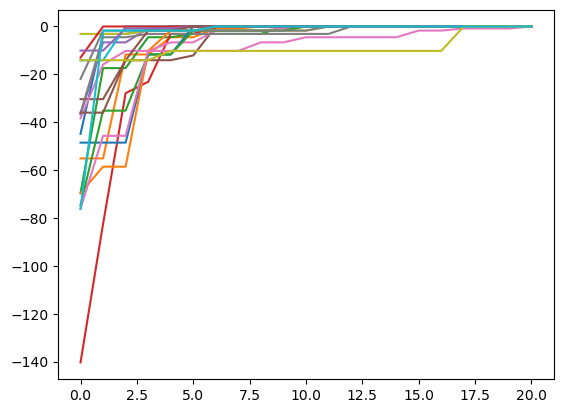

In [79]:
plt.figure()
plt.plot(bestArrS.T);

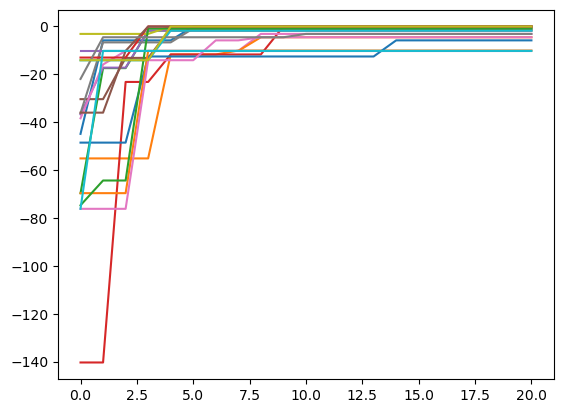

In [42]:
plt.figure()
plt.plot(bestArrS.T);

## test functions

### classical BO

In [68]:
textLog = open('20250311-textLog_3var_classical.txt','w')
    
bestArr = []
objArr = []
xArr = []
timeArr = []
totimeArr = [] #total time array

for sd in range(5):
    seed = sd
       
    start = datetime.now()
    textLog.write(start.strftime('%Y-%m-%d %H:%M:%S'))
    
    np.random.seed(seed)
    torch.manual_seed(seed)
    random.seed(seed)
    
    n_initial_points = 4
    n_BO_points = 30
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        # Generate initial data: several datapoints at random
        # Each one of them will be uniform between 0 and 3
        x,y,obj = generate_initial_dataClassic(n_initial_points,y_raw)
        #g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
        best = [obj.max().detach().item()] # This will store the best value
        best_x_idx = obj.argmax()
        #print('initial points: ',x)
        # print('Best value (thickness,tilt,obj) found: {} , {}, {}\n'.format(x[best_x_idx,0].item(),
        #                                                       x[best_x_idx,1].item(),obj[best_x_idx]))
        
        timeIt = []
        
        for i in range(n_BO_points): 
            torch.cuda.synchronize()
            midPoint1 = datetime.now()
        
            # Fit the model
            noise = torch.ones_like(obj) * 0.0001
            model =  SingleTaskGP(x, obj,outcome_transform=Standardize(m=1),
                                 input_transform=Normalize(d=3)) # GP is on the objective
            # model = SingleTaskGP(x, y) # GP is on y, not the objective
            fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))

            #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
            #... for the batch. Whatever dimension in front then the dimension that i specify.
            #From 100 initial points, chooses 50 initial best points for the gradient descent
            best_obj = obj.argmax() # same as -obj.min()
            EI = ExpectedImprovement(model=model, best_f=obj.max())
            new_point, new_point_EI = optimize_acqf(
                acq_function=EI,
                bounds=torch.tensor([[lower,-10,-10], [upper,10,10]]).to(**tkwargs),
                q=1,
                num_restarts=50,
                raw_samples=100,
            )
                
        
            torch.cuda.synchronize()
            midPoint2 = datetime.now()
            timeIt.append(midPoint2-midPoint1)
            
            x,y,obj = add_data(new_point,y_raw,x,y,obj)
            best.append(obj.max().item())
            best_x_idx = obj.argmax()
            
            # print('It {}: Best obj {} from iteration # {} at x of {}, {}, and {}\n'.format(i,
            #                                                                    obj.max(),
            #                                                                    best_x_idx,
            #                                                                    x[best_x_idx][0].item(),
            #                                                                          x[best_x_idx][1].item(),
            #                                                                               x[best_x_idx][2].item()))
    torch.cuda.synchronize()
    end = datetime.now()
    textLog.write('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
    
    totimeArr.append(end-start)
    bestArr.append(best)
    xArr.append(x.cpu().squeeze().numpy())
    timeArr.append(timeIt)
    objArr.append(obj.cpu().squeeze().numpy())
    
bestArrS = np.array(bestArr)
objArrS = np.array(objArr)
xArrS = np.array(xArr)
timeArrS = np.array(timeArr)
totimeArrS = np.array(totimeArr)

np.savez('20250311-composite_initial4_3var_results_5seeds_time_classical.npz',
         xArr=xArrS,objArr=objArrS,bestArr = bestArrS, timeArr = timeArrS, totimeArr = totimeArrS)
torch.save(model.state_dict(),'20250311-model_3var_classical.pth')

textLog.close()

In [70]:
def classicalBO(sd):
    seed = sd
       
    start = datetime.now()
    print(start.strftime('%Y-%m-%d %H:%M:%S'))
    
    np.random.seed(seed)
    torch.manual_seed(seed)
    random.seed(seed)
    
    n_initial_points = 4
    n_BO_points = 30
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        # Generate initial data: several datapoints at random
        # Each one of them will be uniform between 0 and 3
        x,y,obj = generate_initial_data(n_initial_points)
        #g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
        best = [obj.max().detach().item()] # This will store the best value
        best_x_idx = obj.argmax()
        #print('initial points: ',x)
        # print('Best value (thickness,tilt,obj) found: {} , {}, {}\n'.format(x[best_x_idx,0].item(),
        #                                                       x[best_x_idx,1].item(),obj[best_x_idx]))
        
        timeIt = []
        
        for i in range(n_BO_points): 
            torch.cuda.synchronize()
            midPoint1 = datetime.now()
        
            # Fit the model
            noise = torch.ones_like(obj) * 0.0001
            model =  SingleTaskGP(x, obj,outcome_transform=Standardize(m=1),
                                 input_transform=Normalize(d=3)) # GP is on the objective
            # model = SingleTaskGP(x, y) # GP is on y, not the objective
            fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))

            #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
            #... for the batch. Whatever dimension in front then the dimension that i specify.
            #From 100 initial points, chooses 50 initial best points for the gradient descent
            best_obj = obj.argmax() # same as -obj.min()
            EI = ExpectedImprovement(model=model, best_f=obj.max())
            new_point, new_point_EI = optimize_acqf(
                acq_function=EI,
                bounds=torch.tensor([[lower,-10,-10], [upper,10,10]]).to(**tkwargs),
                q=1,
                num_restarts=50,
                raw_samples=100,
            )
                
        
            torch.cuda.synchronize()
            midPoint2 = datetime.now()
            timeIt.append(midPoint2-midPoint1)
            
            x,y,obj = add_data(new_point,x,y,obj)
            best.append(obj.max().item())
            best_x_idx = obj.argmax()
            
            print('It {}: Best obj {} from iteration # {} at x of {}, {}, and {}\n'.format(i,
                                                                               obj.max(),
                                                                               best_x_idx,
                                                                               x[best_x_idx][0].item(),
                                                                                     x[best_x_idx][1].item(),
                                                                                          x[best_x_idx][2].item()))
    torch.cuda.synchronize()
    end = datetime.now()
    print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))

    return x,y,obj,best

In [82]:
classicalBO(19)

2025-02-21 12:47:19
initial points:  tensor([[375.3580,   9.6928],
        [143.1754,   3.1461],
        [119.7544,   7.4045],
        [381.6056,   5.3729]], dtype=torch.float64)
Best value (thickness,tilt,obj) found: 143.175356592983 , 3.1461121775209904, tensor([-106.2495], dtype=torch.float64)

It 0: Best obj -106.24945831298828 from iteration # 1 at x of 143.175356592983 and 3.1461121775209904

It 1: Best obj -105.59774017333984 from iteration # 5 at x of 197.41768749674026 and 4.677791298587022

It 2: Best obj -47.230472564697266 from iteration # 6 at x of 240.26636740603143 and 2.198869223497591

It 3: Best obj -1.6265268325805664 from iteration # 7 at x of 308.96908876522315 and 0.0

It 4: Best obj -1.6265268325805664 from iteration # 7 at x of 308.96908876522315 and 0.0

It 5: Best obj -1.6265268325805664 from iteration # 7 at x of 308.96908876522315 and 0.0

It 6: Best obj -1.6265268325805664 from iteration # 7 at x of 308.96908876522315 and 0.0

It 7: Best obj -0.0 from itera

(tensor([[3.7536e+02, 9.6928e+00],
         [1.4318e+02, 3.1461e+00],
         [1.1975e+02, 7.4045e+00],
         [3.8161e+02, 5.3729e+00],
         [9.2424e+01, 4.8420e+00],
         [1.9742e+02, 4.6778e+00],
         [2.4027e+02, 2.1989e+00],
         [3.0897e+02, 0.0000e+00],
         [4.2591e+02, 0.0000e+00],
         [2.3746e+02, 0.0000e+00],
         [2.9997e+02, 0.0000e+00],
         [3.2186e+02, 7.9985e-01],
         [1.0000e+01, 0.0000e+00],
         [3.0930e+02, 5.5972e-01],
         [3.3439e+02, 3.0577e-01],
         [1.0000e+01, 1.0000e+01],
         [3.2380e+02, 4.3932e-01],
         [3.2358e+02, 4.4308e-01],
         [3.2348e+02, 4.4652e-01],
         [3.2345e+02, 4.5020e-01],
         [3.2347e+02, 4.5451e-01],
         [3.3253e+02, 7.1540e-01],
         [3.2290e+02, 4.3560e-01],
         [3.2297e+02, 4.4112e-01]], dtype=torch.float64),
 tensor([[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,


In [72]:
classicalBO(19)

2025-02-21 12:43:27
initial points:  tensor([[375.3580,   9.6928],
        [143.1754,   3.1461],
        [119.7544,   7.4045],
        [381.6056,   5.3729]], dtype=torch.float64)
Best value (thickness,tilt,obj) found: 143.175356592983 , 3.1461121775209904, tensor([-76.1879], dtype=torch.float64)

It 0: Best obj -1.7201156616210938 from iteration # 4 at x of 241.20581994582034 and 4.13072909215752

It 1: Best obj -1.7201156616210938 from iteration # 4 at x of 241.20581994582034 and 4.13072909215752

It 2: Best obj -1.7201156616210938 from iteration # 4 at x of 241.20581994582034 and 4.13072909215752

It 3: Best obj -1.7201156616210938 from iteration # 4 at x of 241.20581994582034 and 4.13072909215752

It 4: Best obj -1.7201156616210938 from iteration # 4 at x of 241.20581994582034 and 4.13072909215752

It 5: Best obj -1.7201156616210938 from iteration # 4 at x of 241.20581994582034 and 4.13072909215752

It 6: Best obj -0.0 from iteration # 10 at x of 256.52895765238037 and 4.31629172491

(tensor([[375.3580,   9.6928],
         [143.1754,   3.1461],
         [119.7544,   7.4045],
         [381.6056,   5.3729],
         [241.2058,   4.1307],
         [293.9924,   2.8799],
         [213.2675,   5.2146],
         [277.1160,   4.5869],
         [500.0000,   0.0000],
         [ 10.0000,   0.0000],
         [256.5290,   4.3163],
         [ 10.0000,   5.4941],
         [223.6817,   0.0000],
         [254.8562,   4.7244],
         [254.2593,   4.5094],
         [254.7272,   4.5077],
         [217.8763,   2.6496],
         [253.1569,   4.4809],
         [253.4865,   4.4800],
         [253.6687,   4.4801],
         [253.7603,   4.4803],
         [253.8734,   4.4807],
         [119.7911,  10.0000],
         [253.7377,   4.4853]], dtype=torch.float64),
 tensor([[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 

In [71]:
classicalBO(11)

2025-02-21 12:41:16
initial points:  tensor([[366.3319,   2.0346],
        [ 68.1678,   9.7749],
        [155.3589,   3.3345],
        [468.8423,   6.8560]], dtype=torch.float64)
Best value (thickness,tilt,obj) found: 155.35889606922865 , 3.3345101699233055, tensor([-69.6400], dtype=torch.float64)

It 0: Best obj -64.35462188720703 from iteration # 4 at x of 230.0490814765637 and 1.7326953845736797

It 1: Best obj -64.35462188720703 from iteration # 4 at x of 230.0490814765637 and 1.7326953845736797

It 2: Best obj -10.204662322998047 from iteration # 6 at x of 253.46691703829936 and 3.20565654379445

It 3: Best obj -1.7201156616210938 from iteration # 7 at x of 247.44384811577004 and 4.334736448799164

It 4: Best obj -1.7201156616210938 from iteration # 7 at x of 247.44384811577004 and 4.334736448799164

It 5: Best obj -0.0 from iteration # 9 at x of 255.794596359601 and 4.049281378879074

It 6: Best obj -0.0 from iteration # 9 at x of 255.794596359601 and 4.049281378879074

It 7: Bes

(tensor([[366.3319,   2.0346],
         [ 68.1678,   9.7749],
         [155.3589,   3.3345],
         [468.8423,   6.8560],
         [230.0491,   1.7327],
         [ 68.6675,   1.6629],
         [253.4669,   3.2057],
         [247.4438,   4.3347],
         [285.3174,   4.1653],
         [255.7946,   4.0493],
         [259.0527,   4.0211],
         [237.6641,   6.7970],
         [260.7515,   4.1734],
         [500.0000,   0.0000],
         [258.4560,   4.0734],
         [258.4567,   4.0692],
         [258.5701,   4.0633],
         [258.6219,   4.0574],
         [258.5312,   4.0477],
         [260.5642,   4.0274],
         [251.7586,   4.0626],
         [252.5198,   4.0611],
         [252.8848,   4.0575],
         [253.3259,   4.0546]], dtype=torch.float64),
 tensor([[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 

### change functions

In [68]:
def changedModel2(sd):
    seed = sd
       
    start = datetime.now()
    print(start.strftime('%Y-%m-%d %H:%M:%S'))
    
    np.random.seed(seed)
    torch.manual_seed(seed)
    random.seed(seed)
    
    n_initial_points = 4
    n_BO_points = 20
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        # Generate initial data: several datapoints at random
        # Each one of them will be uniform between 0 and 3
        x,y,obj = generate_initial_data(n_initial_points)
        #g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
        best = [obj.max().detach().item()] # This will store the best value
        best_x_idx = obj.argmax()
        print('initial points: ',x)
        print('Best value (thickness,tilt,obj) found: {} , {}, {}\n'.format(x[best_x_idx,0].item(),
                                                              x[best_x_idx,1].item(),obj[best_x_idx]))
        
        timeIt = []
        
        for i in range(n_BO_points): 
            torch.cuda.synchronize()
            midPoint1 = datetime.now()
        
            # Fit the model
            noise = torch.ones_like(obj) * 0.0001
            model =  SingleTaskGP(x, obj,outcome_transform=Standardize(m=1),
                                 input_transform=Normalize(d=2)) # GP is on the objective
            # model = SingleTaskGP(x, y) # GP is on y, not the objective
            fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))

            #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
            #... for the batch. Whatever dimension in front then the dimension that i specify.
            #From 100 initial points, chooses 50 initial best points for the gradient descent
            best_obj = obj.max() # same as -obj.min() #note: error. should be max, not argmax
            sampler = SobolQMCNormalSampler(1024)
            EI = qExpectedImprovement(model=model, best_f=best_obj, sampler=sampler)
            new_point, new_point_EI = optimize_acqf(
                acq_function=EI,
                bounds=torch.tensor([[lower,0], [upper,10]]).to(**tkwargs),
                q=1,
                num_restarts=50,
                raw_samples=100,
            )
                
            x,y,obj = add_data(new_point,x,y,obj)
        
            torch.cuda.synchronize()
            midPoint2 = datetime.now()
            timeIt.append(midPoint2-midPoint1)
            
            best.append(obj.max().item())
            best_x_idx = obj.argmax()
            
            print('It {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(i,
                                                                               obj.max(),
                                                                               best_x_idx,
                                                                               x[best_x_idx][0].item(),
                                                                                     x[best_x_idx][1].item()))
    torch.cuda.synchronize()
    end = datetime.now()
    print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))

    return x,y,obj,best

In [62]:
def changedModel(sd):
    seed = sd
       
    start = datetime.now()
    print(start.strftime('%Y-%m-%d %H:%M:%S'))
    
    np.random.seed(seed)
    torch.manual_seed(seed)
    random.seed(seed)
    
    n_initial_points = 4
    n_BO_points = 20
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        # Generate initial data: several datapoints at random
        # Each one of them will be uniform between 0 and 3
        x,y,obj = generate_initial_data(n_initial_points)
        #g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
        best = [obj.max().detach().item()] # This will store the best value
        best_x_idx = obj.argmax()
        print('initial points: ',x)
        print('Best value (thickness,tilt,obj) found: {} , {}, {}\n'.format(x[best_x_idx,0].item(),
                                                              x[best_x_idx,1].item(),obj[best_x_idx]))
        
        timeIt = []
        
        for i in range(n_BO_points): 
            torch.cuda.synchronize()
            midPoint1 = datetime.now()
        
            # Fit the model
            noise = torch.ones_like(obj) * 0.0001
            model =  SingleTaskGP(x, obj,outcome_transform=Standardize(m=1),
                                 input_transform=Normalize(d=2)) # GP is on the objective
            # model = SingleTaskGP(x, y) # GP is on y, not the objective
            fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))

            #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
            #... for the batch. Whatever dimension in front then the dimension that i specify.
            #From 100 initial points, chooses 50 initial best points for the gradient descent
            best_obj = obj.argmax() # same as -obj.min() #note: error. should be max, not argmax
            sampler = SobolQMCNormalSampler(1024)
            EI = qExpectedImprovement(model=model, best_f=best_obj, sampler=sampler)
            new_point, new_point_EI = optimize_acqf(
                acq_function=EI,
                bounds=torch.tensor([[lower,0], [upper,10]]).to(**tkwargs),
                q=1,
                num_restarts=50,
                raw_samples=100,
            )
                
            x,y,obj = add_data(new_point,x,y,obj)
        
            torch.cuda.synchronize()
            midPoint2 = datetime.now()
            timeIt.append(midPoint2-midPoint1)
            
            best.append(obj.max().item())
            best_x_idx = obj.argmax()
            
            print('It {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(i,
                                                                               obj.max(),
                                                                               best_x_idx,
                                                                               x[best_x_idx][0].item(),
                                                                                     x[best_x_idx][1].item()))
    torch.cuda.synchronize()
    end = datetime.now()
    print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))

    return x,y,obj,best

In [69]:
x11m,y11m,obj11m,best11m = changedModel2(11)

2025-02-21 12:33:12
initial points:  tensor([[366.3319,   2.0346],
        [ 68.1678,   9.7749],
        [155.3589,   3.3345],
        [468.8423,   6.8560]], dtype=torch.float64)
Best value (thickness,tilt,obj) found: 155.35889606922865 , 3.3345101699233055, tensor([-69.6400], dtype=torch.float64)

It 0: Best obj -64.35462188720703 from iteration # 4 at x of 230.07521803923748 and 1.7338108910380798

It 1: Best obj -64.35462188720703 from iteration # 4 at x of 230.07521803923748 and 1.7338108910380798

It 2: Best obj -10.204662322998047 from iteration # 6 at x of 253.4814273962011 and 3.2067086032298624

It 3: Best obj -1.7201156616210938 from iteration # 7 at x of 247.57753800765636 and 4.332959567591969

It 4: Best obj -1.7201156616210938 from iteration # 7 at x of 247.57753800765636 and 4.332959567591969

It 5: Best obj -0.0 from iteration # 9 at x of 256.00629066768334 and 4.0492953311821855

It 6: Best obj -0.0 from iteration # 9 at x of 256.00629066768334 and 4.0492953311821855



In [64]:
x11,y11,obj11,best11 = changedModel(11)

2025-02-21 12:26:38
initial points:  tensor([[366.3319,   2.0346],
        [ 68.1678,   9.7749],
        [155.3589,   3.3345],
        [468.8423,   6.8560]], dtype=torch.float64)
Best value (thickness,tilt,obj) found: 155.35889606922865 , 3.3345101699233055, tensor([-69.6400], dtype=torch.float64)

It 0: Best obj -69.63997650146484 from iteration # 2 at x of 155.35889606922865 and 3.3345101699233055

It 1: Best obj -69.63997650146484 from iteration # 2 at x of 155.35889606922865 and 3.3345101699233055

It 2: Best obj -10.204662322998047 from iteration # 6 at x of 256.40434554915896 and 3.7272027098126768

It 3: Best obj -10.204662322998047 from iteration # 6 at x of 256.40434554915896 and 3.7272027098126768

It 4: Best obj -10.204662322998047 from iteration # 6 at x of 256.40434554915896 and 3.7272027098126768

It 5: Best obj -10.204662322998047 from iteration # 6 at x of 256.40434554915896 and 3.7272027098126768

It 6: Best obj -1.7201156616210938 from iteration # 10 at x of 240.56918

In [67]:
best11

[-69.63997650146484,
 -69.63997650146484,
 -69.63997650146484,
 -10.204662322998047,
 -10.204662322998047,
 -10.204662322998047,
 -10.204662322998047,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -1.7201156616210938,
 -0.0]

### just the seed

In [52]:
def changeSeed(sd):
    seed = sd
       
    start = datetime.now()
    print(start.strftime('%Y-%m-%d %H:%M:%S'))
    
    np.random.seed(seed)
    torch.manual_seed(seed)
    random.seed(seed)
    
    n_initial_points = 4
    n_BO_points = 20
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        # Generate initial data: several datapoints at random
        # Each one of them will be uniform between 0 and 3
        x,y,obj = generate_initial_data(n_initial_points)
        #g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
        best = [obj.max().detach().item()] # This will store the best value
        best_x_idx = obj.argmax()
        print('initial points: ',x)
        print('Best value (thickness,tilt,obj) found: {} , {}, {}\n'.format(x[best_x_idx,0].item(),
                                                              x[best_x_idx,1].item(),obj[best_x_idx]))
        
        timeIt = []
        
        for i in range(n_BO_points): 
            torch.cuda.synchronize()
            midPoint1 = datetime.now()
        
            # Fit the model
            noise = torch.ones_like(obj) * 0.0001
            model = FixedNoiseGP(x, obj, noise,outcome_transform=Standardize(m=1),
                                 input_transform=Normalize(d=2)) # GP is on the objective
            # model = SingleTaskGP(x, y) # GP is on y, not the objective
            fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))
            #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
            #... for the batch. Whatever dimension in front then the dimension that i specify.
            #From 100 initial points, chooses 50 initial best points for the gradient descent
            best_obj = obj.argmax() # same as -obj.min()
            sampler = SobolQMCNormalSampler(1024)
            EI = qExpectedImprovement(model=model, best_f=best_obj, sampler=sampler)
            new_point, new_point_EI = optimize_acqf(
                acq_function=EI,
                bounds=torch.tensor([[lower,0], [upper,10]]).to(**tkwargs),
                q=1,
                num_restarts=50,
                raw_samples=100,
            )
                
            x,y,obj = add_data(new_point,x,y,obj)
        
            torch.cuda.synchronize()
            midPoint2 = datetime.now()
            timeIt.append(midPoint2-midPoint1)
            
            best.append(obj.max().item())
            best_x_idx = obj.argmax()
            
            print('It {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(i,
                                                                               obj.max(),
                                                                               best_x_idx,
                                                                               x[best_x_idx][0].item(),
                                                                                     x[best_x_idx][1].item()))
    torch.cuda.synchronize()
    end = datetime.now()
    print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))

    return x,y,obj,best

In [47]:
x_real

array([[250,   4]])

In [54]:
x11,y11,obj11,best11 = changeSeed(11)

2025-02-21 12:07:30
initial points:  tensor([[366.3319,   2.0346],
        [ 68.1678,   9.7749],
        [155.3589,   3.3345],
        [468.8423,   6.8560]], dtype=torch.float64)
Best value (thickness,tilt,obj) found: 155.35889606922865 , 3.3345101699233055, tensor([-69.6400], dtype=torch.float64)

It 0: Best obj -69.63997650146484 from iteration # 2 at x of 155.35889606922865 and 3.3345101699233055

It 1: Best obj -69.63997650146484 from iteration # 2 at x of 155.35889606922865 and 3.3345101699233055

It 2: Best obj -10.204662322998047 from iteration # 6 at x of 253.17367973677307 and 3.843956233777619

It 3: Best obj -10.204662322998047 from iteration # 6 at x of 253.17367973677307 and 3.843956233777619

It 4: Best obj -10.204662322998047 from iteration # 6 at x of 253.17367973677307 and 3.843956233777619

It 5: Best obj -10.204662322998047 from iteration # 6 at x of 253.17367973677307 and 3.843956233777619

It 6: Best obj -10.204662322998047 from iteration # 6 at x of 253.1736797367

In [56]:
x1,y1,obj1,best1 = changeSeed(1)

2025-02-21 12:11:07
initial points:  tensor([[141.1855,   4.2558],
        [423.2856,   9.9263],
        [328.4645,   2.1475],
        [111.4728,   5.5658]], dtype=torch.float64)
Best value (thickness,tilt,obj) found: 328.46445386298 , 2.1474995091557503, tensor([-55.1258], dtype=torch.float64)

It 0: Best obj -55.12577438354492 from iteration # 2 at x of 328.46445386298 and 2.1474995091557503

It 1: Best obj -55.12577438354492 from iteration # 2 at x of 328.46445386298 and 2.1474995091557503

It 2: Best obj -55.12577438354492 from iteration # 2 at x of 328.46445386298 and 2.1474995091557503

It 3: Best obj -11.693331718444824 from iteration # 7 at x of 242.73858703755525 and 3.887268478588765

It 4: Best obj -11.693331718444824 from iteration # 7 at x of 242.73858703755525 and 3.887268478588765

It 5: Best obj -11.693331718444824 from iteration # 7 at x of 242.73858703755525 and 3.887268478588765

It 6: Best obj -10.05889892578125 from iteration # 10 at x of 290.0969673925635 and 4.92

In [55]:
best1

[-55.12577438354492,
 -55.12577438354492,
 -55.12577438354492,
 -55.12577438354492,
 -11.693331718444824,
 -11.693331718444824,
 -11.693331718444824,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125,
 -10.05889892578125]

# archive

Seed 0: Best obj -0.0 from iteration # 7 at x of 255.14910262151434 and 4.207741407084811



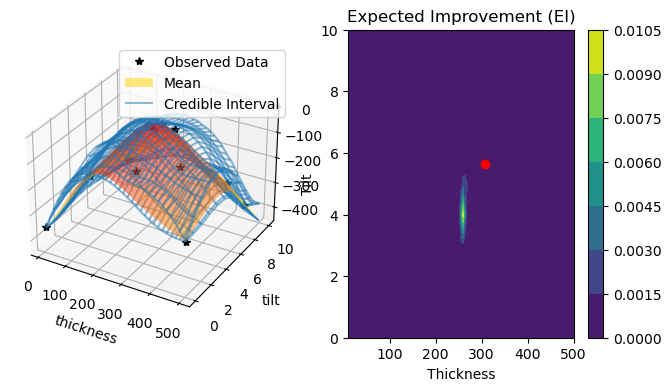

Time elapsed (hh:mm:ss.ms):  0:04:50.585163 

Seed 1: Best obj -0.0 from iteration # 6 at x of 255.55870001434974 and 4.841420417331015



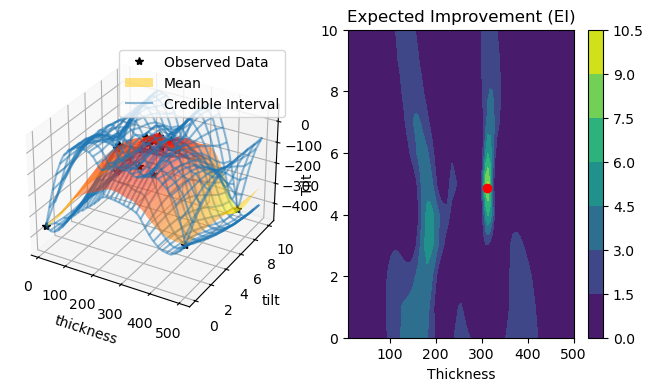

Time elapsed (hh:mm:ss.ms):  0:17:13.857432 

Seed 2: Best obj -0.0 from iteration # 12 at x of 256.22689759811544 and 4.374552743764307



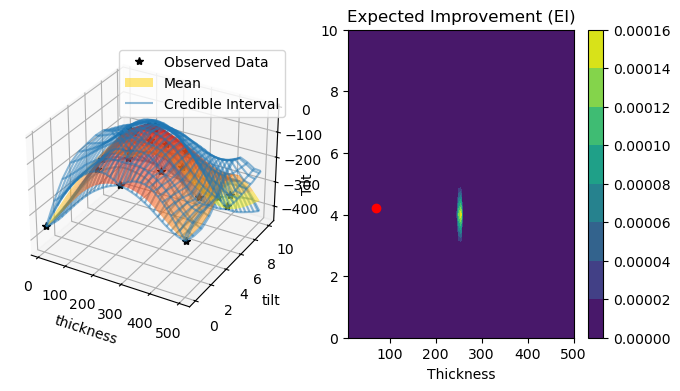

Time elapsed (hh:mm:ss.ms):  0:03:02.345166 

Seed 3: Best obj -0.0 from iteration # 11 at x of 258.8737061408167 and 4.298422575517063



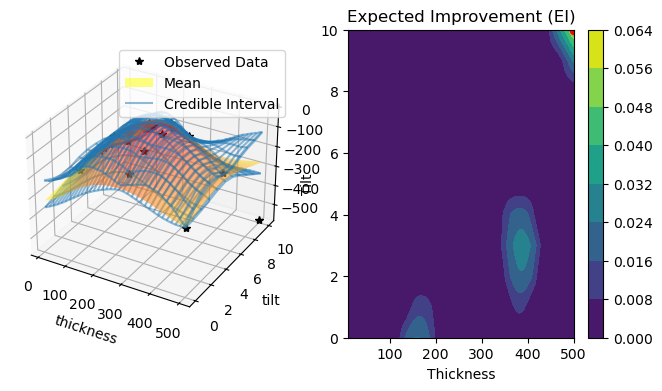

Time elapsed (hh:mm:ss.ms):  0:06:19.164832 

Seed 4: Best obj -0.0 from iteration # 7 at x of 255.9697501092673 and 4.643780150522004



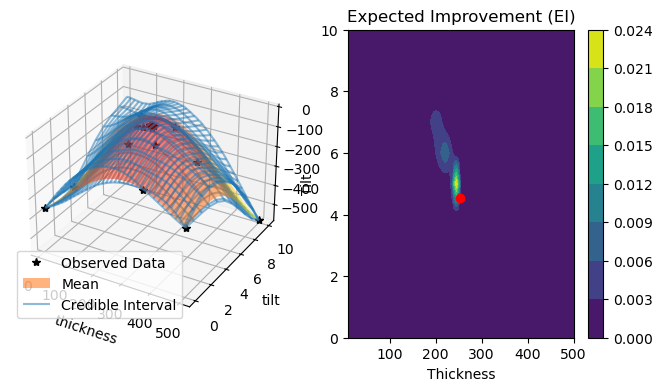

Time elapsed (hh:mm:ss.ms):  0:08:04.608945 

Seed 5: Best obj -0.0 from iteration # 9 at x of 254.70967854174222 and 4.394010489651405



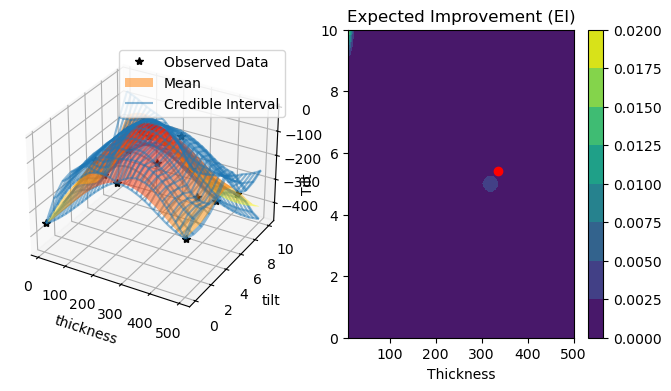

Time elapsed (hh:mm:ss.ms):  0:12:06.947895 

Seed 6: Best obj -0.0 from iteration # 12 at x of 257.74953059609453 and 4.36413557947122



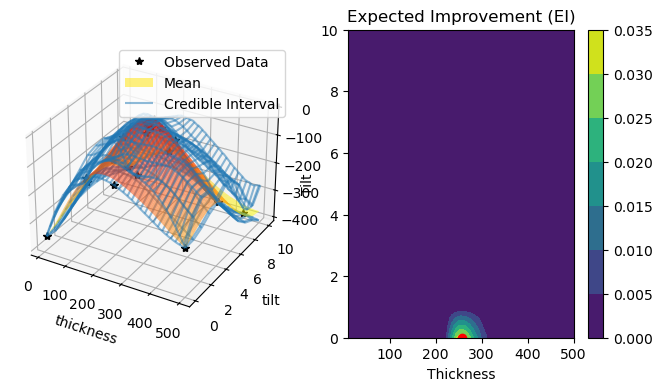

Time elapsed (hh:mm:ss.ms):  0:10:49.115107 

Seed 7: Best obj -0.0 from iteration # 20 at x of 251.211499389145 and 4.54175848681109



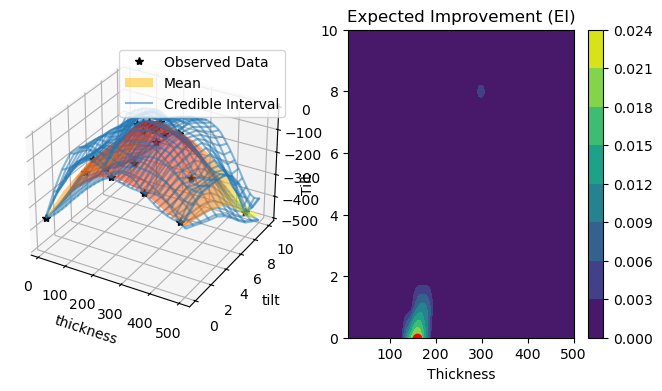

Time elapsed (hh:mm:ss.ms):  0:11:24.145860 

Seed 8: Best obj -0.0 from iteration # 8 at x of 256.47333680652116 and 4.490798742683674



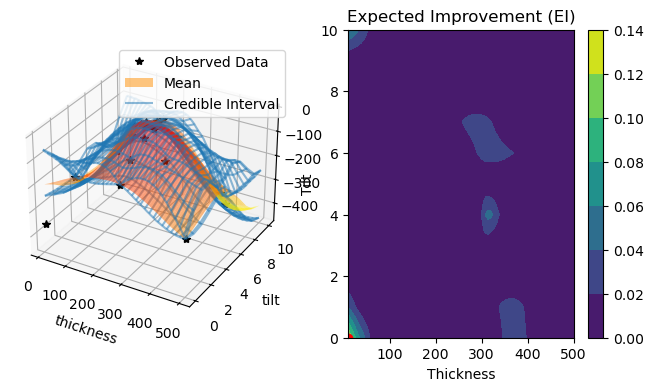

Time elapsed (hh:mm:ss.ms):  0:19:38.071887 

Seed 9: Best obj -0.0 from iteration # 5 at x of 258.3973854737941 and 4.173185197418934



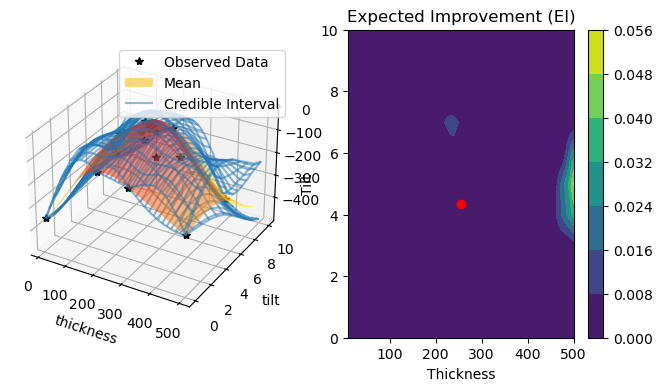

Time elapsed (hh:mm:ss.ms):  0:12:24.424513 

Seed 10: Best obj -0.0 from iteration # 12 at x of 259.0549420676066 and 4.720217542090633



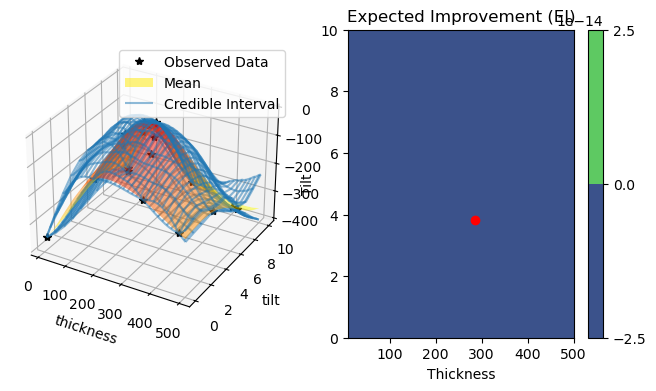

Time elapsed (hh:mm:ss.ms):  0:07:28.567625 

Seed 11: Best obj -0.0 from iteration # 11 at x of 254.09110541185743 and 4.467557857994712



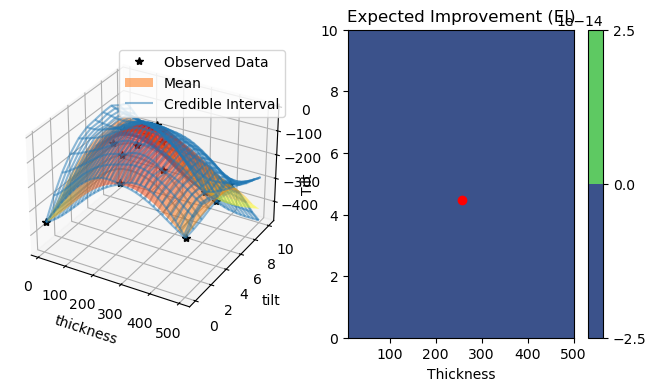

Time elapsed (hh:mm:ss.ms):  0:07:49.962456 

Seed 12: Best obj -0.0 from iteration # 6 at x of 258.9838898574997 and 4.341895995464626



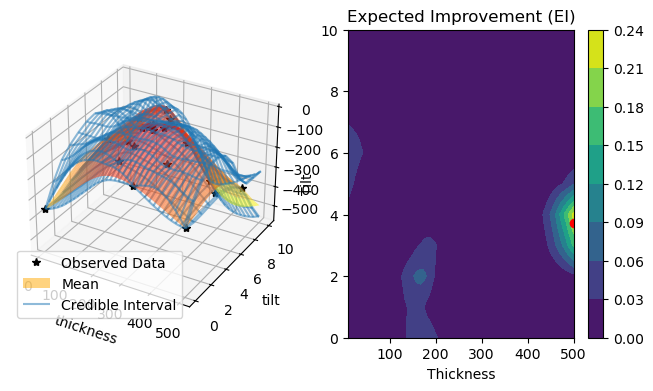

Time elapsed (hh:mm:ss.ms):  0:10:19.681955 

Seed 13: Best obj -0.0 from iteration # 8 at x of 257.9469239916324 and 4.275209074167385



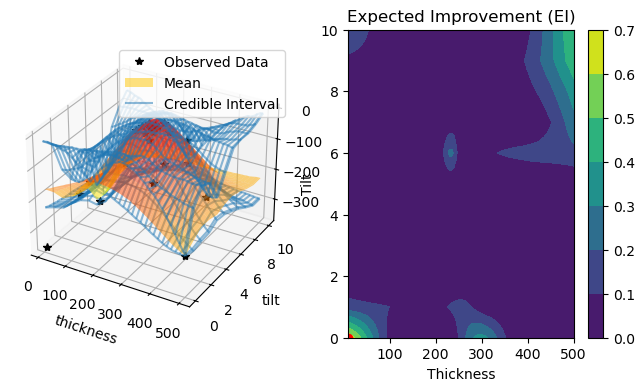

Time elapsed (hh:mm:ss.ms):  0:27:10.007288 

Seed 14: Best obj -0.0 from iteration # 8 at x of 258.04886590046146 and 4.340502824644158



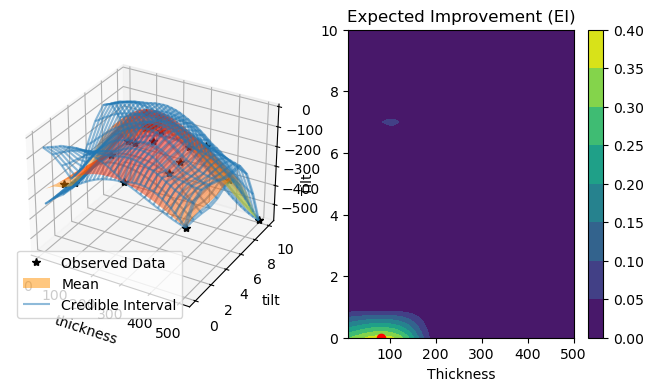

Time elapsed (hh:mm:ss.ms):  0:08:18.028610 

Seed 15: Best obj -0.0 from iteration # 7 at x of 254.83003137048195 and 4.456784330903432



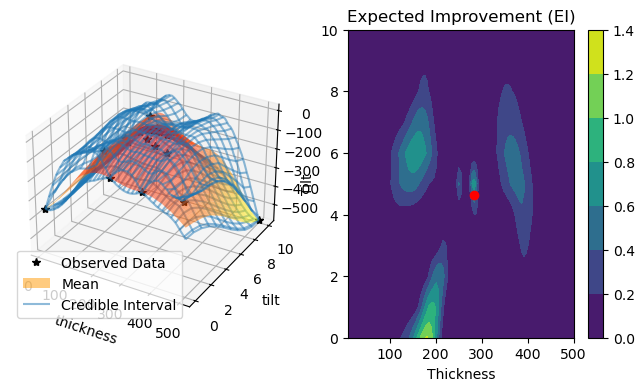

Time elapsed (hh:mm:ss.ms):  0:14:12.255087 

Seed 16: Best obj -0.8404735828492353 from iteration # 15 at x of 260.73277869712393 and 4.881787622874476



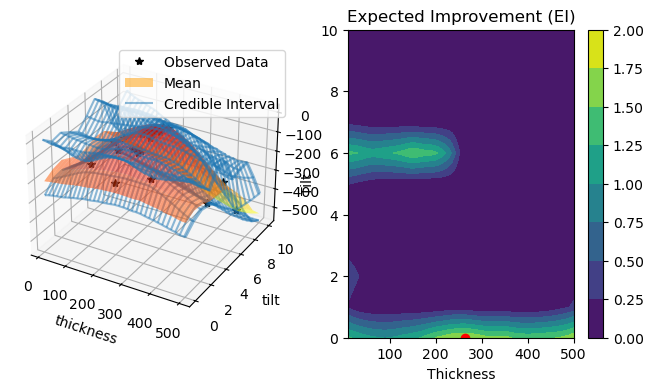

Time elapsed (hh:mm:ss.ms):  0:27:11.556506 

Seed 17: Best obj -0.0 from iteration # 12 at x of 256.01404021550906 and 4.5545327997651786



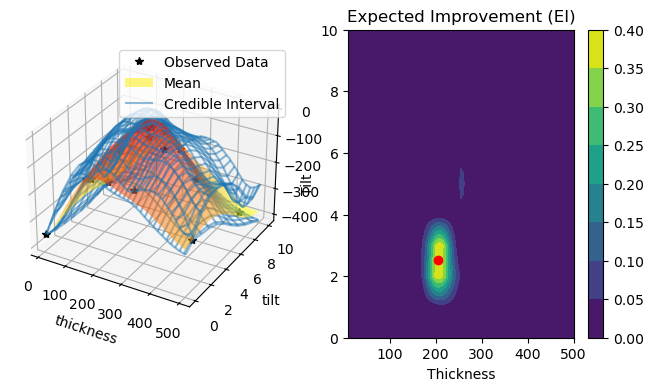

Time elapsed (hh:mm:ss.ms):  0:09:32.655035 

Seed 18: Best obj -0.0 from iteration # 7 at x of 258.39130201934836 and 4.070043490378175



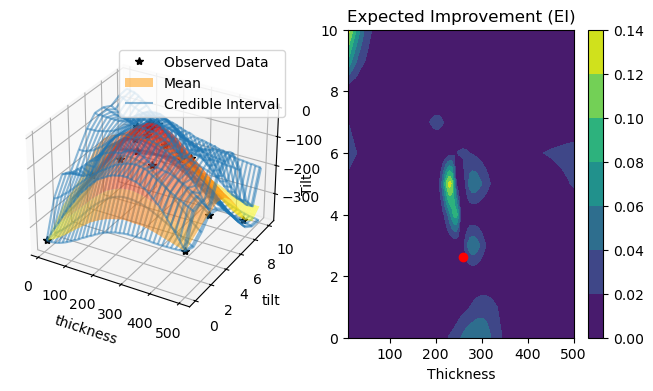

Time elapsed (hh:mm:ss.ms):  0:13:20.159181 

Seed 19: Best obj -0.0 from iteration # 12 at x of 257.50131566949375 and 4.313425090277252



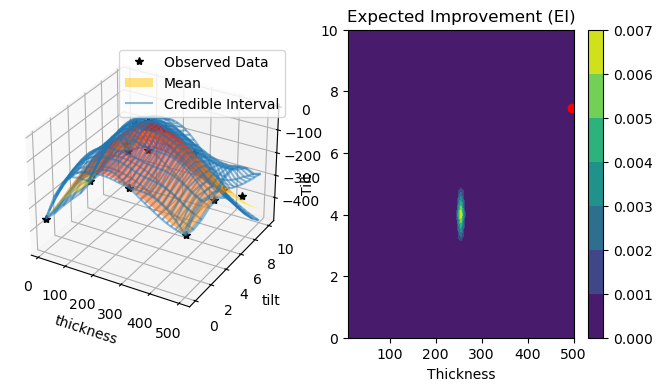

Time elapsed (hh:mm:ss.ms):  0:11:35.412267 

Seed 0: Best obj -0.0 from iteration # 12 at x of 251.6439185850962 and 4.800704503313747



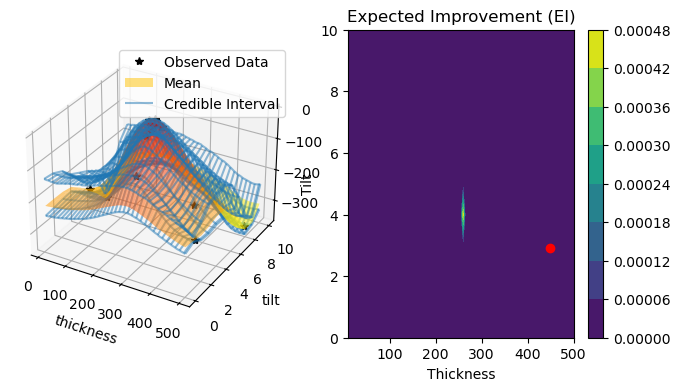

Time elapsed (hh:mm:ss.ms):  0:42:36.380754 

Seed 1: Best obj -0.0 from iteration # 8 at x of 254.39549123183846 and 4.021804134157875



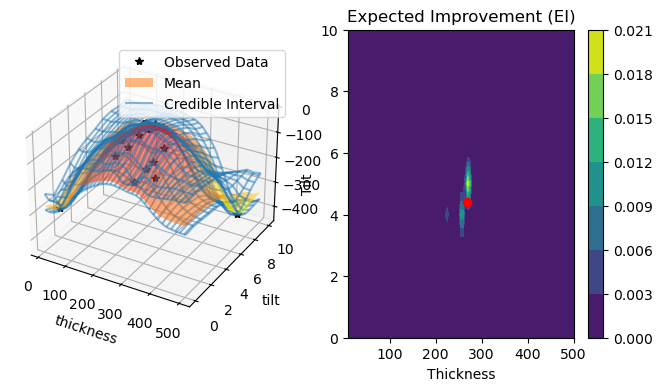

Time elapsed (hh:mm:ss.ms):  0:13:15.801103 

Seed 2: Best obj -0.0 from iteration # 9 at x of 252.99847044360845 and 4.147779136299677



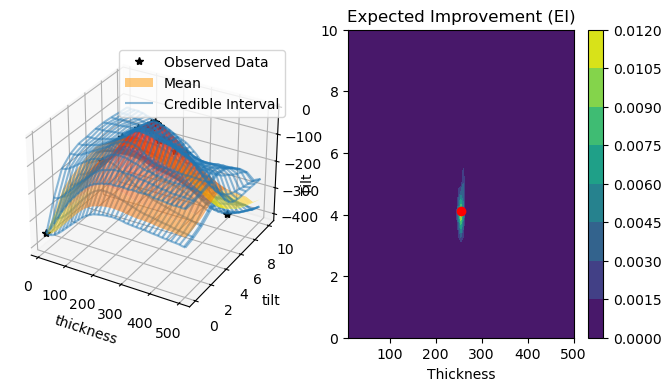

Time elapsed (hh:mm:ss.ms):  0:24:39.424541 

Seed 3: Best obj -0.0 from iteration # 14 at x of 258.09034180828377 and 4.601688588574117



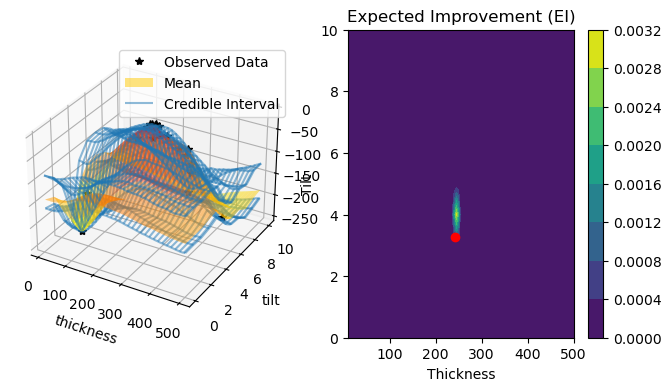

Time elapsed (hh:mm:ss.ms):  0:19:39.137035 

Seed 4: Best obj -0.0 from iteration # 8 at x of 257.8357990814567 and 4.195600291751406



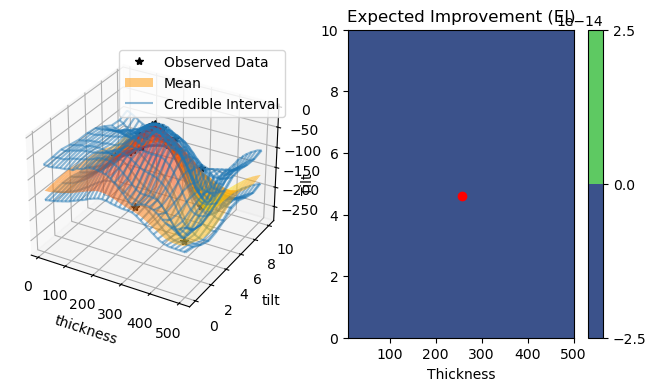

Time elapsed (hh:mm:ss.ms):  0:06:00.155509 

Seed 5: Best obj -0.0 from iteration # 6 at x of 251.06181662855136 and 4.099546728696665



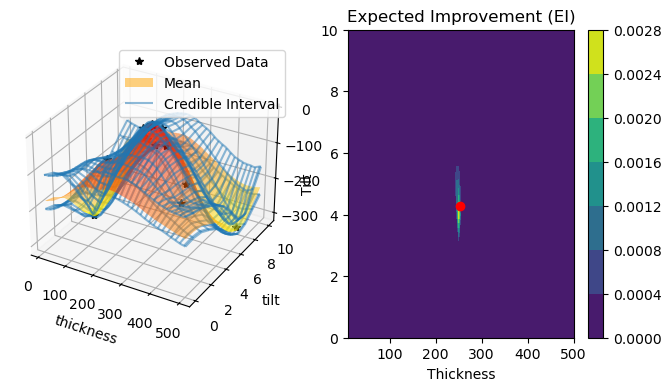

Time elapsed (hh:mm:ss.ms):  0:21:16.376091 

Seed 6: Best obj -0.0 from iteration # 8 at x of 257.31966562005744 and 4.89481724108688



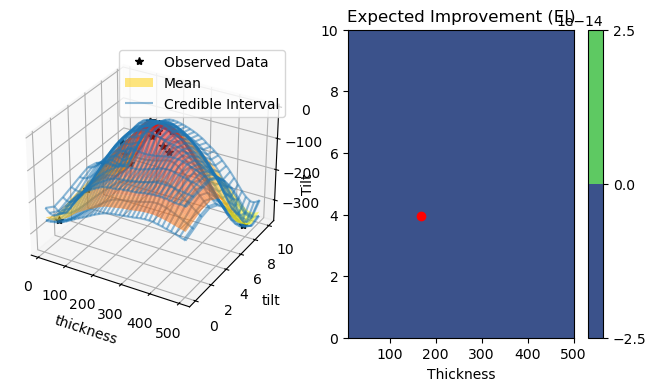

Time elapsed (hh:mm:ss.ms):  0:23:09.351024 

Seed 7: Best obj -0.0 from iteration # 8 at x of 252.2915432203003 and 4.43996451533039



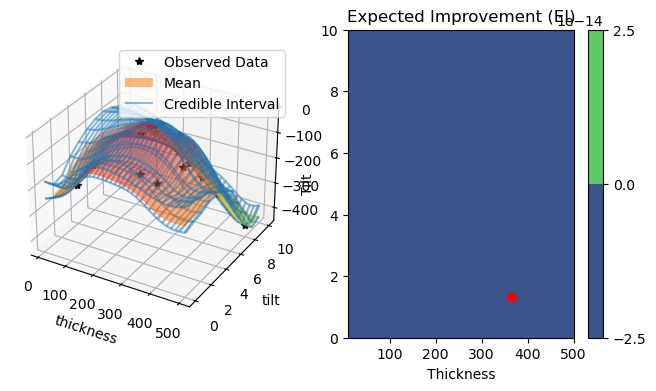

Time elapsed (hh:mm:ss.ms):  0:35:15.781487 

Seed 8: Best obj -0.0 from iteration # 4 at x of 255.02665451531016 and 4.989831195582885



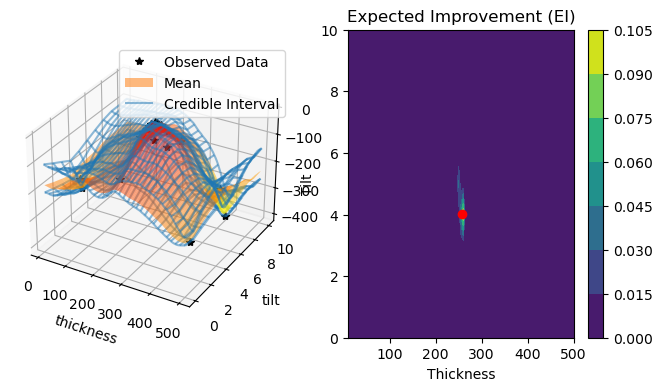

Time elapsed (hh:mm:ss.ms):  0:50:09.655503 

Seed 9: Best obj -0.0 from iteration # 6 at x of 257.4436270192344 and 4.1010641300138415



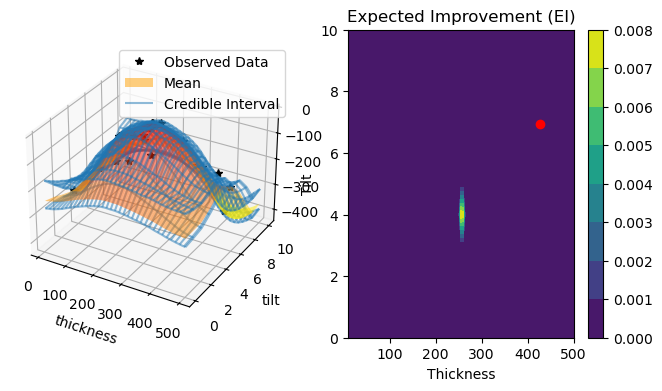

Time elapsed (hh:mm:ss.ms):  0:26:46.620471 

Seed 10: Best obj -0.0 from iteration # 12 at x of 252.2099023137229 and 4.653219295841545



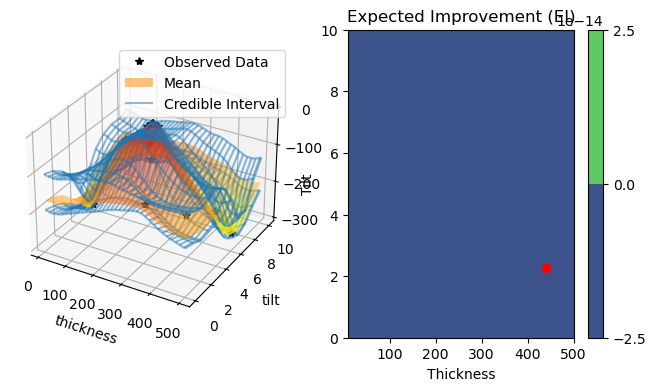

Time elapsed (hh:mm:ss.ms):  0:56:48.367686 

Seed 11: Best obj -0.0 from iteration # 16 at x of 254.02481359939887 and 4.737124352073675



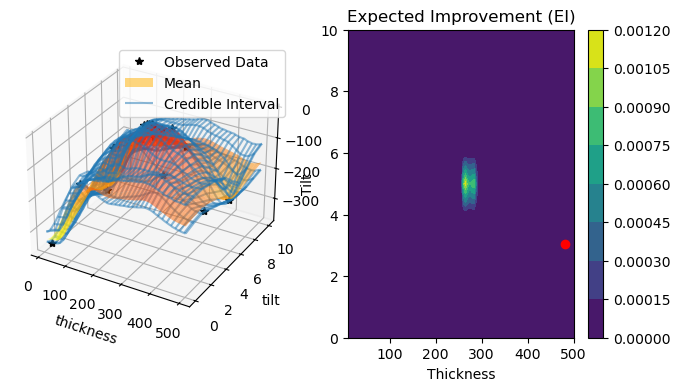

Time elapsed (hh:mm:ss.ms):  0:09:45.093257 

Seed 12: Best obj -0.0 from iteration # 10 at x of 258.78014802378334 and 4.793618651394208



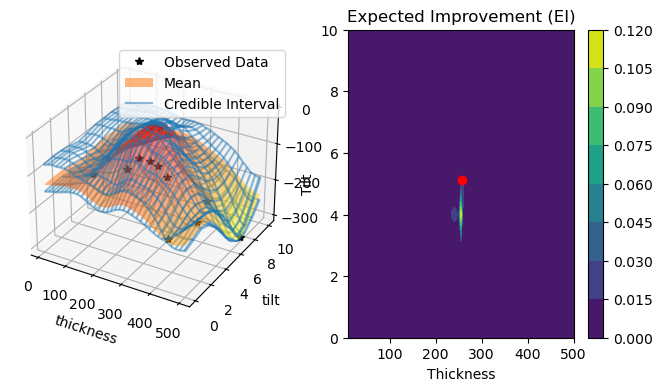

Time elapsed (hh:mm:ss.ms):  0:34:25.849798 

Seed 13: Best obj -0.8404736045603431 from iteration # 12 at x of 265.1660396613617 and 4.7894735251493135



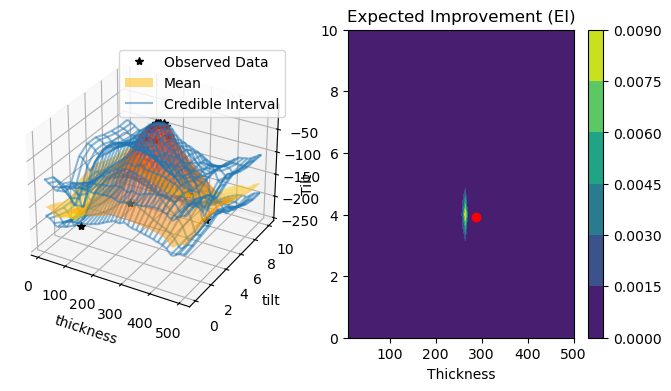

Time elapsed (hh:mm:ss.ms):  0:11:02.569202 

Seed 14: Best obj -0.0 from iteration # 8 at x of 253.36905071138952 and 4.23261105769004



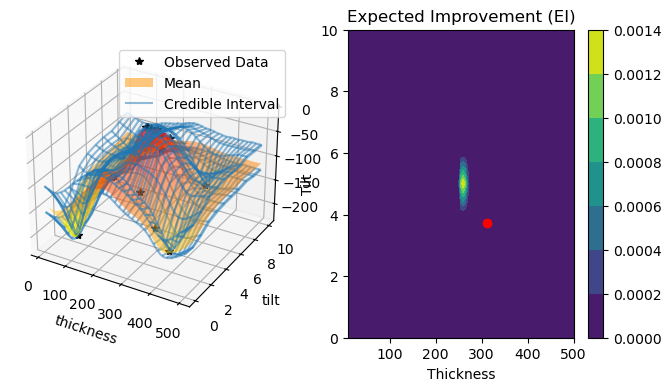

Time elapsed (hh:mm:ss.ms):  0:06:13.557807 

Seed 15: Best obj -0.0 from iteration # 7 at x of 255.86422558368432 and 4.064236550248026



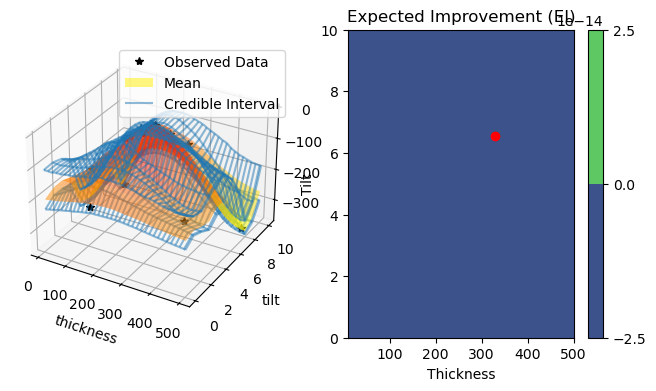

Time elapsed (hh:mm:ss.ms):  0:15:26.780239 

Seed 16: Best obj -0.0 from iteration # 18 at x of 256.98408549302644 and 4.928665323376771



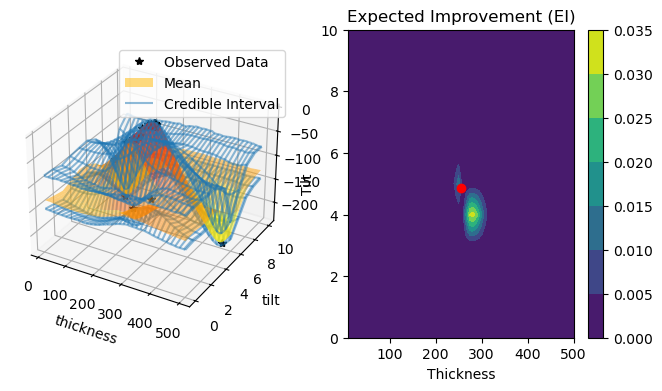

Time elapsed (hh:mm:ss.ms):  0:21:08.647385 

Seed 17: Best obj -0.8404736045603431 from iteration # 5 at x of 260.79762384098063 and 4.237963621346075



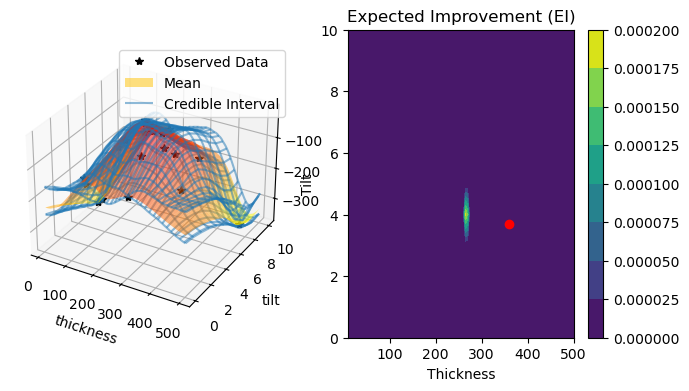

Time elapsed (hh:mm:ss.ms):  0:32:28.255595 

Seed 18: Best obj -0.0 from iteration # 11 at x of 258.4206152776354 and 4.6370875239126095



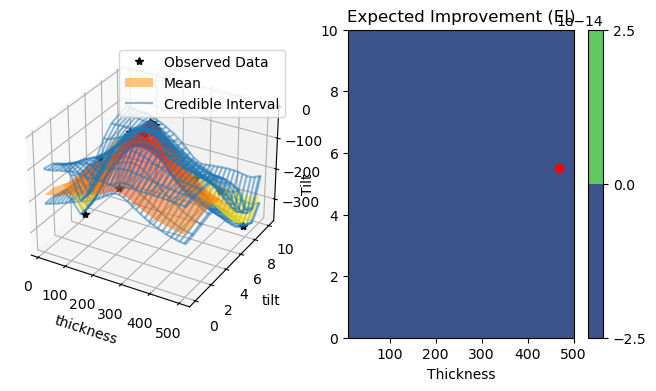

Time elapsed (hh:mm:ss.ms):  0:54:51.630260 

Seed 19: Best obj -0.0 from iteration # 9 at x of 255.77684619335028 and 4.323853132684093



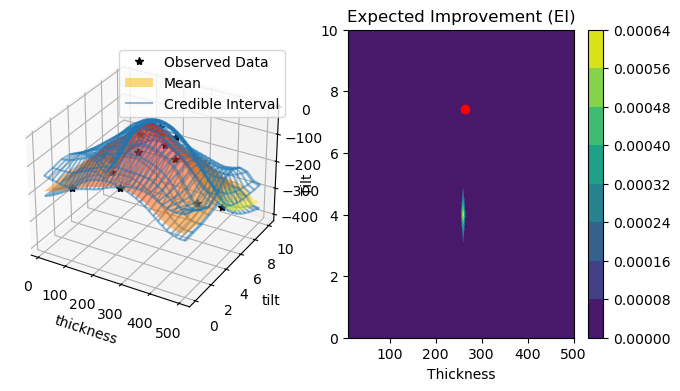

Time elapsed (hh:mm:ss.ms):  0:34:38.867876 



In [46]:
gridx1,gridx2 = torch.meshgrid(torch.linspace(lower,upper,101),torch.linspace(0,10,11))
for p in [6,15]:#[1,2,3,5,6,10,15]:
    textLog = open('20250221-textLog_patch{}.txt'.format(p),'w')
    numPatches= p
    numPix = y_raw.shape[0]//numPatches
    textLog.write('numPatches: {}, numPix: {}\n'.format(numPatches, numPix))

    y_patC = intoPatches(y_raw, numPatches, numPix) # compute reference values for patches
    y_obsC = computeY(y_raw, numPatches, numPix) # compute reference values
    #add_dataC(new_x,numPat,numPx, x=None, y=None, obj=None):
    #generate_initial_data(n_initial_points,numPat,numPx)

    bestArr = []
    objArr = []
    xArr = []
    timeArr = []
    totimeArr = [] #total time array
    textLog.write("\n\n======Patch: {}======\n".format(numPatches))
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        for seed in range(20):
            textLog.write('\n---------Seed: {}---------\n'.format(seed))
            start = datetime.now()
            textLog.write(start.strftime('%Y-%m-%d %H:%M:%S'))
        
            np.random.seed(seed)
            torch.manual_seed(seed)
            random.seed(seed)
    
            n_initial_points = 4
            n_BO_points = 20
    
            # Generate initial data: several datapoints at random
            # Each one of them will be uniform between 0 and 3
            x,y,obj = generate_initial_data(n_initial_points,
                                            numPatches, numPix)
            g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
            best = [obj.max().detach().item()] # This will store the best value
            best_x_idx = obj.argmax()
            textLog.write('Best value (thickness,tilt,obj) found: {} , {}, {}\n'.format(x[best_x_idx,0].item(),
                                                                  x[best_x_idx,1].item(),obj[best_x_idx]))
            textLog.write('Best value found: {}\n'.format(best[-1]))
    
            timeIt = []
    
            for i in range(n_BO_points): 
                torch.cuda.synchronize()
                midPoint1 = datetime.now()
    
                # Fit the model
                noise = torch.ones_like(y) * 0.0001
                model = FixedNoiseGP(x, y, noise,outcome_transform=Standardize(m=numPatches**2+1),input_transform=Normalize(d=2)) # GP is on y, not the objective
                # model = SingleTaskGP(x, y) # GP is on y, not the objective
                fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))
                #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
                #... for the batch. Whatever dimension in front then the dimension that i specify.
                #From 100 initial points, chooses 50 initial best points for the gradient descent
                best_obj = g(y).max() # same as -obj.min()
                sampler = SobolQMCNormalSampler(1024)
                EI = qExpectedImprovement(model=model, best_f=best_obj, objective=g,sampler=sampler)
                new_point, new_point_EI = optimize_acqf(
                    acq_function=EI,
                    bounds=torch.tensor([[lower,0], [upper,10]]).to(**tkwargs),
                    q=1,
                    num_restarts=50,
                    raw_samples=100,
                )
                textLog.write(f"new_point_EI val: {new_point_EI:.5}\n")
                    
                x,y,obj = add_dataC(new_point,numPatches,numPix,x,y,obj)
    
                torch.cuda.synchronize()
                midPoint2 = datetime.now()
                timeIt.append(midPoint2-midPoint1)
                
                best.append(obj.max().item())
                best_x_idx = obj.argmax()
                
            textLog.write('Seed {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(seed,
                                                                               obj.max(),
                                                                               best_x_idx,
                                                                               x[best_x_idx][0].item(),
                                                                                     x[best_x_idx][1].item()))
            print('Seed {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(seed,
                                                                               obj.max(),
                                                                               best_x_idx,
                                                                               x[best_x_idx][0].item(),
                                                                                     x[best_x_idx][1].item()))
    
            # Plot the posterior and the EI
            f, (ax1,ax2) = plt.subplots(1, 2, figsize=(8, 4))
            
            # Plot the posterior
            ax1.axis('off')
            ax1 = plt.subplot(121, projection='3d') #row, col, index
            plot_posterior_composite(ax1,model,gridx1,gridx2,x,y)
    
            # Plot EI
            plotEI(ax2,gridx1,gridx2,EI,new_point)
            plt.show()
            
            torch.cuda.synchronize()
            end = datetime.now()
            textLog.write(end.strftime('%Y-%m-%d %H:%M:%S'))
            textLog.write('\nTime elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
            print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
        
            totimeArr.append(end-start)
    
            bestArr.append(best)
            xArr.append(x.cpu().squeeze().numpy())
            timeArr.append(timeIt)
            objArr.append(obj.cpu().squeeze().numpy())

    bestArrS = np.array(bestArr)
    objArrS = np.array(objArr)
    xArrS = np.array(xArr)
    timeArrS = np.array(timeArr)
    totimeArrS = np.array(totimeArr)
    
    np.savez('20250204-composite_initial4_tilt_results_20seeds_time_numPatch{}.npz'.format(numPatches),
             xArr=xArrS,objArr=objArrS,bestArr = bestArrS, timeArr = timeArrS, totimeArr = totimeArrS)
    torch.save(model.state_dict(),'20250204-model_numPatch{}.pth'.format(numPatches))

    textLog.close()

Seed 0: Best obj -0.0 from iteration # 7 at x of 255.16991727238772 and 4.156017539730068



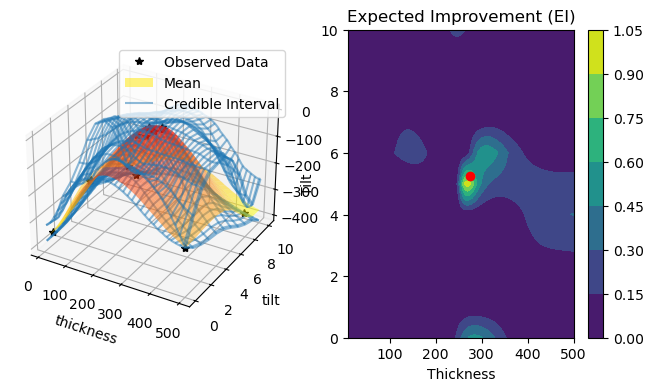

Time elapsed (hh:mm:ss.ms):  0:06:55.060012 

Seed 1: Best obj -0.0 from iteration # 11 at x of 258.8213619478348 and 4.481623620279089



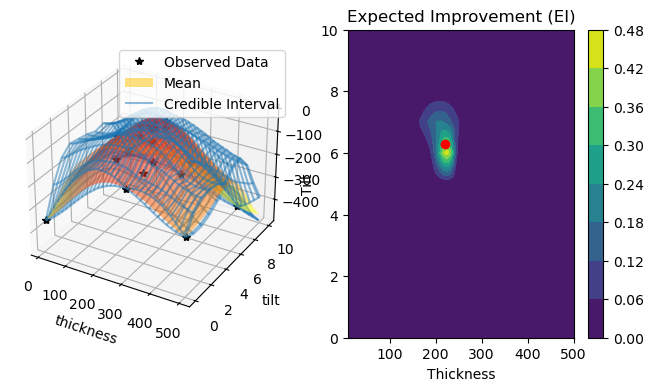

Time elapsed (hh:mm:ss.ms):  0:08:44.381476 

Seed 2: Best obj -0.0 from iteration # 12 at x of 255.44531865426424 and 4.459750748754202



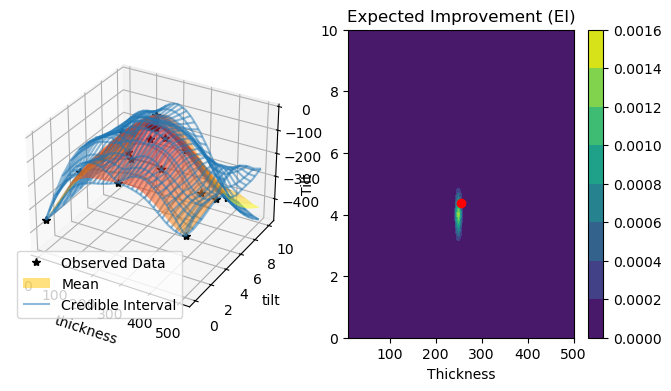

Time elapsed (hh:mm:ss.ms):  0:03:28.718163 

Seed 3: Best obj -0.8404735724758089 from iteration # 7 at x of 263.42704925550265 and 4.468273598066415



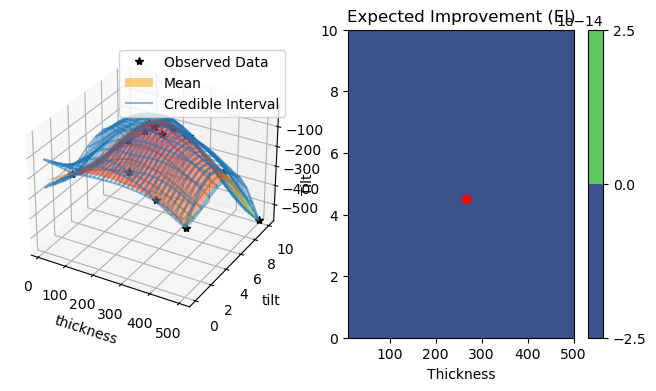

Time elapsed (hh:mm:ss.ms):  0:06:57.467266 

Seed 4: Best obj -0.0 from iteration # 10 at x of 256.54856353546785 and 4.81843010925863



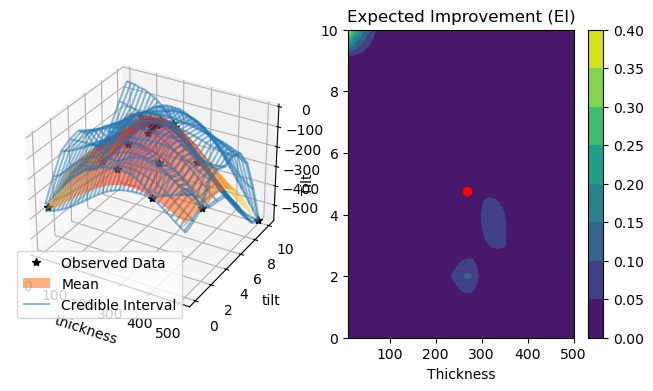

Time elapsed (hh:mm:ss.ms):  0:18:50.003824 

Seed 5: Best obj -0.0 from iteration # 9 at x of 259.1036445482453 and 4.473045292853306



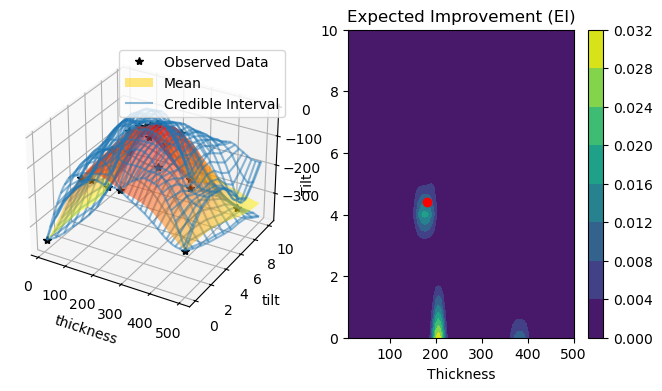

Time elapsed (hh:mm:ss.ms):  0:12:48.697382 

Seed 6: Best obj -0.0 from iteration # 12 at x of 257.592272737143 and 4.371393635735865



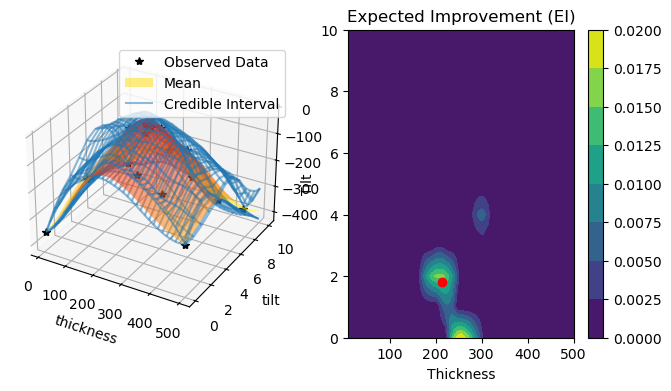

Time elapsed (hh:mm:ss.ms):  0:10:48.703225 

Seed 7: Best obj -0.8404735724758089 from iteration # 22 at x of 260.93432544382813 and 4.365464198099887



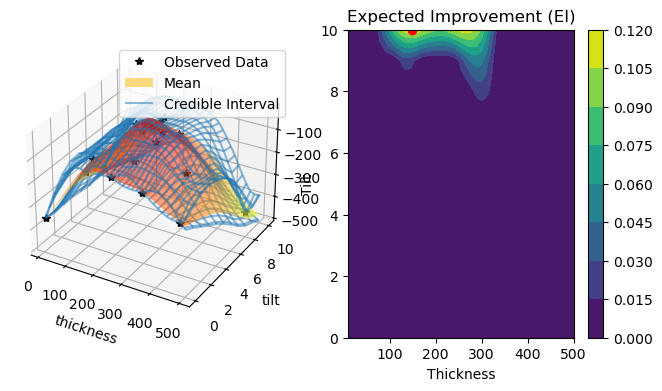

Time elapsed (hh:mm:ss.ms):  0:17:24.095596 

Seed 8: Best obj -0.0 from iteration # 14 at x of 257.57724345705935 and 4.504644153095659



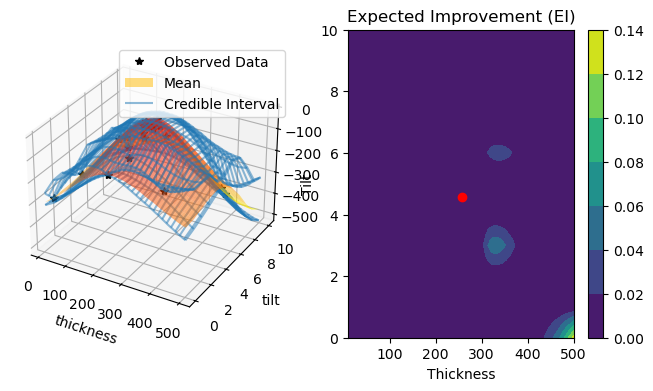

Time elapsed (hh:mm:ss.ms):  0:13:39.919511 

Seed 9: Best obj -0.0 from iteration # 5 at x of 256.181309114055 and 4.174645897185125



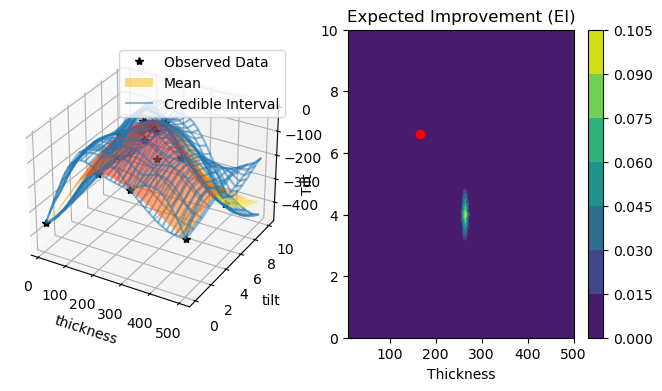

Time elapsed (hh:mm:ss.ms):  0:11:44.083571 

Seed 10: Best obj -0.0 from iteration # 12 at x of 256.65957084459876 and 4.729519599408975



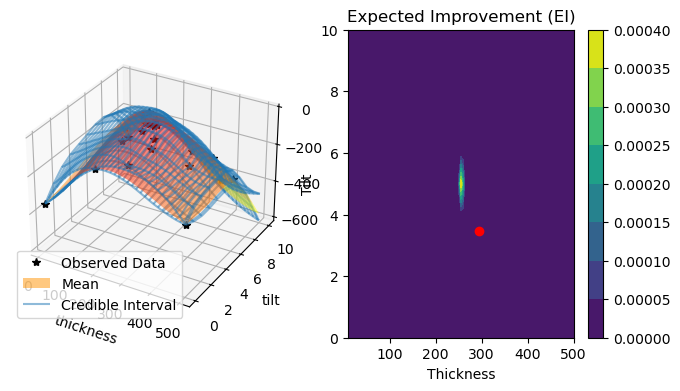

Time elapsed (hh:mm:ss.ms):  0:08:29.166987 

Seed 11: Best obj -0.0 from iteration # 10 at x of 259.18620244548583 and 4.5816784688273176



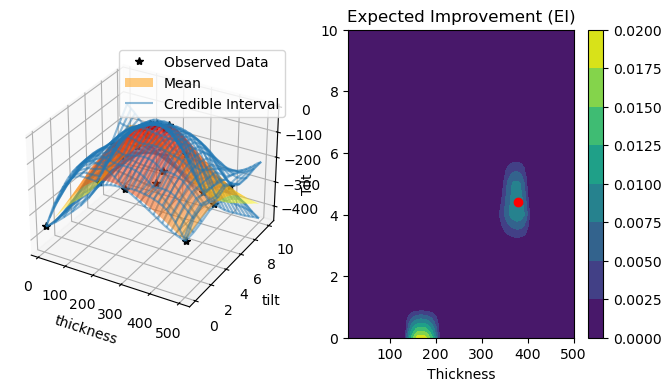

Time elapsed (hh:mm:ss.ms):  0:06:56.480183 

Seed 12: Best obj -4.501781725557835 from iteration # 9 at x of 235.4960088781818 and 4.027295959178055



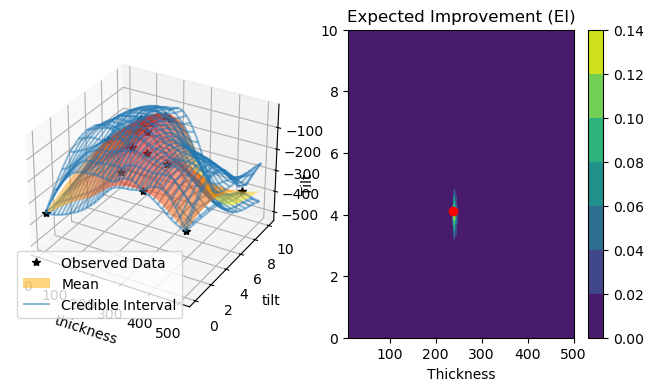

Time elapsed (hh:mm:ss.ms):  0:10:09.727735 

Seed 13: Best obj -0.0 from iteration # 4 at x of 259.3368971842136 and 4.870298884944539



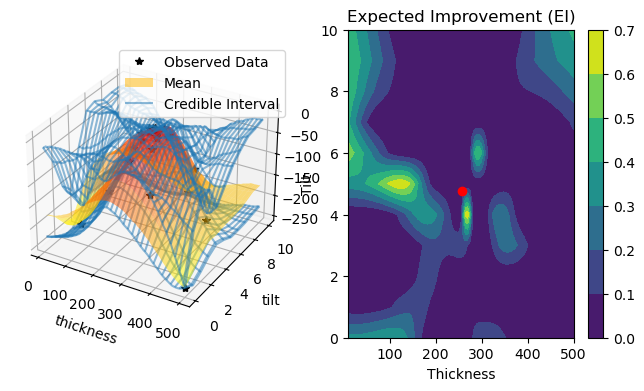

Time elapsed (hh:mm:ss.ms):  0:27:07.802730 

Seed 14: Best obj -0.0 from iteration # 7 at x of 255.93107917842002 and 4.051682403362497



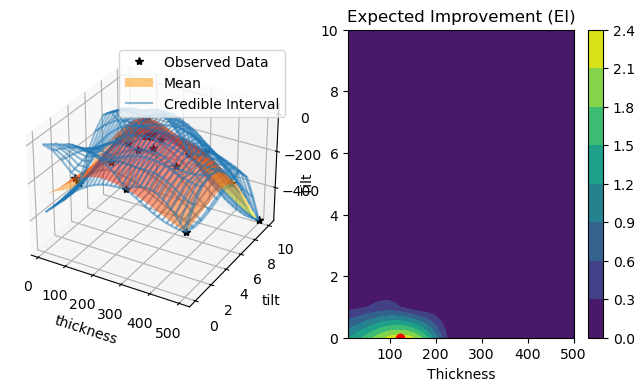

Time elapsed (hh:mm:ss.ms):  0:10:41.989708 

Seed 15: Best obj -0.0 from iteration # 15 at x of 258.971528790375 and 4.477489334216861



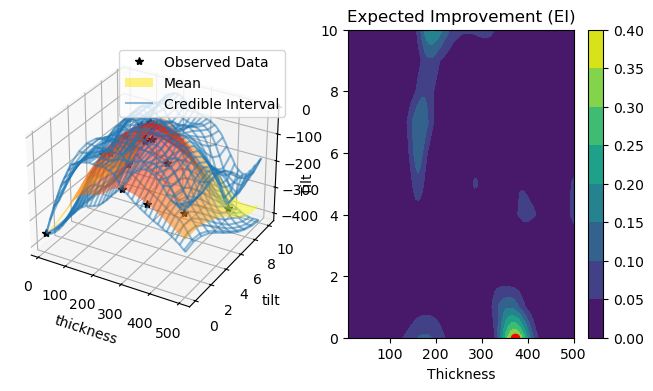

Time elapsed (hh:mm:ss.ms):  0:22:20.595841 

Seed 16: Best obj -0.0 from iteration # 13 at x of 256.45185298116684 and 4.197817589136037



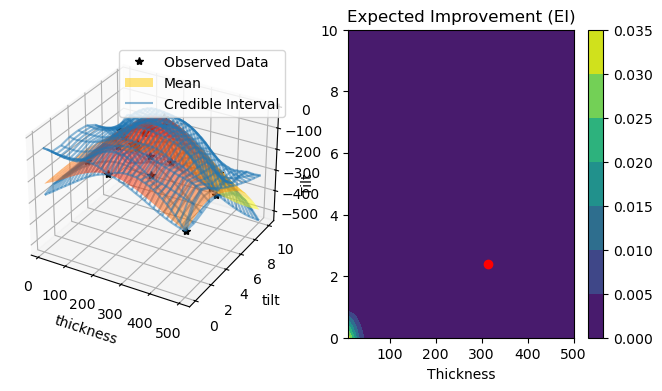

Time elapsed (hh:mm:ss.ms):  0:15:10.045632 

Seed 17: Best obj -0.0 from iteration # 12 at x of 256.207770128515 and 4.446585383487629



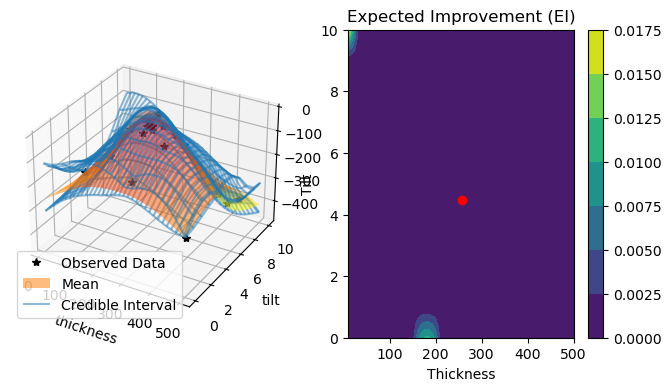

Time elapsed (hh:mm:ss.ms):  0:05:48.940850 

Seed 18: Best obj -0.0 from iteration # 7 at x of 255.2860067144904 and 4.228675883280948



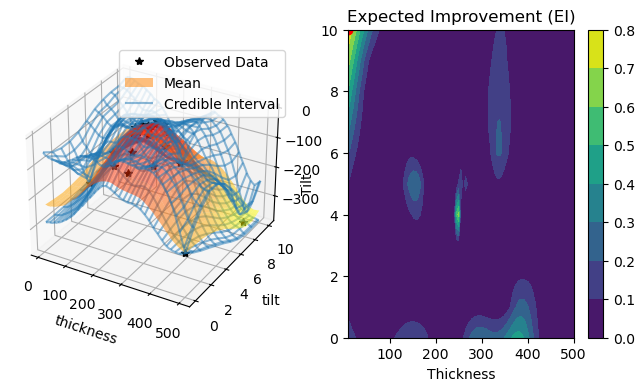

Time elapsed (hh:mm:ss.ms):  0:13:34.031553 

Seed 19: Best obj -0.0 from iteration # 9 at x of 256.68725315083435 and 4.407144053185627



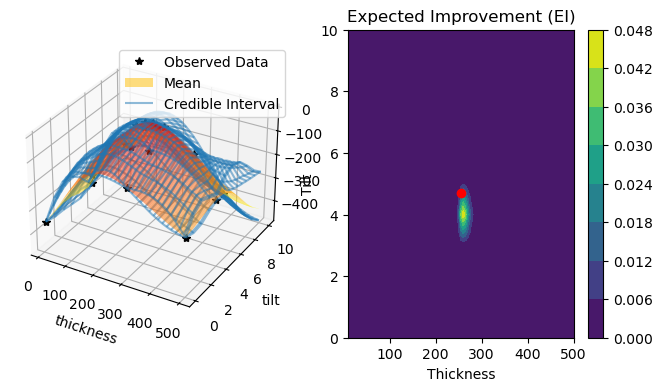

Time elapsed (hh:mm:ss.ms):  0:10:36.566566 

Seed 0: Best obj -0.0 from iteration # 10 at x of 257.02675826084675 and 4.671788469340257



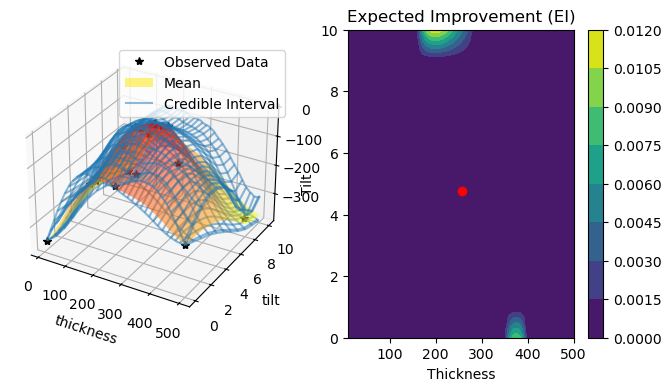

Time elapsed (hh:mm:ss.ms):  0:23:15.040192 

Seed 1: Best obj -0.0 from iteration # 9 at x of 259.3694471978322 and 4.97346035037315



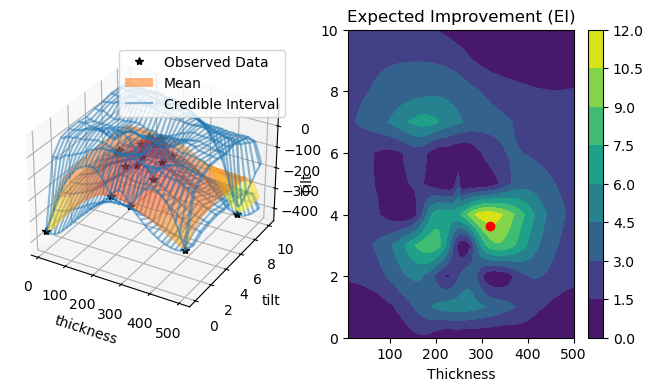

Time elapsed (hh:mm:ss.ms):  0:37:40.269420 

Seed 2: Best obj -0.0 from iteration # 9 at x of 257.5447463234991 and 4.668395737490195



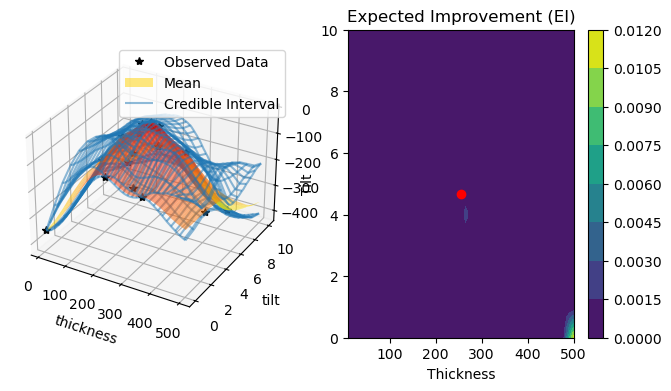

Time elapsed (hh:mm:ss.ms):  0:25:38.129368 

Seed 3: Best obj -1.7201156012900052 from iteration # 13 at x of 245.53396008164265 and 4.584880206314472



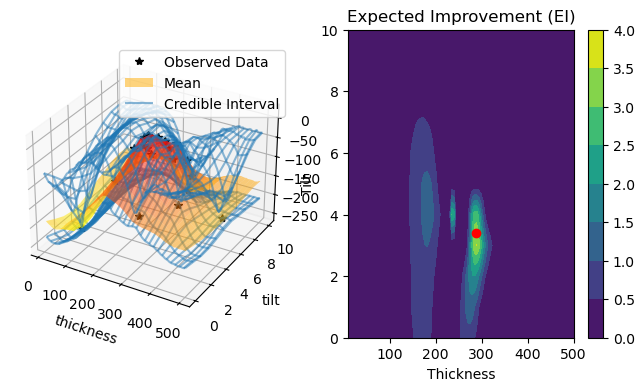

Time elapsed (hh:mm:ss.ms):  0:43:42.677265 

Seed 4: Best obj -0.0 from iteration # 5 at x of 250.18845078106898 and 4.274910456240269



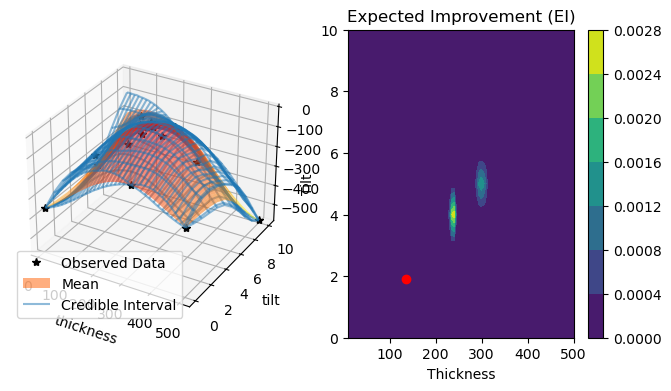

Time elapsed (hh:mm:ss.ms):  0:21:57.251906 

Seed 5: Best obj -0.8404736126393801 from iteration # 16 at x of 269.1793676728804 and 4.231538409352085



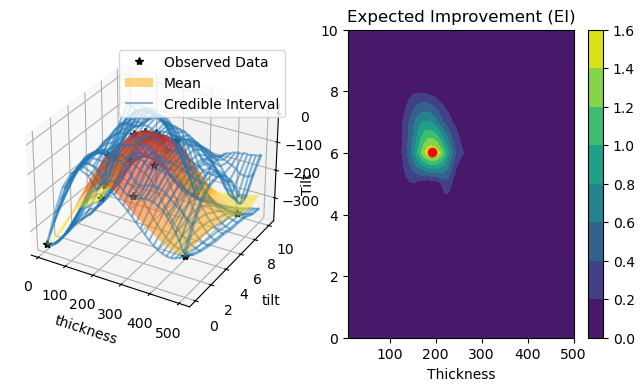

Time elapsed (hh:mm:ss.ms):  0:32:04.159375 

Seed 6: Best obj -0.0 from iteration # 9 at x of 259.11878188137496 and 4.585406850001937



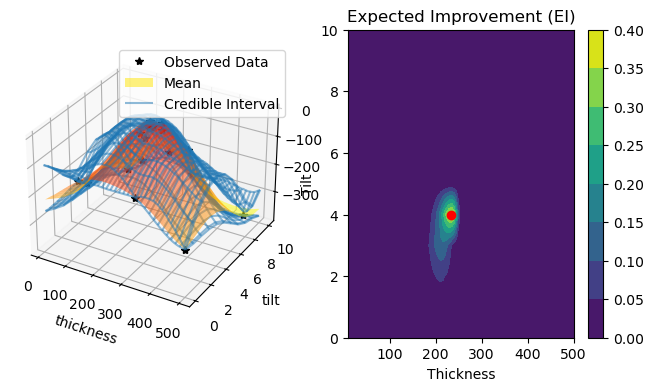

Time elapsed (hh:mm:ss.ms):  0:14:56.946916 

Seed 7: Best obj -0.0 from iteration # 17 at x of 254.31762960136317 and 4.50815303299231



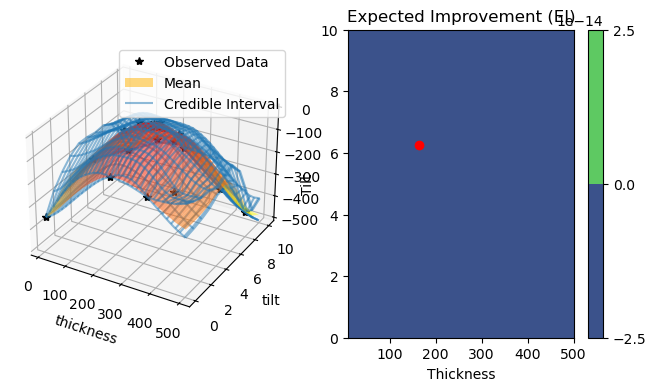

Time elapsed (hh:mm:ss.ms):  0:26:45.727738 

Seed 8: Best obj -0.0 from iteration # 18 at x of 257.5626242956585 and 4.347965443440394



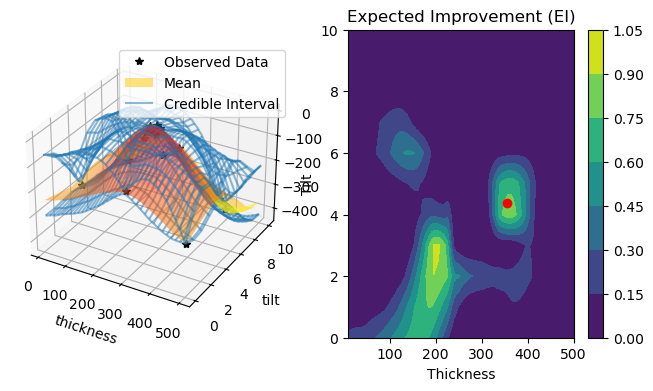

Time elapsed (hh:mm:ss.ms):  0:41:07.817942 

Seed 9: Best obj -0.0 from iteration # 8 at x of 256.49884469456424 and 4.788012291836628



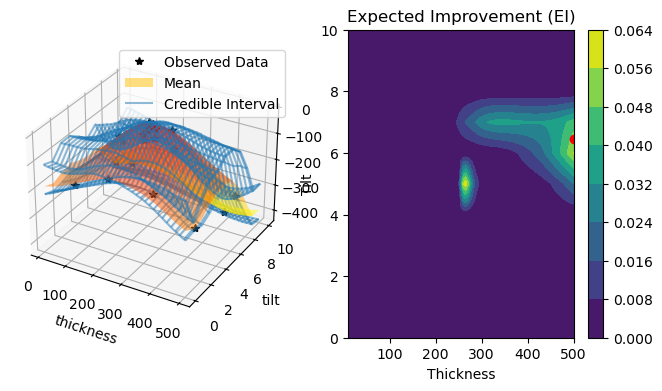

Time elapsed (hh:mm:ss.ms):  0:50:05.688624 

Seed 10: Best obj -0.0 from iteration # 8 at x of 251.3333833611622 and 4.1107918604164



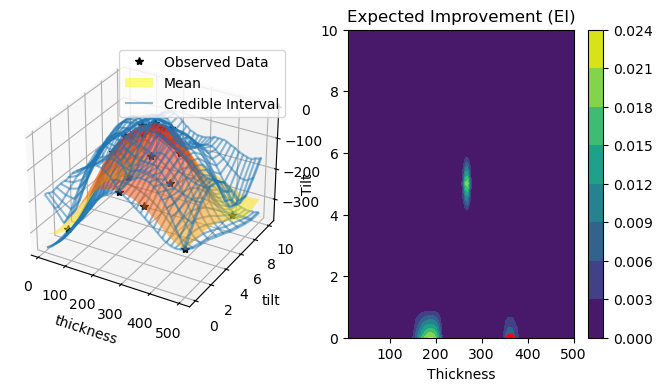

Time elapsed (hh:mm:ss.ms):  0:33:41.521957 

Seed 11: Best obj -0.0 from iteration # 8 at x of 256.005960715701 and 4.3216467240857135



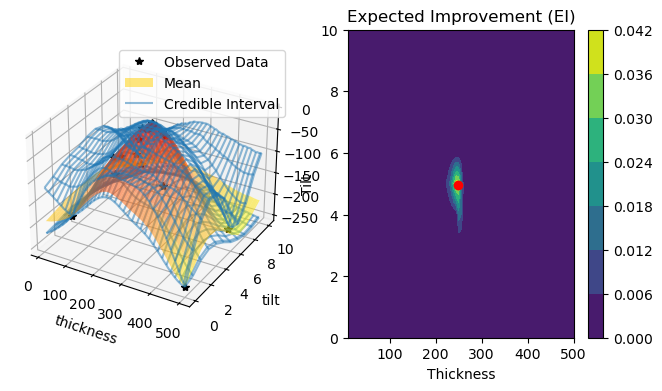

Time elapsed (hh:mm:ss.ms):  0:27:33.495841 

Seed 12: Best obj -0.0 from iteration # 6 at x of 259.7198376365822 and 4.300305379963167



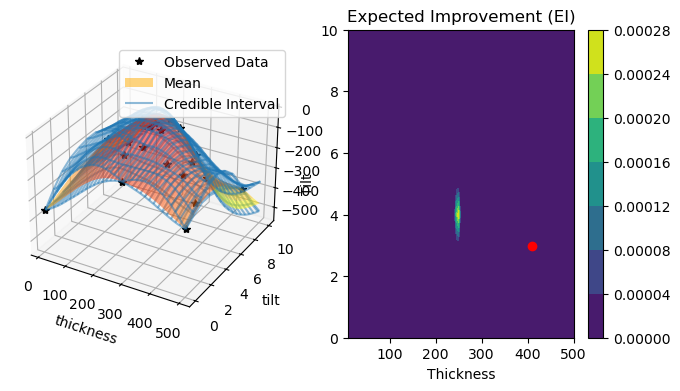

Time elapsed (hh:mm:ss.ms):  0:16:33.382378 

Seed 13: Best obj -0.8404736126393801 from iteration # 11 at x of 266.7228690983877 and 4.123824372671533



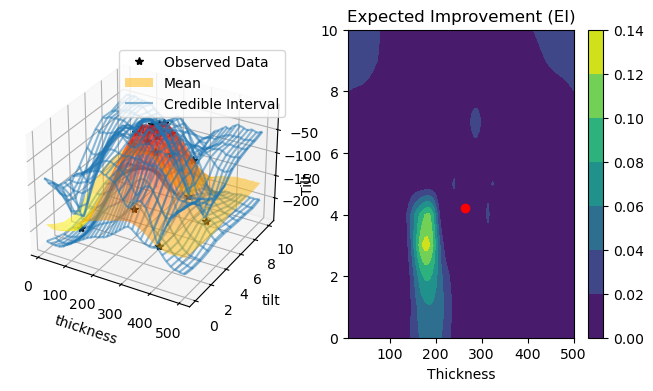

Time elapsed (hh:mm:ss.ms):  1:01:17.176805 

Seed 14: Best obj -0.0 from iteration # 8 at x of 259.19516990916566 and 4.754426080121521



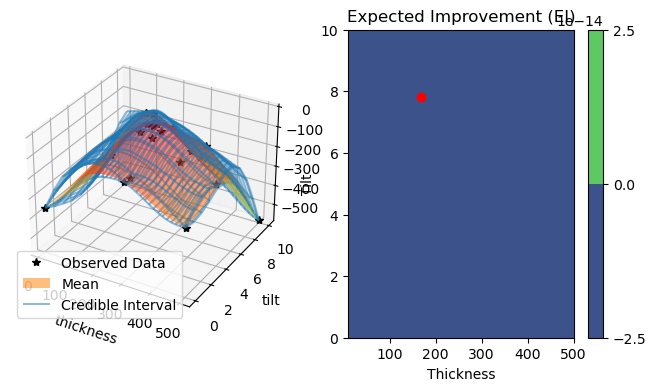

Time elapsed (hh:mm:ss.ms):  0:16:36.966732 

Seed 15: Best obj -0.0 from iteration # 9 at x of 258.94103755318247 and 4.4294906341162



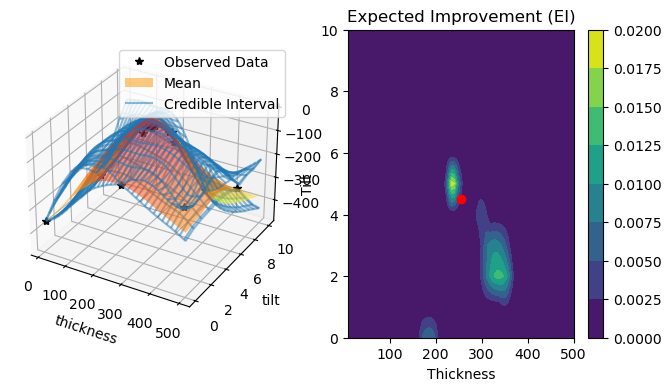

Time elapsed (hh:mm:ss.ms):  0:22:11.637703 

Seed 16: Best obj -0.0 from iteration # 10 at x of 255.14556727570167 and 4.763747937126757



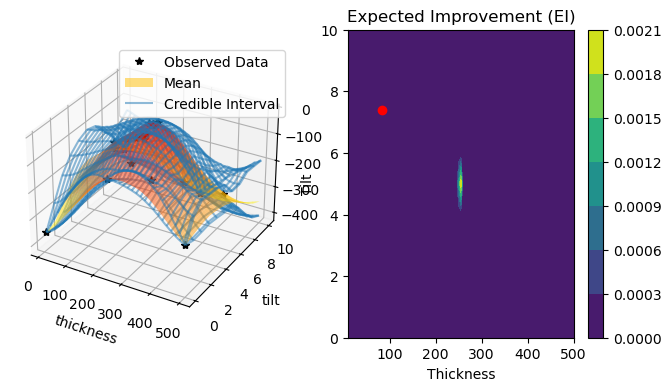

Time elapsed (hh:mm:ss.ms):  0:33:42.994514 

Seed 17: Best obj -0.0 from iteration # 4 at x of 251.67242419973124 and 4.494257630721378



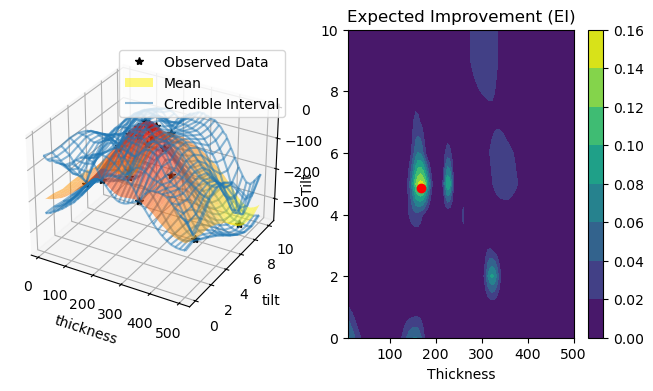

Time elapsed (hh:mm:ss.ms):  0:24:54.585086 

Seed 18: Best obj -0.0 from iteration # 16 at x of 250.96978803232878 and 4.786471434471465



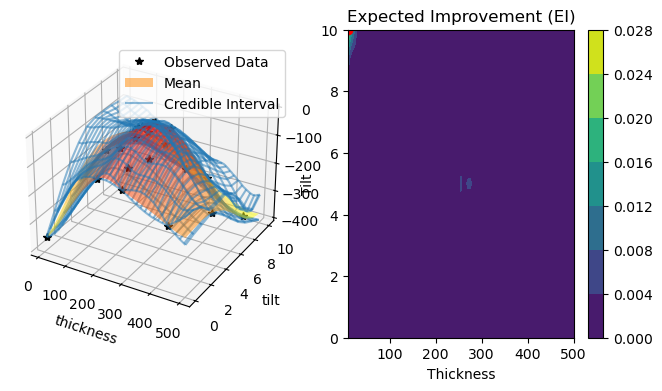

Time elapsed (hh:mm:ss.ms):  0:16:38.897705 

Seed 19: Best obj -0.8404736126393801 from iteration # 12 at x of 263.70541934593837 and 4.559421290395849



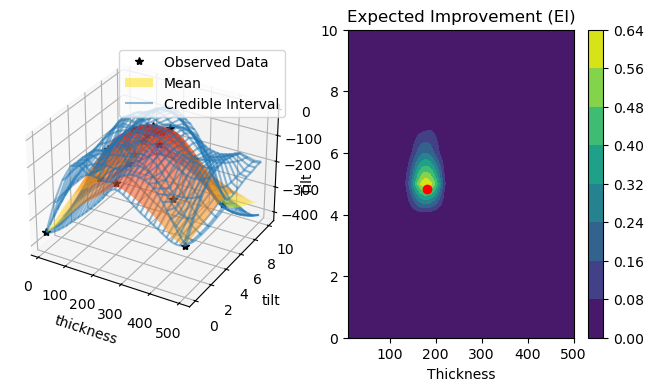

Time elapsed (hh:mm:ss.ms):  0:37:29.390052 

Seed 0: Best obj -0.0 from iteration # 7 at x of 256.28568286440395 and 4.069171762479005



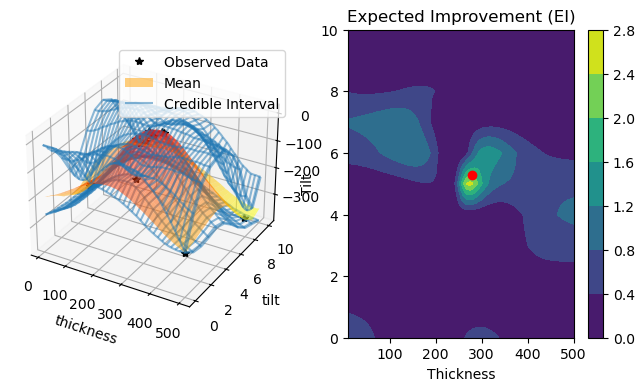

Time elapsed (hh:mm:ss.ms):  0:01:36.984854 

Seed 1: Best obj -0.0 from iteration # 11 at x of 256.6468481266209 and 4.475477893208154



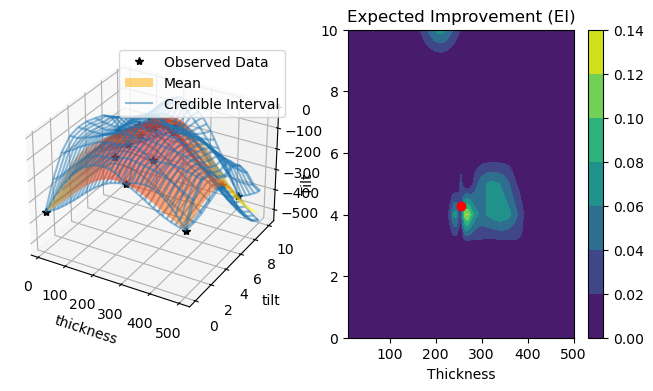

Time elapsed (hh:mm:ss.ms):  0:03:06.254165 

Seed 2: Best obj -0.0 from iteration # 13 at x of 256.0438034862167 and 4.456389017994709



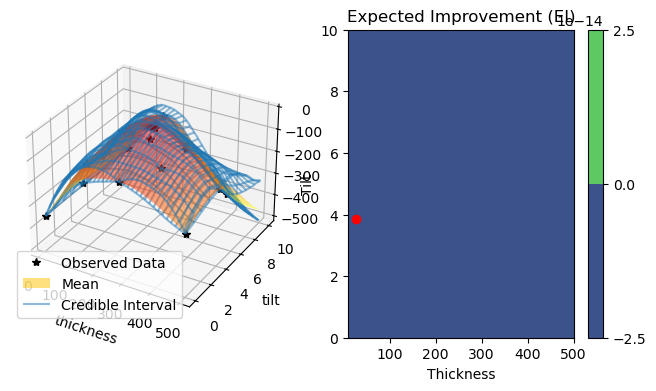

Time elapsed (hh:mm:ss.ms):  0:01:02.625819 

Seed 3: Best obj -0.0 from iteration # 9 at x of 255.62141533304927 and 4.723879027565373



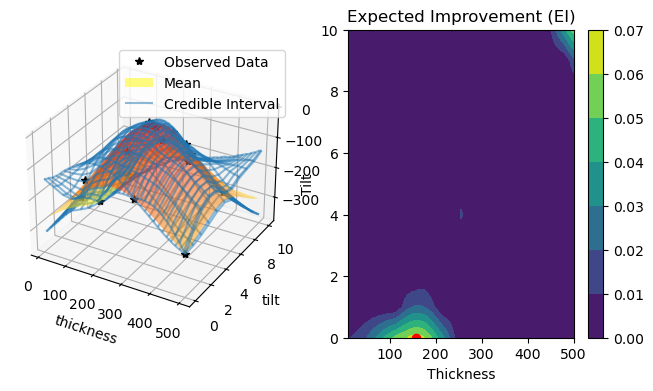

Time elapsed (hh:mm:ss.ms):  0:02:11.656130 

Seed 4: Best obj -0.0 from iteration # 7 at x of 257.06069691118097 and 4.7576661452939195



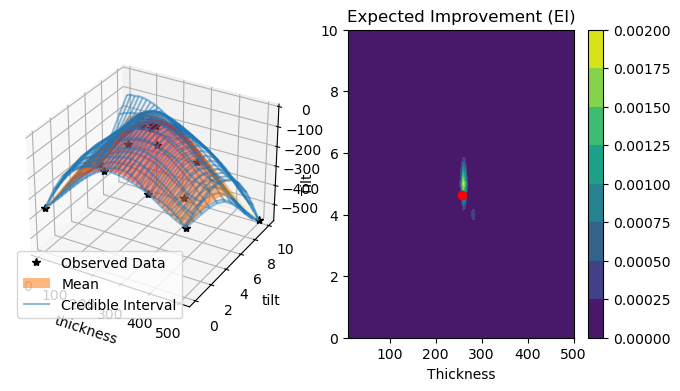

Time elapsed (hh:mm:ss.ms):  0:02:13.118635 

Seed 5: Best obj -0.0 from iteration # 9 at x of 255.09775937862472 and 4.52076882095011



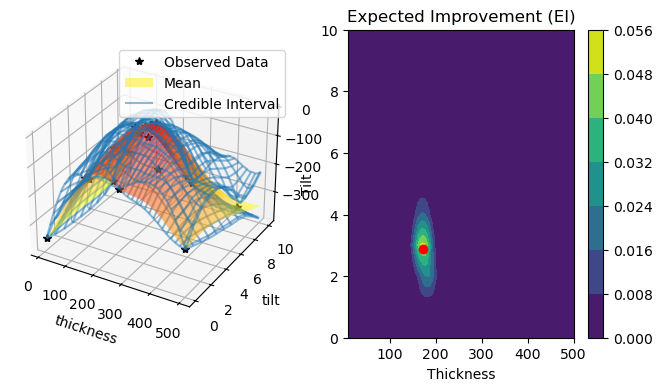

Time elapsed (hh:mm:ss.ms):  0:03:22.822175 

Seed 6: Best obj -0.0 from iteration # 13 at x of 259.27990161074626 and 4.397936167460494



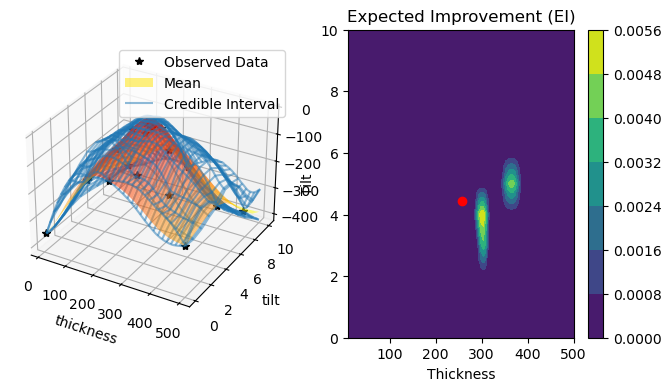

Time elapsed (hh:mm:ss.ms):  0:03:01.793437 

Seed 7: Best obj -0.0 from iteration # 20 at x of 258.54618105882633 and 4.394639032135578



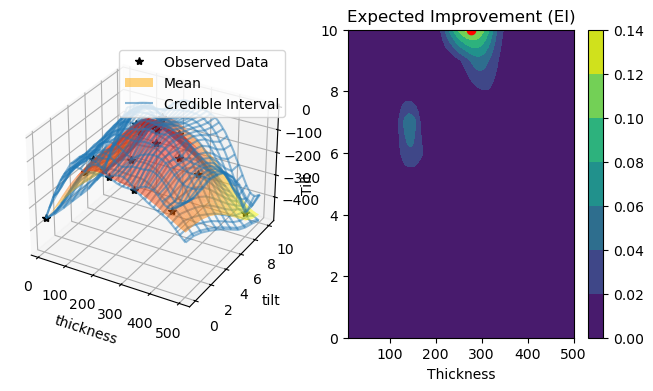

Time elapsed (hh:mm:ss.ms):  0:03:35.995049 

Seed 8: Best obj -0.0 from iteration # 14 at x of 258.687663349205 and 4.485385425905643



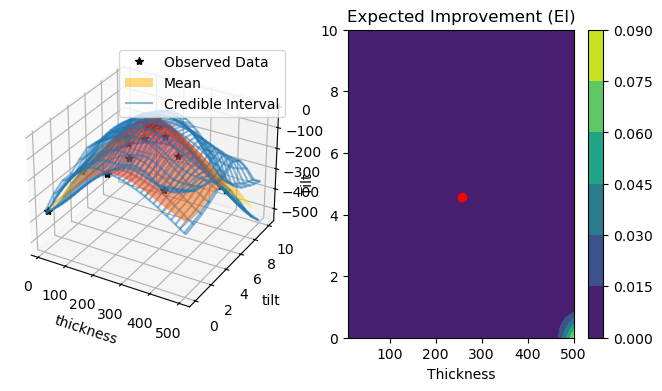

Time elapsed (hh:mm:ss.ms):  0:02:40.412514 

Seed 9: Best obj -0.0 from iteration # 5 at x of 254.58366776416534 and 4.171592362408637



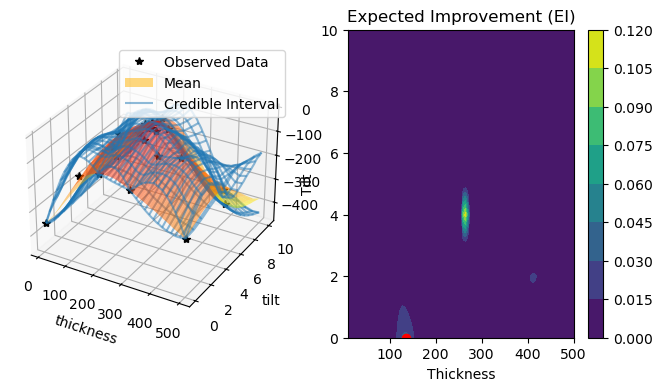

Time elapsed (hh:mm:ss.ms):  0:03:43.701504 

Seed 10: Best obj -0.0 from iteration # 8 at x of 250.7005759332221 and 4.538212603607452



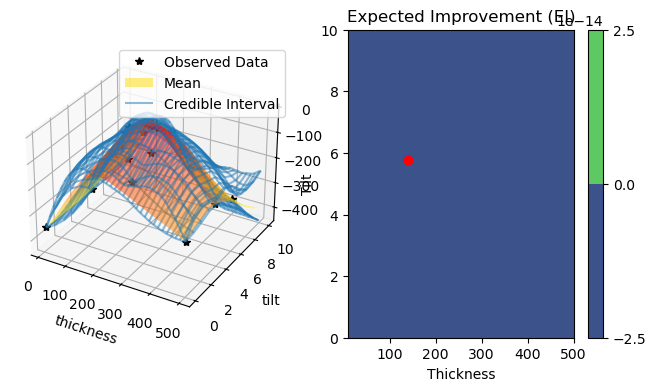

Time elapsed (hh:mm:ss.ms):  0:02:27.663455 

Seed 11: Best obj -0.0 from iteration # 9 at x of 255.56324132034305 and 4.080561702987404



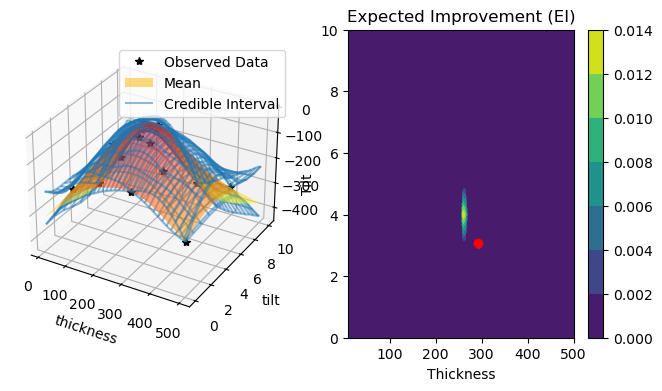

Time elapsed (hh:mm:ss.ms):  0:03:40.322993 

Seed 12: Best obj -0.0 from iteration # 12 at x of 253.0667272522302 and 4.613565117805393



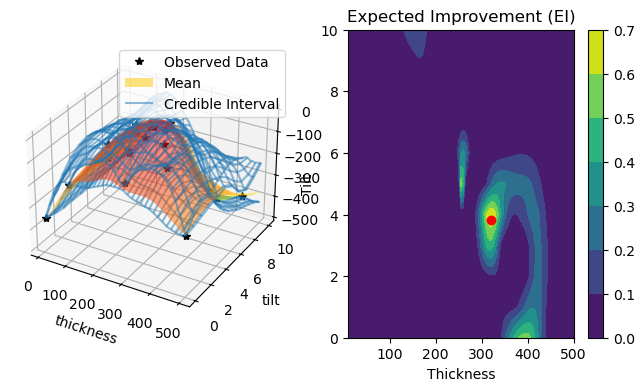

Time elapsed (hh:mm:ss.ms):  0:02:22.512078 

Seed 13: Best obj -0.0 from iteration # 4 at x of 257.4053865444202 and 4.82750777957571



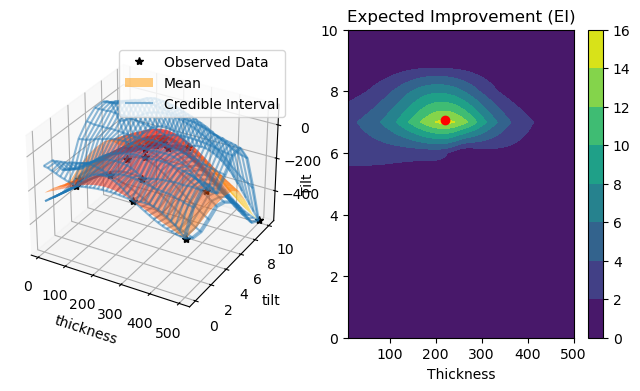

Time elapsed (hh:mm:ss.ms):  0:03:51.480389 

Seed 14: Best obj -0.0 from iteration # 8 at x of 252.47705678664758 and 4.97754705411253



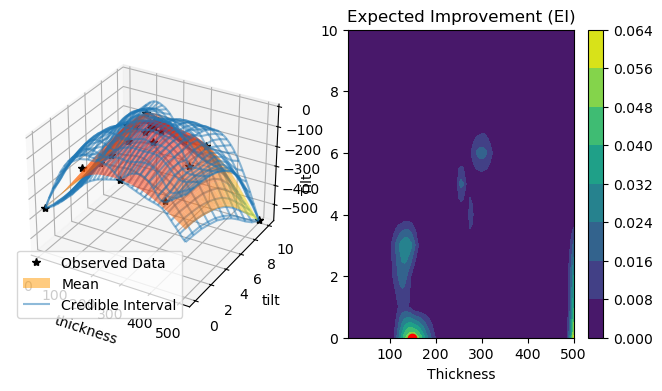

Time elapsed (hh:mm:ss.ms):  0:03:32.382406 

Seed 15: Best obj -0.0 from iteration # 15 at x of 255.72119624087438 and 4.655318628652806



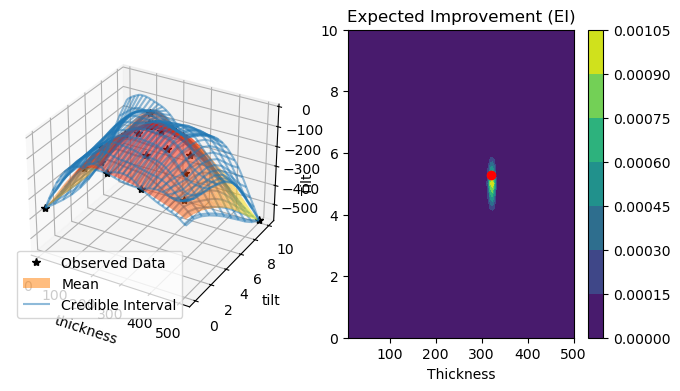

Time elapsed (hh:mm:ss.ms):  0:03:01.343748 

Seed 16: Best obj -0.8404736002303252 from iteration # 20 at x of 260.52968369502076 and 4.599974923296037



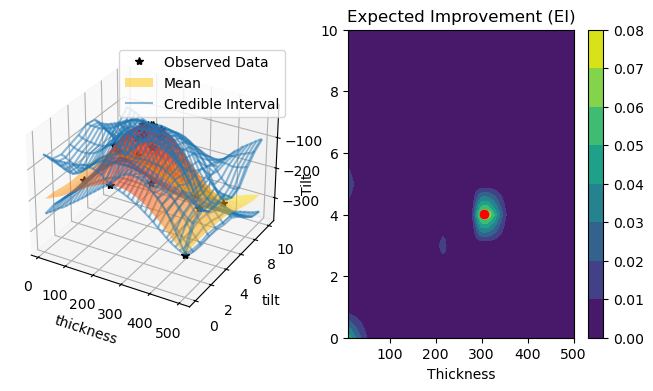

Time elapsed (hh:mm:ss.ms):  0:04:16.605613 

Seed 17: Best obj -0.0 from iteration # 14 at x of 252.513924535344 and 4.189340755464073



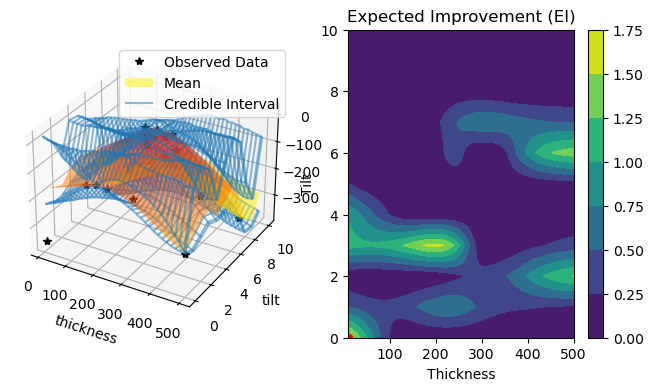

Time elapsed (hh:mm:ss.ms):  0:03:42.082815 

Seed 18: Best obj -0.0 from iteration # 23 at x of 253.28981424225694 and 4.260341488243683



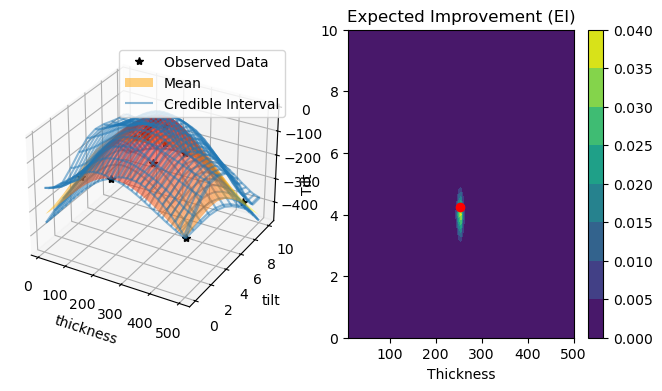

Time elapsed (hh:mm:ss.ms):  0:01:56.492566 

Seed 19: Best obj -0.0 from iteration # 9 at x of 258.4484354601398 and 4.390933253138292



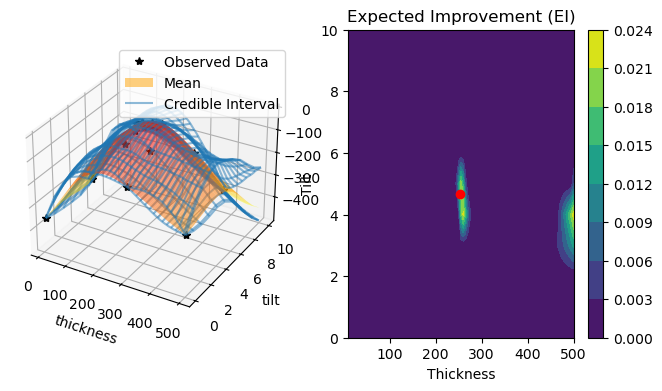

Time elapsed (hh:mm:ss.ms):  0:03:03.027915 

Seed 0: Best obj -0.0 from iteration # 7 at x of 256.2471466819969 and 4.075533757843006



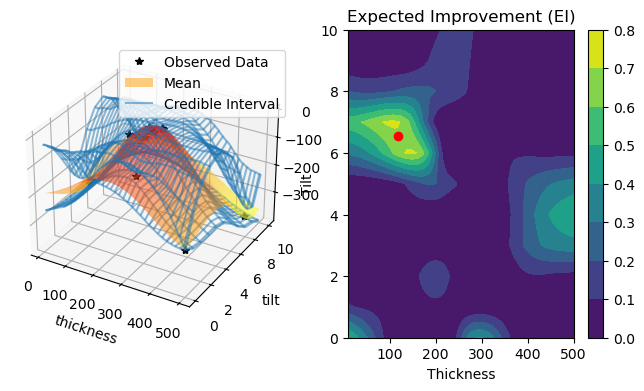

Time elapsed (hh:mm:ss.ms):  0:02:34.989994 

Seed 1: Best obj -0.0 from iteration # 11 at x of 256.60242279690465 and 4.472942489445318



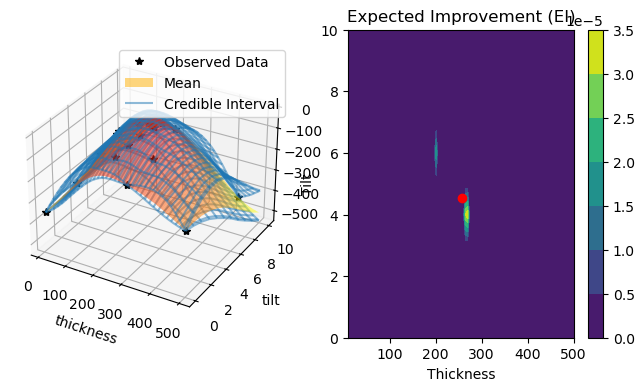

Time elapsed (hh:mm:ss.ms):  0:02:00.351100 

Seed 2: Best obj -0.0 from iteration # 12 at x of 257.1321620609256 and 4.373818167173994



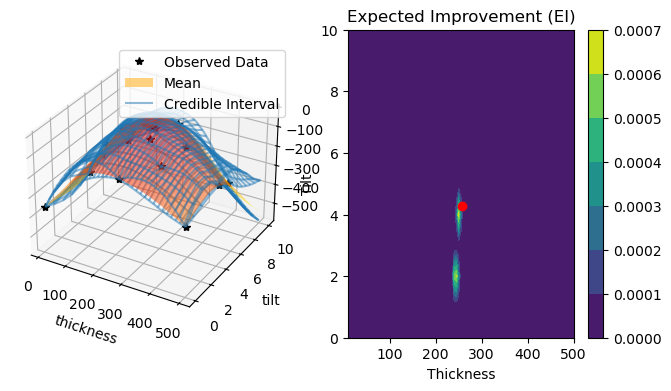

Time elapsed (hh:mm:ss.ms):  0:01:20.485130 

Seed 3: Best obj -0.0 from iteration # 9 at x of 255.8087833615568 and 4.731753529388438



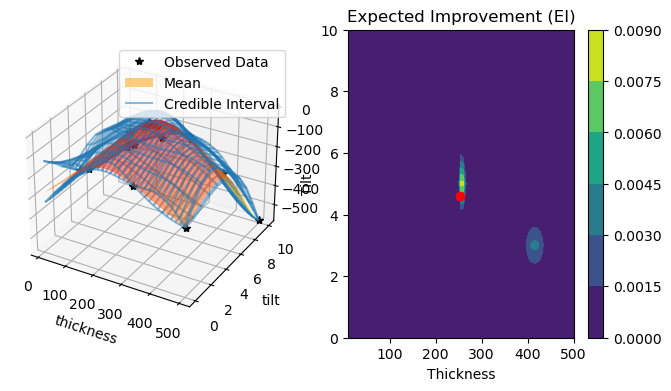

Time elapsed (hh:mm:ss.ms):  0:03:27.414468 

Seed 4: Best obj -0.0 from iteration # 7 at x of 257.1191231993791 and 4.7546591598238965



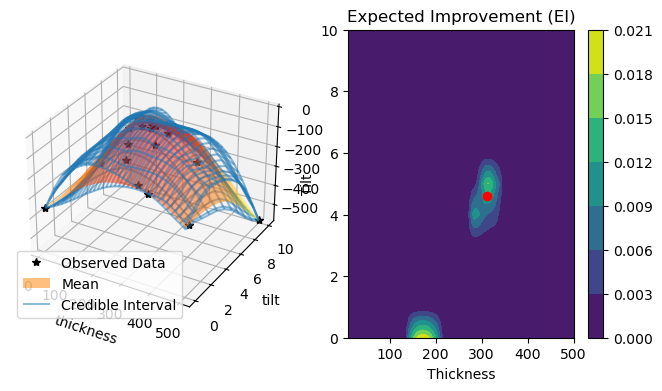

Time elapsed (hh:mm:ss.ms):  0:02:41.387290 

Seed 5: Best obj -0.0 from iteration # 9 at x of 254.42553880750128 and 4.560633776433667



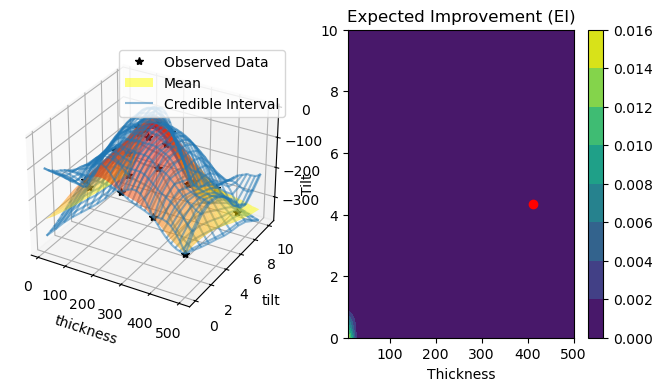

Time elapsed (hh:mm:ss.ms):  0:03:07.500205 

Seed 6: Best obj -0.0 from iteration # 18 at x of 259.1013846655117 and 4.445993372812659



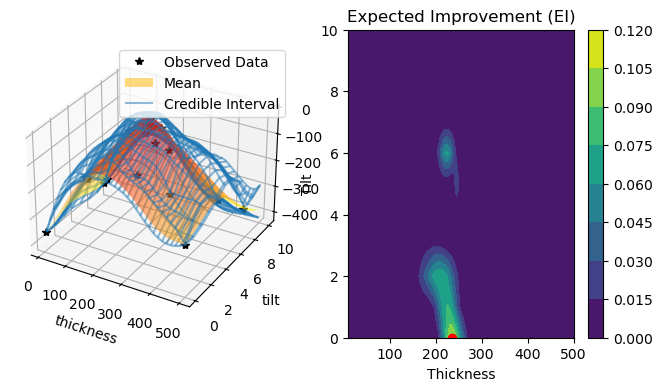

Time elapsed (hh:mm:ss.ms):  0:05:22.377675 

Seed 7: Best obj -0.8404735771625838 from iteration # 19 at x of 263.27780010669426 and 4.380226921662127



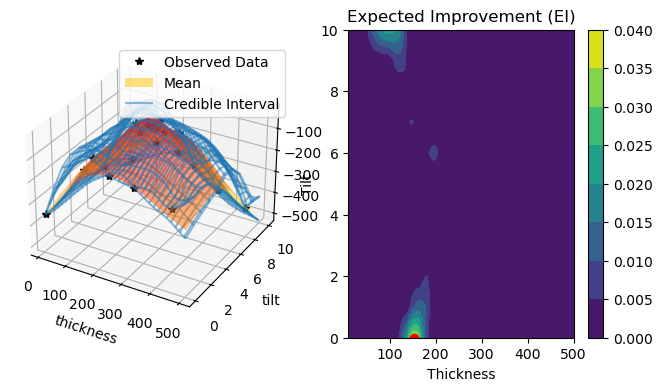

Time elapsed (hh:mm:ss.ms):  0:04:41.650412 

Seed 8: Best obj -0.0 from iteration # 14 at x of 258.5195058322613 and 4.489720276835829



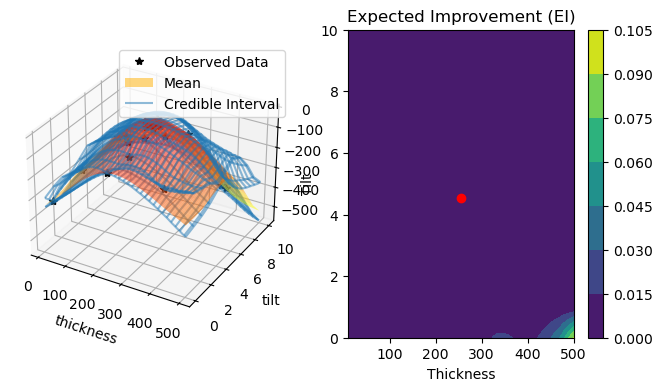

Time elapsed (hh:mm:ss.ms):  0:03:27.071732 

Seed 9: Best obj -0.0 from iteration # 5 at x of 255.207361289264 and 4.176208878055579



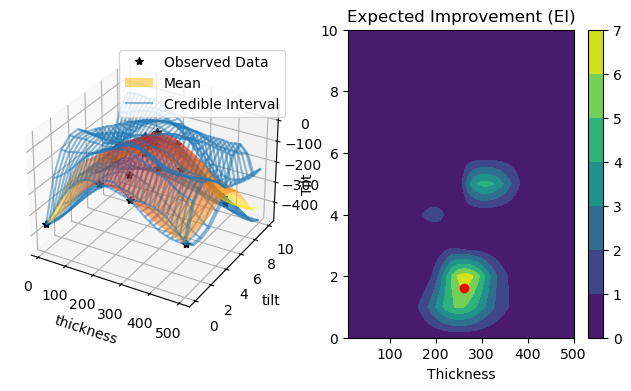

Time elapsed (hh:mm:ss.ms):  0:05:38.541255 

Seed 10: Best obj -0.0 from iteration # 8 at x of 250.72399748286267 and 4.541991155120531



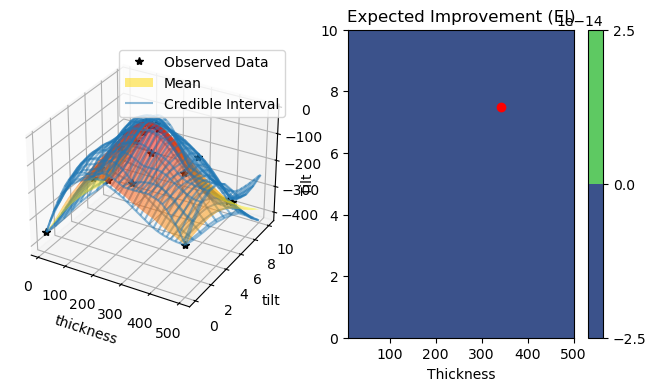

Time elapsed (hh:mm:ss.ms):  0:02:23.881102 

Seed 11: Best obj -0.0 from iteration # 9 at x of 255.58196442651465 and 4.0796443995817295



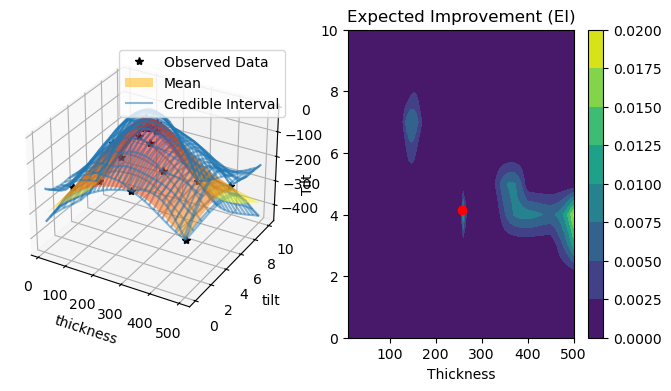

Time elapsed (hh:mm:ss.ms):  0:04:27.593628 

Seed 12: Best obj -0.0 from iteration # 13 at x of 253.23949263119422 and 4.664893272086009



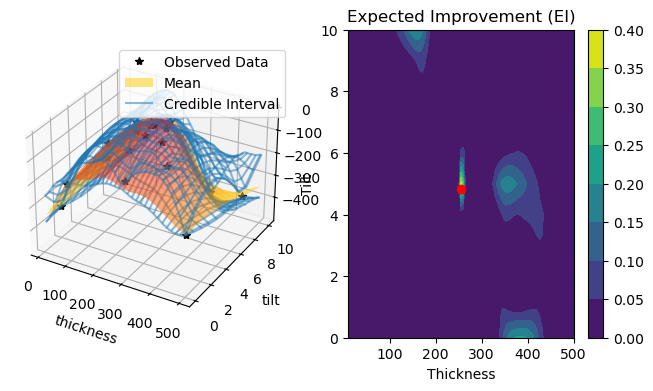

Time elapsed (hh:mm:ss.ms):  0:04:06.326172 

Seed 13: Best obj -0.0 from iteration # 4 at x of 257.7291673209581 and 4.832859619414305



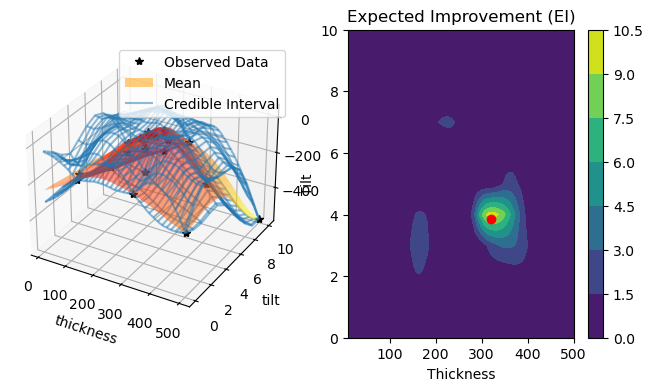

Time elapsed (hh:mm:ss.ms):  0:04:23.590971 

Seed 14: Best obj -0.0 from iteration # 14 at x of 250.297381751398 and 4.4540513281339615



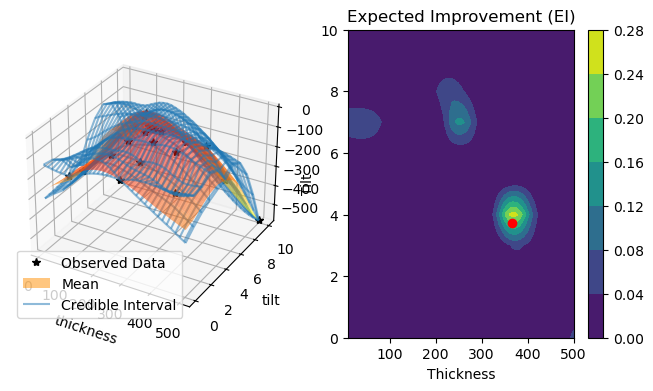

Time elapsed (hh:mm:ss.ms):  0:04:45.427015 

Seed 15: Best obj -0.0 from iteration # 8 at x of 258.6863061908292 and 4.265858258856455



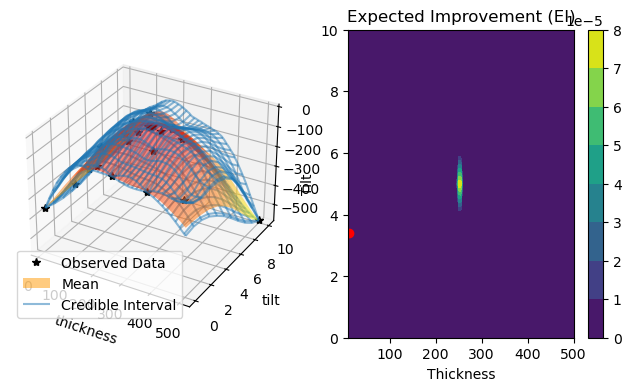

Time elapsed (hh:mm:ss.ms):  0:02:29.157199 

Seed 16: Best obj -0.0 from iteration # 14 at x of 250.06389875704215 and 4.594703687198505



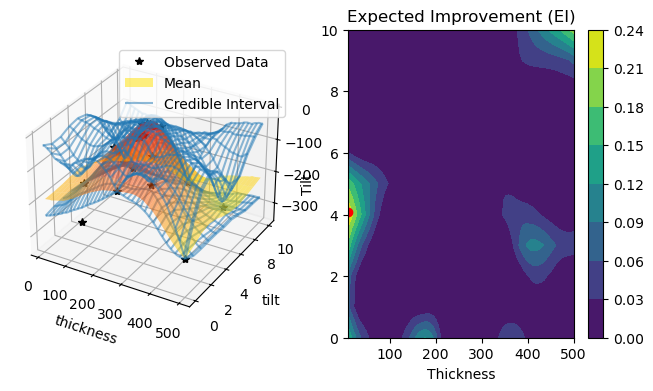

Time elapsed (hh:mm:ss.ms):  0:04:44.808545 

Seed 17: Best obj -0.0 from iteration # 12 at x of 253.25213792614207 and 4.5685931773980535



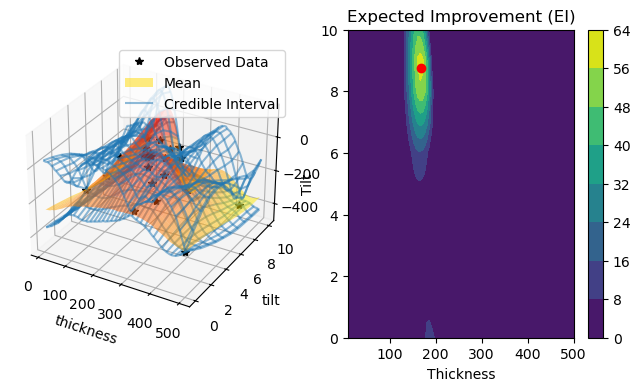

Time elapsed (hh:mm:ss.ms):  0:04:43.822334 

Seed 18: Best obj -0.0 from iteration # 22 at x of 253.8179325195212 and 4.222381790477511



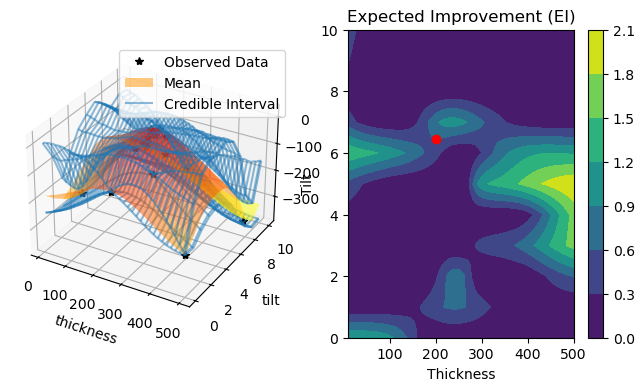

Time elapsed (hh:mm:ss.ms):  0:03:05.986806 

Seed 19: Best obj -0.0 from iteration # 9 at x of 258.380309634859 and 4.389930584360842



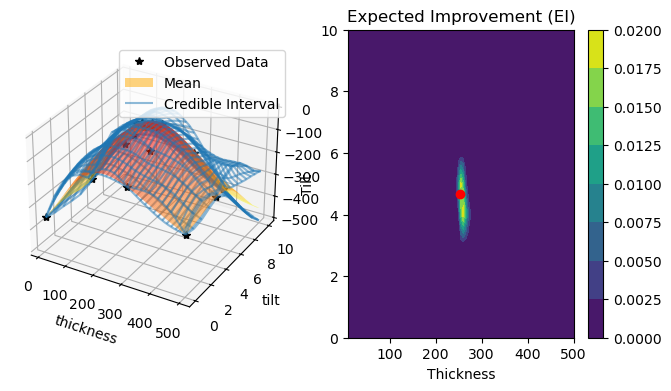

Time elapsed (hh:mm:ss.ms):  0:04:16.516747 

Seed 0: Best obj -0.0 from iteration # 7 at x of 255.93552643299444 and 4.087452760458232



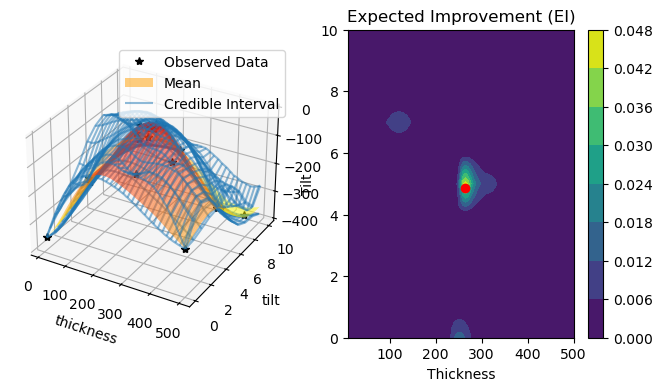

Time elapsed (hh:mm:ss.ms):  0:03:51.206960 

Seed 1: Best obj -0.0 from iteration # 11 at x of 257.19959992324414 and 4.477213486606545



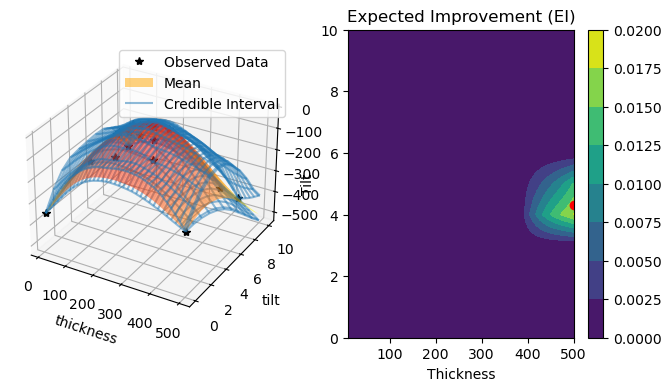

Time elapsed (hh:mm:ss.ms):  0:03:06.759828 

Seed 2: Best obj -0.0 from iteration # 11 at x of 257.9216336747147 and 4.400231667224052



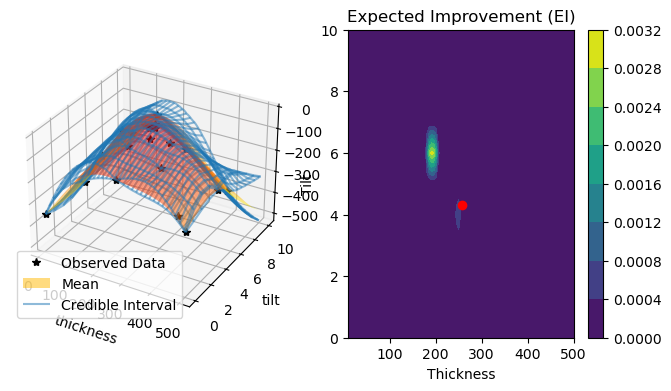

Time elapsed (hh:mm:ss.ms):  0:01:39.244853 

Seed 3: Best obj -0.0 from iteration # 12 at x of 253.8543598660681 and 4.413236783417655



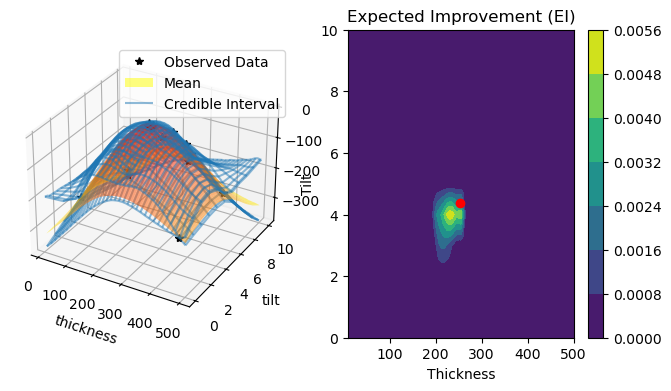

Time elapsed (hh:mm:ss.ms):  0:03:27.750540 

Seed 4: Best obj -0.0 from iteration # 7 at x of 252.31567119820136 and 4.737761832031694



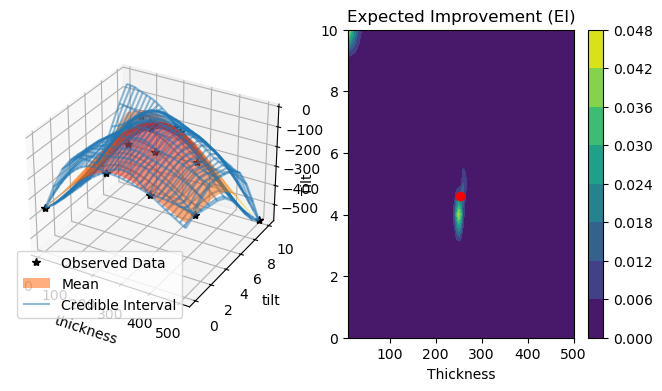

Time elapsed (hh:mm:ss.ms):  0:05:03.413076 

Seed 5: Best obj -0.0 from iteration # 9 at x of 254.85071594606285 and 4.56213160109839



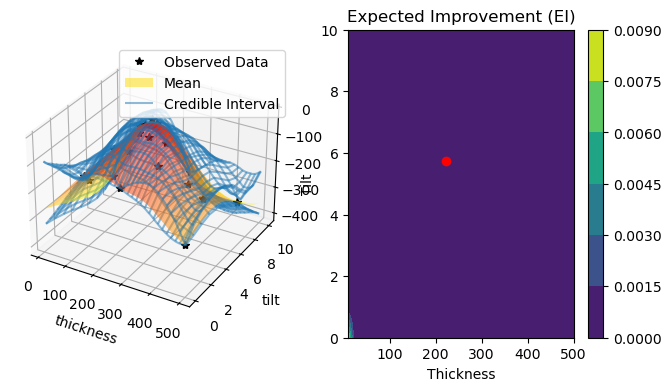

Time elapsed (hh:mm:ss.ms):  0:04:07.465862 

Seed 6: Best obj -0.0 from iteration # 13 at x of 258.873906260489 and 4.390806159837046



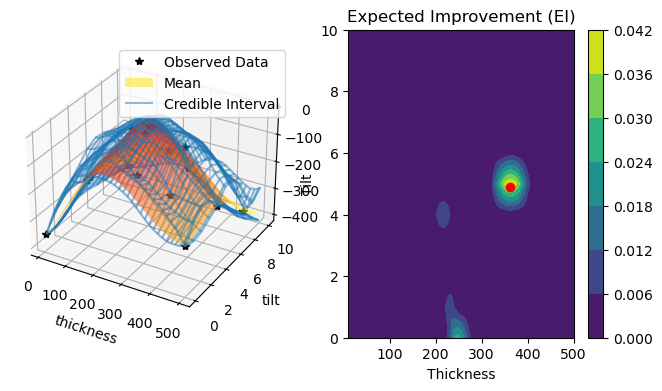

Time elapsed (hh:mm:ss.ms):  0:05:53.431010 

Seed 7: Best obj -0.0 from iteration # 15 at x of 254.6119984906933 and 4.444967426172436



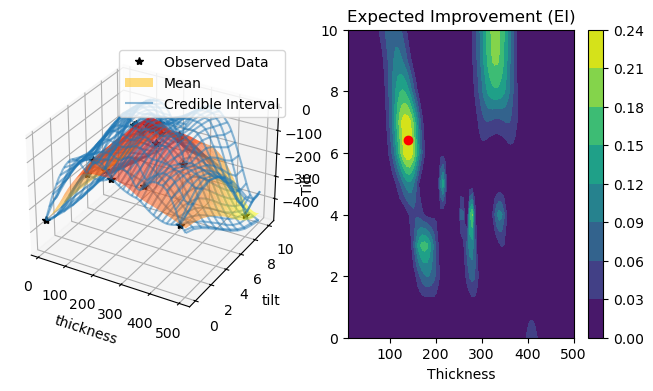

Time elapsed (hh:mm:ss.ms):  0:08:33.909042 

Seed 8: Best obj -0.0 from iteration # 14 at x of 258.25270985504966 and 4.492929144681637



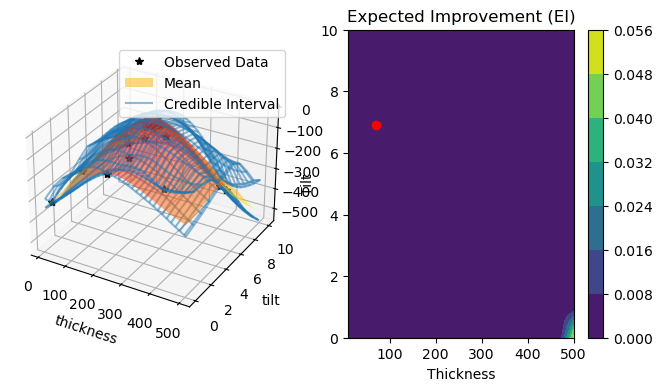

Time elapsed (hh:mm:ss.ms):  0:04:55.317480 

Seed 9: Best obj -0.0 from iteration # 5 at x of 255.01761033754693 and 4.172051618313773



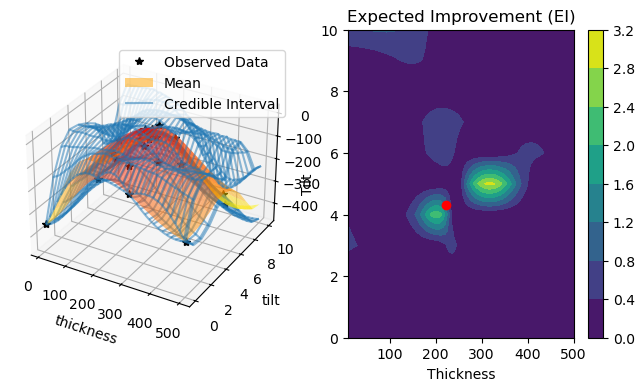

Time elapsed (hh:mm:ss.ms):  0:08:06.730418 

Seed 10: Best obj -0.0 from iteration # 8 at x of 250.72670926834718 and 4.547616792224419



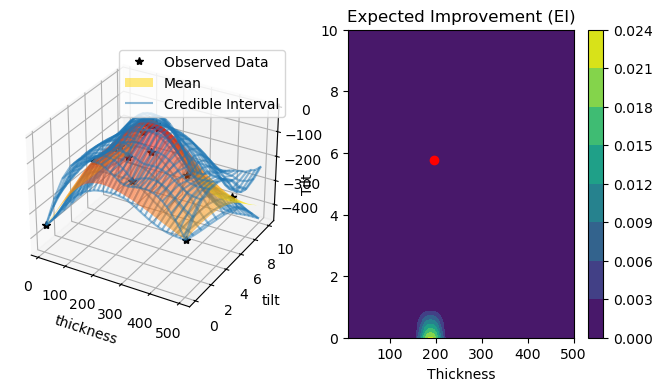

Time elapsed (hh:mm:ss.ms):  0:03:13.511439 

Seed 11: Best obj -0.0 from iteration # 9 at x of 255.02517515137183 and 4.085931036550527



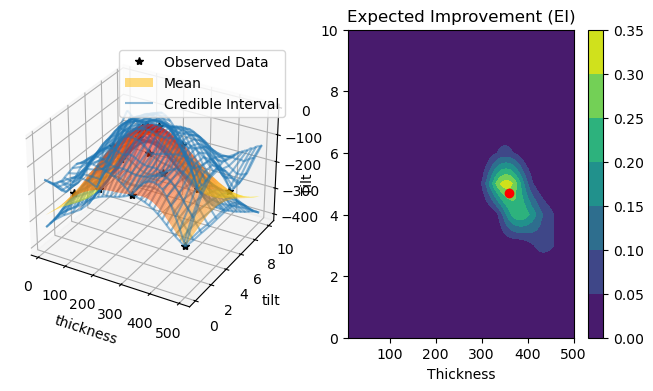

Time elapsed (hh:mm:ss.ms):  0:06:26.621392 

Seed 12: Best obj -0.0 from iteration # 13 at x of 252.87490323686572 and 4.6891377802372745



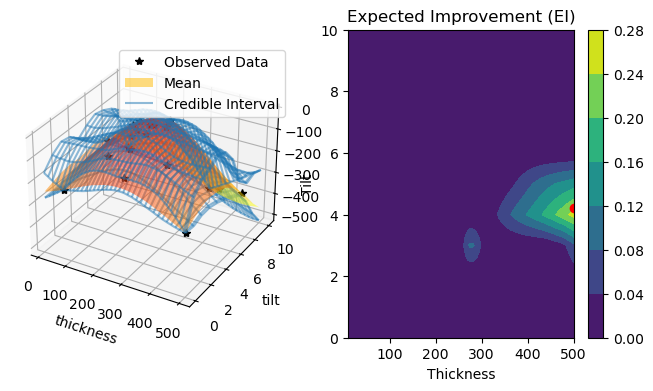

Time elapsed (hh:mm:ss.ms):  0:05:05.270687 

Seed 13: Best obj -0.0 from iteration # 4 at x of 258.2372647873661 and 4.834710881326314



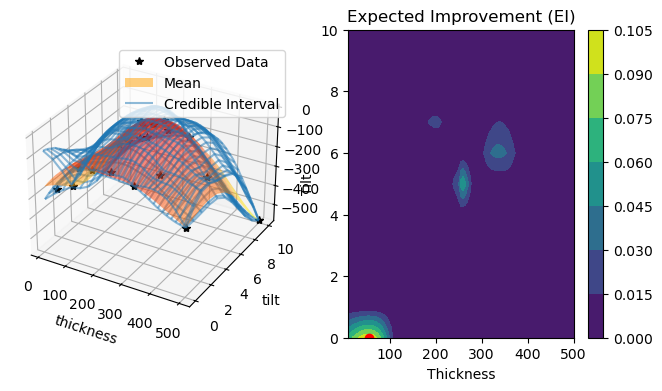

Time elapsed (hh:mm:ss.ms):  0:02:34.237598 

Seed 14: Best obj -0.0 from iteration # 17 at x of 254.05829825577786 and 4.507301642325224



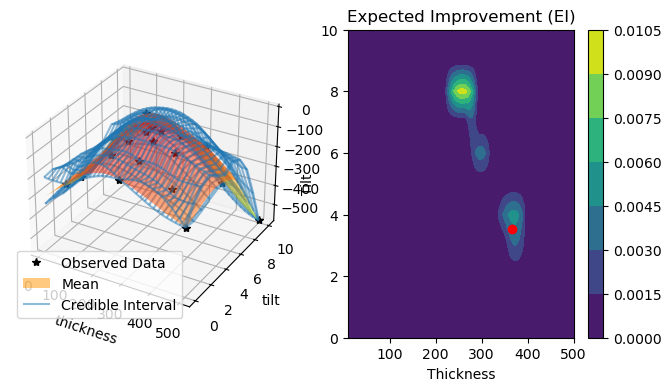

Time elapsed (hh:mm:ss.ms):  0:06:33.380856 

Seed 15: Best obj -0.0 from iteration # 8 at x of 255.19164329922972 and 4.35386235585457



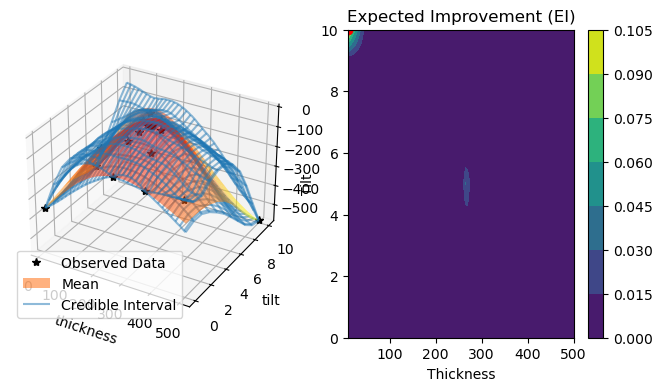

Time elapsed (hh:mm:ss.ms):  0:03:22.458354 

Seed 16: Best obj -0.840473608502009 from iteration # 23 at x of 268.8387470603875 and 4.523798149364079



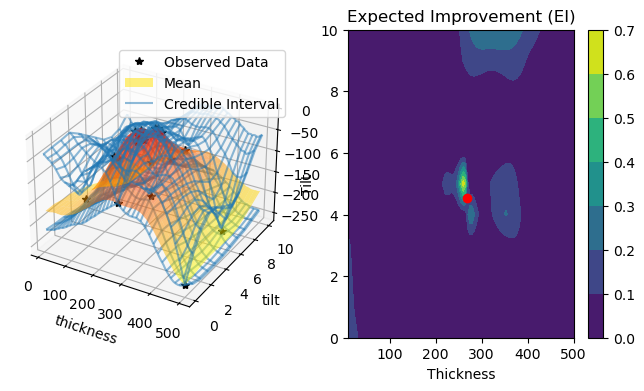

Time elapsed (hh:mm:ss.ms):  0:05:45.931368 

Seed 17: Best obj -0.0 from iteration # 14 at x of 253.5026369358663 and 4.203741924773534



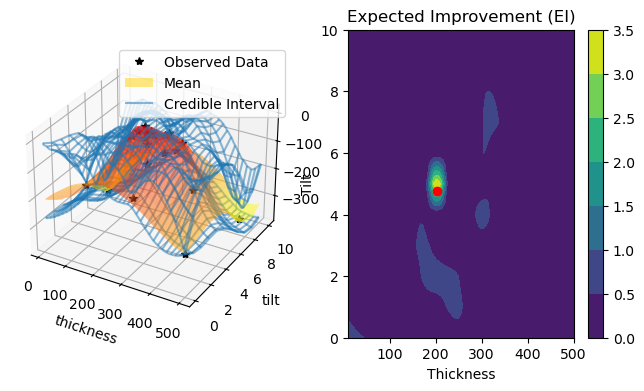

Time elapsed (hh:mm:ss.ms):  0:07:07.646460 

Seed 18: Best obj -0.0 from iteration # 7 at x of 255.40974616746175 and 4.102816227018323



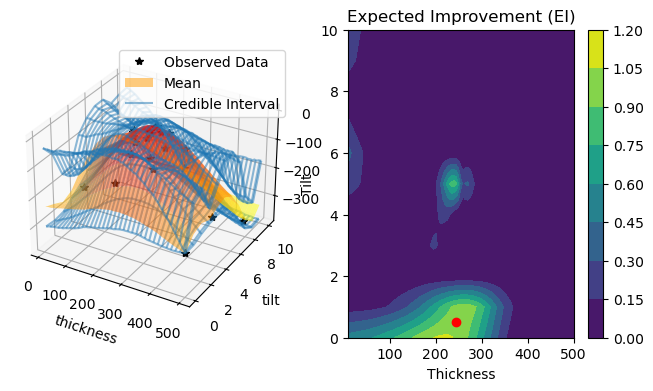

Time elapsed (hh:mm:ss.ms):  0:09:00.158849 

Seed 19: Best obj -0.0 from iteration # 11 at x of 250.7220239800489 and 4.826711909446347



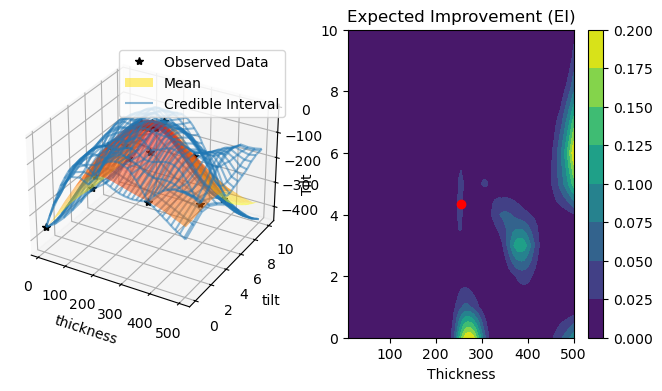

Time elapsed (hh:mm:ss.ms):  0:05:59.178469 



In [45]:
# gridx1,gridx2 = torch.meshgrid(torch.linspace(lower,upper,101),torch.linspace(0,10,11))
# for p in [5,10,1,2,3]:#[1,2,3,5,6,10,15]:
#     textLog = open('20250204-textLog_patch{}.txt'.format(p),'w')
#     numPatches= p
#     numPix = y_raw.shape[0]//numPatches
#     textLog.write('numPatches: {}, numPix: {}\n'.format(numPatches, numPix))

#     y_patC = intoPatches(y_raw, numPatches, numPix) # compute reference values for patches
#     y_obsC = computeY(y_raw, numPatches, numPix) # compute reference values
#     #add_dataC(new_x,numPat,numPx, x=None, y=None, obj=None):
#     #generate_initial_data(n_initial_points,numPat,numPx)

#     bestArr = []
#     objArr = []
#     xArr = []
#     timeArr = []
#     totimeArr = [] #total time array
#     textLog.write("\n\n======Patch: {}======\n".format(numPatches))
    
#     with warnings.catch_warnings():
#         warnings.simplefilter("ignore")
#         for seed in range(20):
#             textLog.write('\n---------Seed: {}---------\n'.format(seed))
#             start = datetime.now()
#             textLog.write(start.strftime('%Y-%m-%d %H:%M:%S'))
        
#             np.random.seed(seed)
#             torch.manual_seed(seed)
#             random.seed(seed)
    
#             n_initial_points = 4
#             n_BO_points = 20
    
#             # Generate initial data: several datapoints at random
#             # Each one of them will be uniform between 0 and 3
#             x,y,obj = generate_initial_data(n_initial_points,
#                                             numPatches, numPix)
#             g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
#             best = [obj.max().detach().item()] # This will store the best value
#             best_x_idx = obj.argmax()
#             textLog.write('Best value (thickness,tilt,obj) found: {} , {}, {}\n'.format(x[best_x_idx,0].item(),
#                                                                   x[best_x_idx,1].item(),obj[best_x_idx]))
#             textLog.write('Best value found: {}\n'.format(best[-1]))
    
#             timeIt = []
    
#             for i in range(n_BO_points): 
#                 torch.cuda.synchronize()
#                 midPoint1 = datetime.now()
    
#                 # Fit the model
#                 noise = torch.ones_like(y) * 0.0001
#                 model = FixedNoiseGP(x, y, noise,outcome_transform=Standardize(m=numPatches**2+1),input_transform=Normalize(d=2)) # GP is on y, not the objective
#                 # model = SingleTaskGP(x, y) # GP is on y, not the objective
#                 fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))
#                 #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
#                 #... for the batch. Whatever dimension in front then the dimension that i specify.
#                 #From 100 initial points, chooses 50 initial best points for the gradient descent
#                 best_obj = g(y).max() # same as -obj.min()
#                 sampler = SobolQMCNormalSampler(1024)
#                 EI = qExpectedImprovement(model=model, best_f=best_obj, objective=g,sampler=sampler)
#                 new_point, new_point_EI = optimize_acqf(
#                     acq_function=EI,
#                     bounds=torch.tensor([[lower,0], [upper,10]]).to(**tkwargs),
#                     q=1,
#                     num_restarts=50,
#                     raw_samples=100,
#                 )
#                 textLog.write(f"new_point_EI val: {new_point_EI:.5}\n")
                    
#                 x,y,obj = add_dataC(new_point,numPatches,numPix,x,y,obj)
    
#                 torch.cuda.synchronize()
#                 midPoint2 = datetime.now()
#                 timeIt.append(midPoint2-midPoint1)
                
#                 best.append(obj.max().item())
#                 best_x_idx = obj.argmax()
                
#             textLog.write('Seed {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(seed,
#                                                                                obj.max(),
#                                                                                best_x_idx,
#                                                                                x[best_x_idx][0].item(),
#                                                                                      x[best_x_idx][1].item()))
#             print('Seed {}: Best obj {} from iteration # {} at x of {} and {}\n'.format(seed,
#                                                                                obj.max(),
#                                                                                best_x_idx,
#                                                                                x[best_x_idx][0].item(),
#                                                                                      x[best_x_idx][1].item()))
    
#             # Plot the posterior and the EI
#             f, (ax1,ax2) = plt.subplots(1, 2, figsize=(8, 4))
            
#             # Plot the posterior
#             ax1.axis('off')
#             ax1 = plt.subplot(121, projection='3d') #row, col, index
#             plot_posterior_composite(ax1,model,gridx1,gridx2,x,y)
    
#             # Plot EI
#             plotEI(ax2,gridx1,gridx2,EI,new_point)
#             plt.show()
            
#             torch.cuda.synchronize()
#             end = datetime.now()
#             textLog.write(end.strftime('%Y-%m-%d %H:%M:%S'))
#             textLog.write('\nTime elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
#             print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
        
#             totimeArr.append(end-start)
    
#             bestArr.append(best)
#             xArr.append(x.cpu().squeeze().numpy())
#             timeArr.append(timeIt)
#             objArr.append(obj.cpu().squeeze().numpy())

#     bestArrS = np.array(bestArr)
#     objArrS = np.array(objArr)
#     xArrS = np.array(xArr)
#     timeArrS = np.array(timeArr)
#     totimeArrS = np.array(totimeArr)
    
#     np.savez('20250204-composite_initial4_tilt_results_20seeds_time_numPatch{}.npz'.format(numPatches),
#              xArr=xArrS,objArr=objArrS,bestArr = bestArrS, timeArr = timeArrS, totimeArr = totimeArrS)
#     torch.save(model.state_dict(),'20250204-model_numPatch{}.pth'.format(numPatches))

#     textLog.close()

In [44]:
textLog.close()

In [ ]:
tensor.device
model.to(device)

In [55]:
temp= np.load('20250204-composite_initial4_tilt_results_20seeds_numPatch3.npz',allow_pickle=True)

In [61]:
del temp

In [56]:
temp.files

['xArr', 'objArr', 'bestArrS', 'timeArrS', 'totimeArrs']

In [58]:
temp['totimeArrs']

array([datetime.timedelta(seconds=1057, microseconds=69608),
       datetime.timedelta(seconds=660, microseconds=759133),
       datetime.timedelta(seconds=351, microseconds=15622)], dtype=object)

Patch:  3

---------Seed: 0---------
Best value (thickness,tilt,obj) found: 242.8025245666504 , 6.332715928554535
Best value found: -44.87051773071289
new_point_EI val: 33.075
new_point_EI val: 15.583
new_point_EI val: 5.5154
new_point_EI val: 2.6484
new_point_EI val: 1.1651
new_point_EI val: 0.66663
new_point_EI val: 0.42112
new_point_EI val: 0.0016345
new_point_EI val: 0.20445
new_point_EI val: 0.0
new_point_EI val: 0.10264
new_point_EI val: 0.075381
new_point_EI val: 0.0
new_point_EI val: 14.479
new_point_EI val: 3.2364
new_point_EI val: 1.6711
new_point_EI val: 1.216
new_point_EI val: 0.47054
new_point_EI val: 0.21675
new_point_EI val: 0.59701
Seed 0: Best obj -0.0 from iteration # 7 at x of 256.1750793457031 and 4.130221366882324


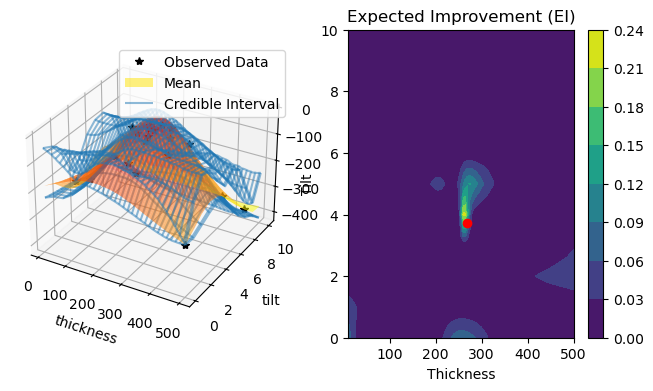

Time elapsed (hh:mm:ss.ms):  0:17:37.069608 


---------Seed: 1---------
Best value (thickness,tilt,obj) found: 328.46445386298 , 2.1474995091557503
Best value found: -55.12577438354492
new_point_EI val: 46.982
new_point_EI val: 28.505
new_point_EI val: 7.402
new_point_EI val: 4.7575
new_point_EI val: 4.28
new_point_EI val: 4.3487
new_point_EI val: 1.333
new_point_EI val: 0.60925
new_point_EI val: 0.10649
new_point_EI val: 0.09601
new_point_EI val: 0.094037
new_point_EI val: 0.0
new_point_EI val: 0.062283
new_point_EI val: 0.049774
new_point_EI val: 0.041987
new_point_EI val: 0.0
new_point_EI val: 0.0
new_point_EI val: 0.0058313
new_point_EI val: 0.0
new_point_EI val: 0.019198
Seed 1: Best obj -0.0 from iteration # 11 at x of 257.15863037109375 and 4.477258205413818


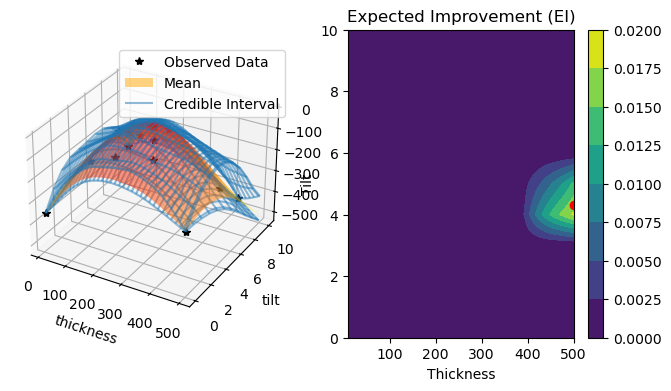

Time elapsed (hh:mm:ss.ms):  0:11:00.759133 


---------Seed: 2---------
Best value (thickness,tilt,obj) found: 370.0899780727923 , 4.746861164458096
Best value found: -69.673828125
new_point_EI val: 50.106
new_point_EI val: 26.82
new_point_EI val: 14.073
new_point_EI val: 6.4261
new_point_EI val: 5.8585
new_point_EI val: 1.895
new_point_EI val: 1.3931
new_point_EI val: 1.4351
new_point_EI val: 0.91184
new_point_EI val: 1.2503
new_point_EI val: 1.2841
new_point_EI val: 0.41398
new_point_EI val: 0.08461
new_point_EI val: 0.0
new_point_EI val: 0.19078
new_point_EI val: 0.0030256
new_point_EI val: 0.0
new_point_EI val: 0.0
new_point_EI val: 0.0
new_point_EI val: 0.0
Seed 2: Best obj -0.0 from iteration # 13 at x of 257.31634521484375 and 4.43016242980957


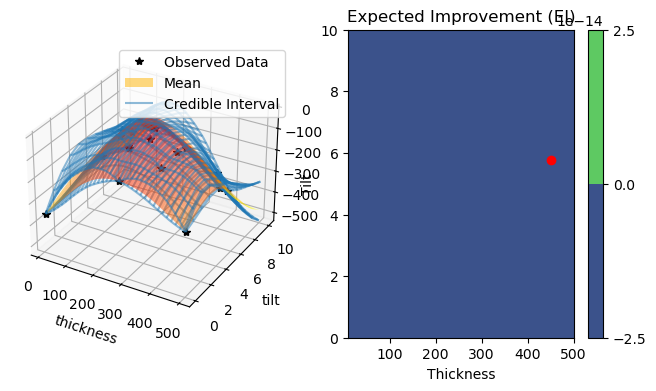

Time elapsed (hh:mm:ss.ms):  0:05:51.015622 



In [25]:
bestArr = []
objArr = []
xArr = []
timeArr = []
totimeArr = [] #total time array
print("Patch: ", numPatches)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    gridx1,gridx2 = torch.meshgrid(torch.linspace(lower,upper,101),torch.linspace(0,10,11))
    for seed in range(3): #20
        print('\n---------Seed: {}---------'.format(seed))
        start = datetime.now()
    
        np.random.seed(seed)
        torch.manual_seed(seed)
        random.seed(seed)

        n_initial_points = 4
        n_BO_points = 20

        # Generate initial data: several datapoints at random
        # Each one of them will be uniform between 0 and 3
        x,y,obj = generate_initial_data(n_initial_points=n_initial_points)
        g = GenericMCObjective(objective=lambda _y,**kwargs: - (torch.sum( (_y[...,:-1]-torch.tensor(y_obsC[...,:-1]).unsqueeze(0)).pow(2) , dim=-1)+_y[...,-1]) )
        best = [obj.max().detach().item()] # This will store the best value
        best_x_idx = obj.argmax()
        print('Best value (thickness,tilt,obj) found: {} , {}'.format(x[best_x_idx,0].item(),
                                                              x[best_x_idx,1].item(),obj[best_x_idx]))
        print('Best value found: {}'.format(best[-1]))

        timeIt = []

        for i in range(n_BO_points): 
            torch.cuda.synchronize()
            midPoint1 = datetime.now()

            # Fit the model
            noise = torch.ones_like(y) * 0.0001
            model = FixedNoiseGP(x, y, noise,outcome_transform=Standardize(m=numPatches**2+1),input_transform=Normalize(d=2)) # GP is on y, not the objective
            # model = SingleTaskGP(x, y) # GP is on y, not the objective
            fit_gpytorch_model(ExactMarginalLogLikelihood(model.likelihood, model))
            #g = GenericMCObjective(objective=lambda _y: -(_y[:,:9]-torch.tensor(y_obsC[:9])).pow(2).mean(dim=-1) +_y[:,9] )
            #... for the batch. Whatever dimension in front then the dimension that i specify.
            #From 100 initial points, chooses 50 initial best points for the gradient descent
            best_obj = g(y).max() # same as -obj.min()
            sampler = SobolQMCNormalSampler(1024)
            EI = qExpectedImprovement(model=model, best_f=best_obj, objective=g,sampler=sampler)
            new_point, new_point_EI = optimize_acqf(
                acq_function=EI,
                bounds=torch.tensor([[lower,0], [upper,10]]).float(),
                q=1,
                num_restarts=50,
                raw_samples=100,
            )
            print(f"new_point_EI val: {new_point_EI:.5}")
                
            x,y,obj = add_dataC(new_point,x,y,obj)

            torch.cuda.synchronize()
            midPoint2 = datetime.now()
            timeIt.append(midPoint2-midPoint1)
            
            best.append(obj.max().item())
            best_x_idx = obj.argmax()
            
        print('Seed {}: Best obj {} from iteration # {} at x of {} and {}'.format(seed,
                                                                           obj.max(),
                                                                           best_x_idx,
                                                                           x[best_x_idx][0].item(),
                                                                                 x[best_x_idx][1].item()))

        # Plot the posterior and the EI
        f, (ax1,ax2) = plt.subplots(1, 2, figsize=(8, 4))
        
        # Plot the posterior
        ax1.axis('off')
        ax1 = plt.subplot(121, projection='3d') #row, col, index
        plot_posterior_composite(ax1,model,gridx1,gridx2,x,y)

        # Plot EI
        plotEI(ax2,gridx1,gridx2,EI,new_point)
        plt.show()
        
        torch.cuda.synchronize()
        end = datetime.now()
        print('Time elapsed (hh:mm:ss.ms):  {} \n'.format(end-start))
        totimeArr.append(end-start)

        bestArr.append(best)
        xArr.append(x.squeeze().numpy())
        timeArr.append(timeIt)
        objArr.append(obj.squeeze().numpy())

In [36]:
numPatches

3

In [35]:
# bestArrS = np.array(bestArr)
# objArrS = np.array(objArr)
# xArrS = np.array(xArr)
# timeArrS = np.array(timeArr)
# totimeArrS = np.array(totimeArr)

# np.savez('20250204-composite_initial4_tilt_results_20seeds_numPatch{}.npz'.format(numPatches),
#          xArr=xArrS,objArr=objArrS,bestArrS = bestArrS, timeArrS = timeArrS, totimeArrS = totimeArrS)

## archive

In [48]:
bestArr = np.array(bestArr)

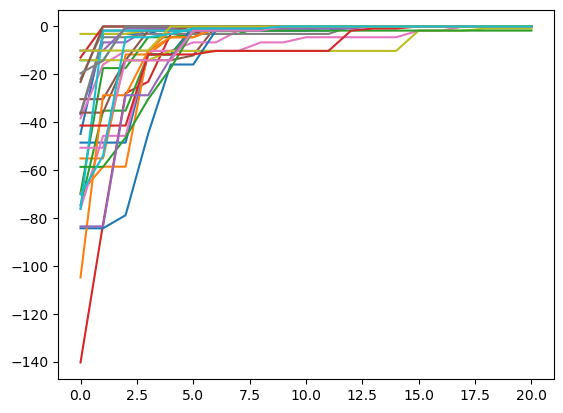

In [49]:
#3 total patches
plt.figure()
plt.plot(bestArr.T);

### plot

In [50]:
bestArr = np.array(bestArr)
xArr = np.array(xArr)
np.savez('20250108-composite_initial4_3patchesTotal.npz',bestArr=bestArr,xArr = xArr)

### archive

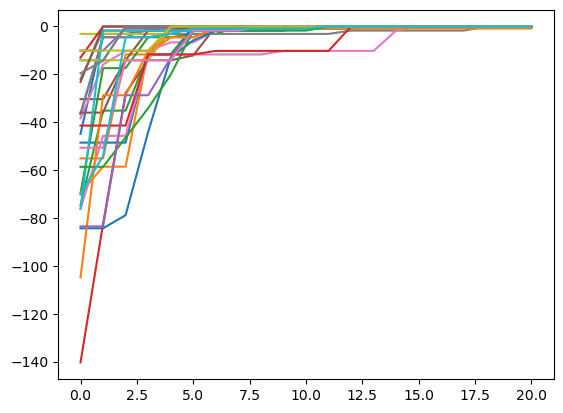

In [46]:
plt.figure()
plt.plot(bestArr.T);

In [47]:
bestAvg = np.mean(bestArr,axis=0)
bestStd = np.std(bestArr,axis=0)

Text(0, 0.5, 'Objective')

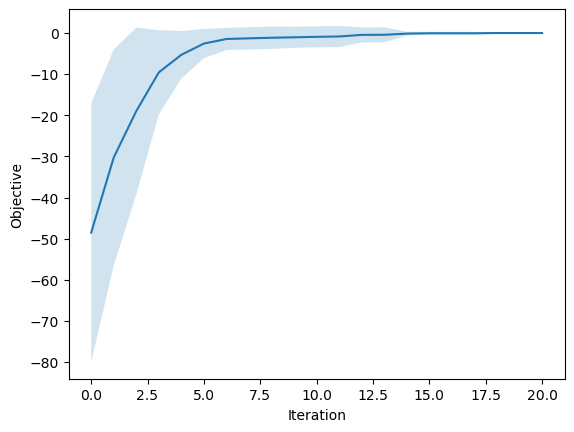

In [48]:
plt.figure()
plt.plot(bestAvg)
plt.fill_between(range(len(bestAvg)),bestAvg-bestStd,bestAvg+bestStd,alpha=0.2)
plt.xlabel('Iteration')
plt.ylabel('Objective')

## TODOs
20241204 <br>
- Evaluate the performance for x(thickness, tilt): is it worth using composite when tilt is added? What is the actual minimal cost of simulation? (e.g. ~4 seconds for classical BO vs. 30 sec - 1min for composite BO for 20 iterations/simulations)
- New simulated datasets. write a function to crop accordingly

## archive - other options
Plotting all 10 components

In [ ]:
x_domain = torch.linspace(lower, upper, 1000).unsqueeze(-1).to(torch.double)
def plot_model_EI(model,acqf,iter_no):
    fig,axis = plt.subplots(6, 2, figsize=(10, 15), gridspec_kw={'hspace': 0.5, 'wspace': 0.3})
    x_domain = torch.linspace(lower, upper, 1000).unsqueeze(-1).to(torch.double)

    post_at_x_domain = model.posterior(x_domain)
    mean_at_x_domain = post_at_x_domain.mean
    std_at_x_domain = torch.sqrt(post_at_x_domain.variance)
    lo_at_x_domain = mean_at_x_domain-1.96*std_at_x_domain
    up_at_x_domain = mean_at_x_domain+1.96*std_at_x_domain
    count_idx = 0
    for i in range(5):
        for j in range(2):
            axis[i,j].set_title(plot_name[count_idx])
            axis[i,j].plot(x,y[...,count_idx].detach().numpy(),marker='*', linestyle='none', markersize=10, color='black')
            axis[i,j].plot(x_domain,mean_at_x_domain[...,count_idx].detach().numpy(),color='blue',linewidth=2,label='Prediction')
            axis[i,j].fill_between(x_domain.squeeze(-1),lo_at_x_domain[...,count_idx].detach().numpy(),up_at_x_domain[...,count_idx].detach().numpy(),alpha=0.2,color='blue',label='Uncertainty')
            axis[i,j].legend()
            count_idx+=1
    inner_sample = IIDNormalSampler(sample_shape=torch.Size([2048])) #define based sample
    samples = inner_sample(post_at_x_domain) # do the sample
    samples_obj = g(samples)
    samplesmedian,_ = samples_obj.median(dim=0)
    samples025 = samples_obj.quantile(q=0.25,dim=0)
    samples0975 = samples_obj.quantile(q=0.975,dim=0)
    axis[5,0].set_title(plot_name[count_idx])
    axis[5,0].plot(x,g(y).squeeze(0).detach().numpy(),marker='*', linestyle='none', markersize=10, color='black')
    axis[5,0].plot(x_domain,samplesmedian.detach().numpy(),color='red',linewidth=2,label='Prediction')
    axis[5,0].fill_between(x_domain.squeeze(-1),samples025.detach().numpy(),samples0975.detach().numpy(),alpha=0.2,color='red',label='Uncertainty')
    axis[5,0].legend()
    count_idx+=1
    acqf_val = acqf(x_domain.unsqueeze(-1))
    axis[5,1].set_title(plot_name[count_idx])
    axis[5,1].plot(x_domain,acqf_val.detach().numpy(),color='green',label='EI')
    axis[5,1].plot(new_point.detach().numpy(),new_point_EI.detach().numpy(),marker='*',linestyle='none', markersize=10, color='yellow',label='Candidate')
    axis[5,1].legend()
    plt.suptitle(f"Iteration {iter_no}", fontsize=14, y=0.91)  # Reduce `y` to bring closer
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust subplot grid to fit universal title
    plt.show()